## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

camera_cal/calibration1.jpg: corners not found
camera_cal/calibration4.jpg: corners not found
camera_cal/calibration5.jpg: corners not found


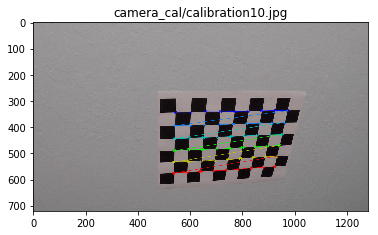

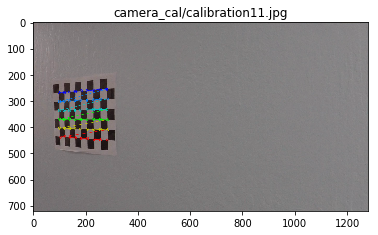

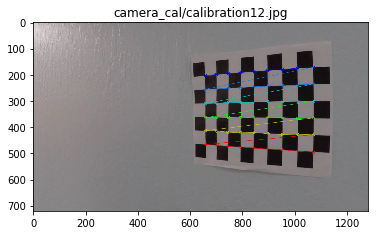

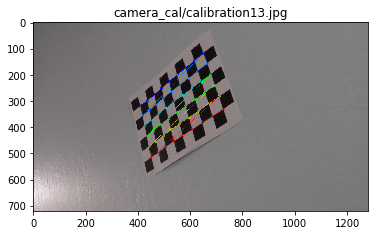

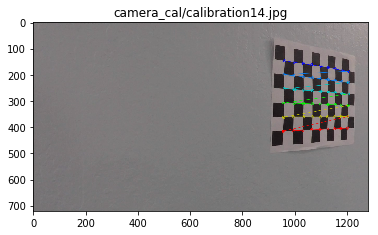

...

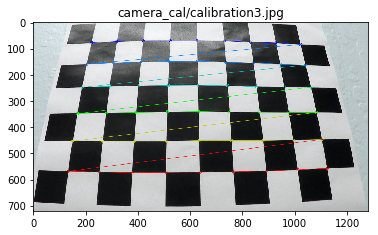

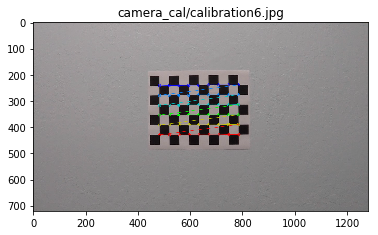

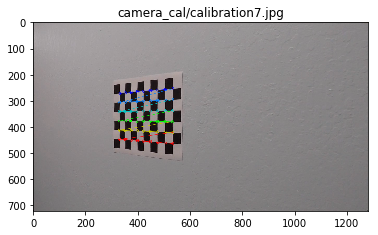

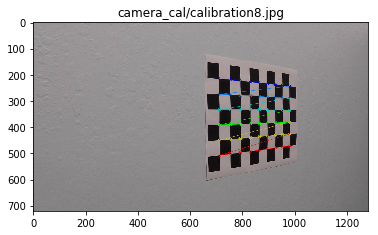

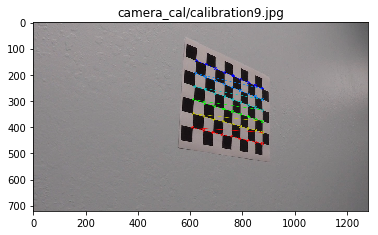

In [355]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
images_tbc = []

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.figure()
        plt.imshow(img)
        plt.title(fname)
    else:
        print(fname+": corners not found")
        images_tbc.append(fname)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1],img.shape[0]), None, None)



## Apply a distortion correction to raw images

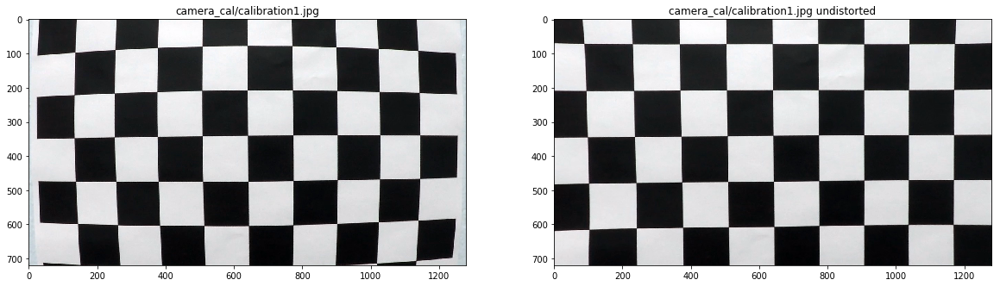

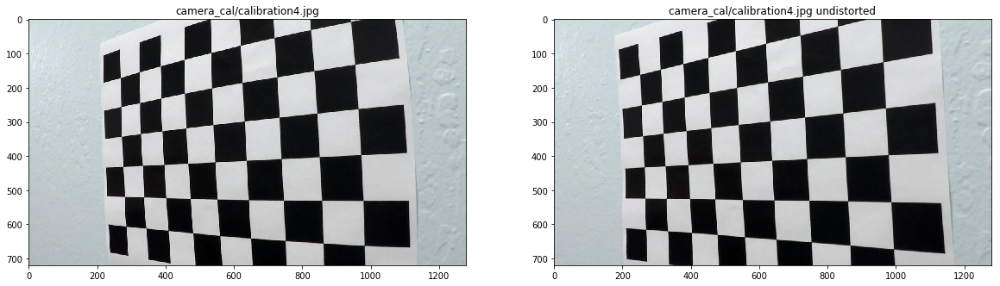

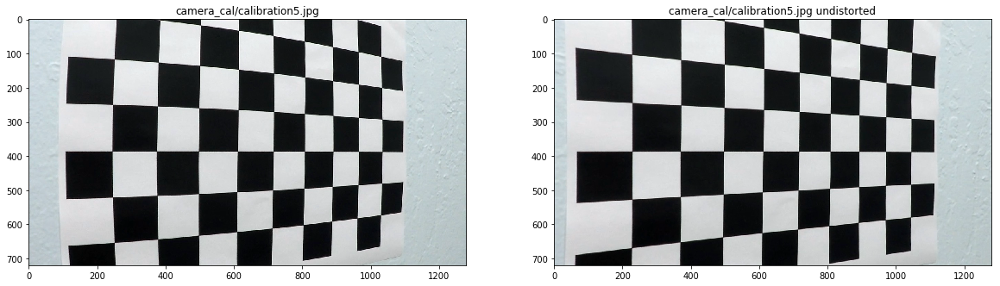

In [116]:
for fname in images_tbc:
    # Read in an image
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(fname)
    plt.subplot(1,2,2)
    plt.imshow(undistorted)
    plt.title(fname + " undistorted")


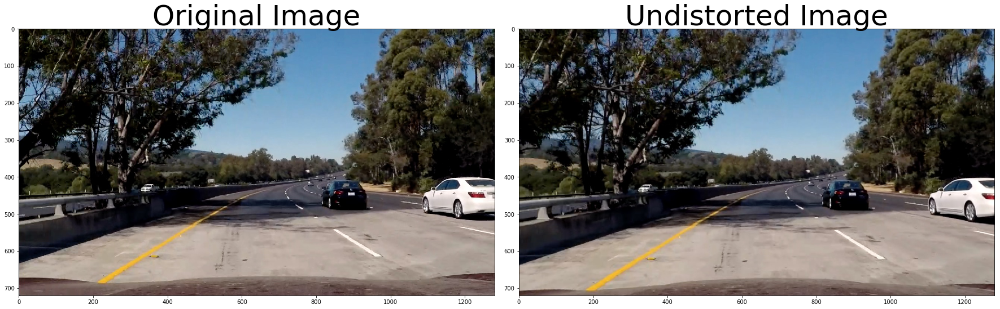

In [803]:
import matplotlib.image as mpimg

image = mpimg.imread('test_images/test5.jpg')
# Run the function
undist = cv2.undistort(image, mtx, dist, None, mtx)# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Define gradient and color transforms to help detect lane lines

### Sobel threshhold on x and y direction

In [81]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh=(0,255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    # Convert to HLS and pick the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(s_channel, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(s_channel, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

### Sobel magnitube

In [82]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    # Convert to HLS and pick the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

### Direction of gradient after applying Sobel x and y

In [83]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    # Convert to HLS and pick the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

### Threshhold only

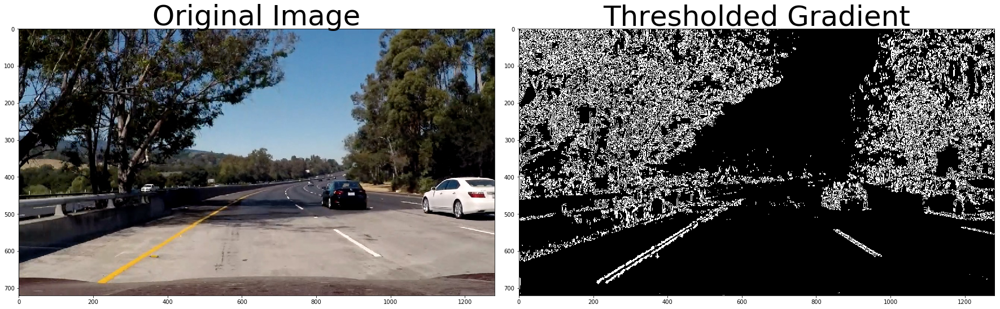

In [807]:
image = mpimg.imread('test_images/test5.jpg')
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=5, thresh=(20, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Threshhold Magnitude

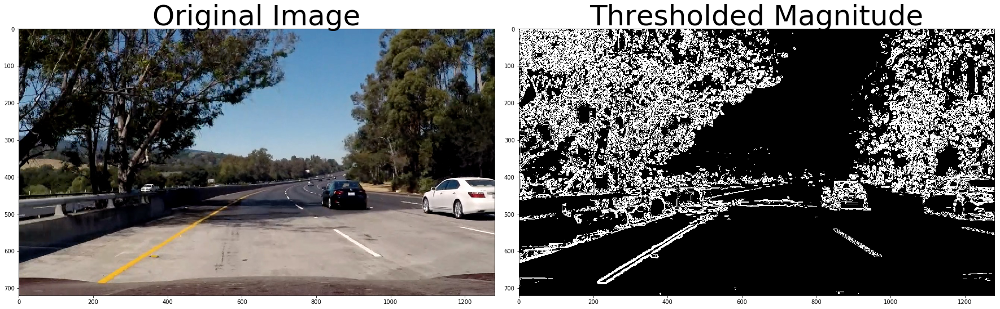

In [808]:
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(30, 150))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Threshold gradient with direction

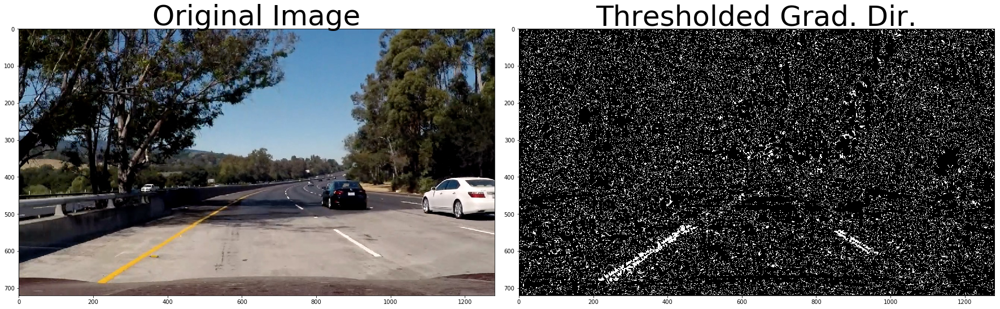

In [809]:
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.9, 1.1))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Combined Sobel gradient x and gradient y or magnitude and direction

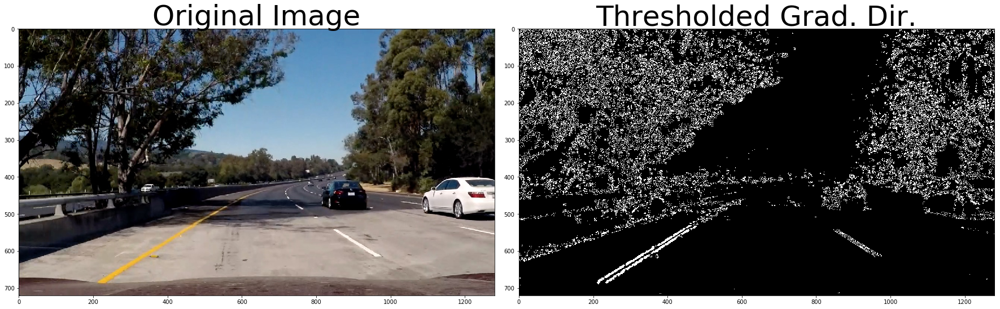

In [810]:
# Choose a Sobel kernel size

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=5, thresh=(20, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=5, thresh=(20, 100))
mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(30, 150))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.9, 1.1))

sb_combined = np.zeros_like(dir_binary)
sb_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sb_combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### HLS color space with S and L channel threshold

In [811]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, s_thresh=(0, 255), l_thresh=(30,255)):
    # 1) Convert to HLS color space
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1]) & (l_channel > l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    return binary_output

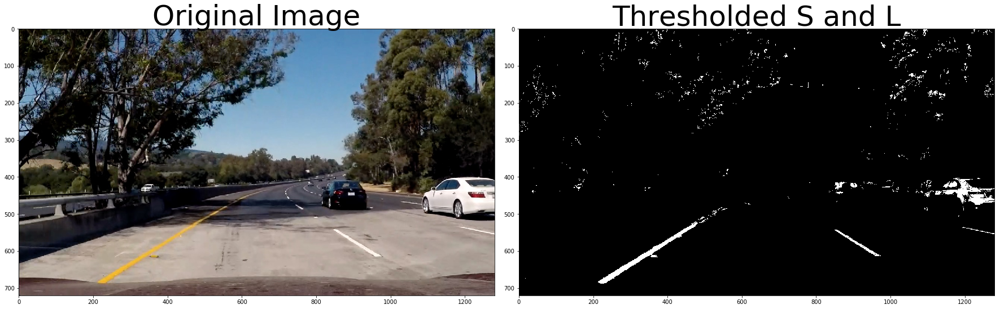

In [812]:
hls_binary = hls_select(image, s_thresh=(120, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S and L', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### HLS color space threshold + Combined Sobel gradient threshold

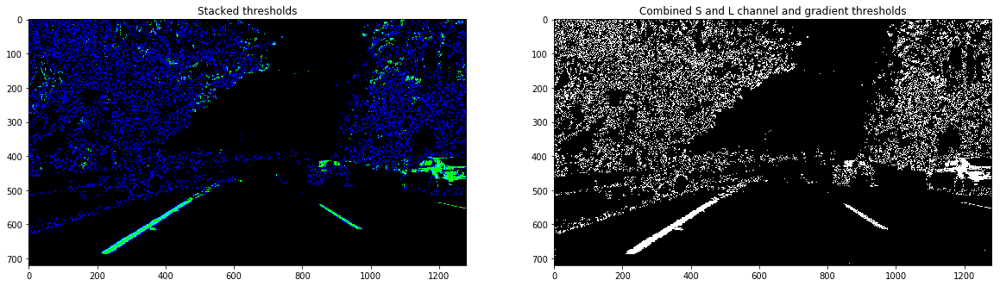

In [813]:
# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(hls_binary), hls_binary, sb_combined))

# Combine the two binary thresholds
combined_binary = np.zeros_like(hls_binary)
combined_binary[(hls_binary == 1) | (sb_combined == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S and L channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

## Perspective transform

In [815]:
def corners_unwarp(img, src, mtx, dist):
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    # 2) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    # 3) use cv2.getPerspectiveTransform() to get M, the transform matrix
    # 4) use cv2.warpPerspective() to warp your image to a top-down view
    
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Search for corners in the grayscaled image
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 250 pixels is not exact, but close enough for our purpose here
    offset = 250 # offset for dst points
    # Grab the image shape
    img_size = (undist.shape[1], undist.shape[0])

    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[src[0,0] - offset, 0], [src[1,0] + offset, 0], \
                      [src[1,0] + offset, src[2,1]], [src[0,0] - offset, src[3,1]]])
    print(dst)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    MInv = cv2.getPerspectiveTransform(dst, src)

    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)

    return warped, M, MInv

[[ 342.    0.]
 [ 938.    0.]
 [ 938.  720.]
 [ 342.  720.]]


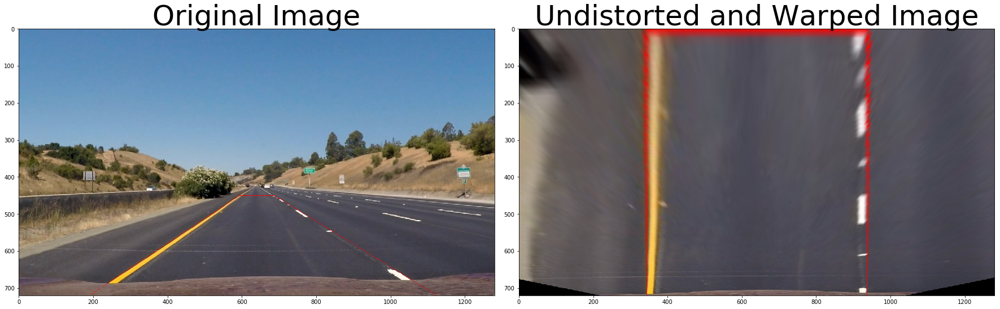

In [816]:
image=plt.imread('test_images/straight_lines1.jpg')
src = np.float32([[592,450],[688,450],[1125,720],[190,720]])

cv2.line(image, tuple(src[0]), tuple(src[1]), color=[255,0,0], thickness=1)
cv2.line(image, tuple(src[1]), tuple(src[2]), color=[255,0,0], thickness=1)
cv2.line(image, tuple(src[2]), tuple(src[3]), color=[255,0,0], thickness=1)
cv2.line(image, tuple(src[3]), tuple(src[0]), color=[255,0,0], thickness=1)


top_down, M, MInv = corners_unwarp(image, src, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Binarize the image and ploynomial fit the lane line

### Binarize based on the settings in the previous section

In [455]:
def binarize(image):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=5, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=5, thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=5, mag_thresh=(30, 255))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.9, 1.1))

    sb_combined = np.zeros_like(dir_binary)
    sb_combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    hls_binary = hls_select(image, s_thresh=(120, 255))

    color_binary = np.dstack(( np.zeros_like(hls_binary), hls_binary, sb_combined))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(hls_binary)
    combined_binary[(hls_binary == 1) | (sb_combined == 1)] = 1
    
    return color_binary, combined_binary

### Keep only the lane line part by masking the region of interest 

In [456]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

### Start developing a pipeline with previously defined methods: undistort + binarize

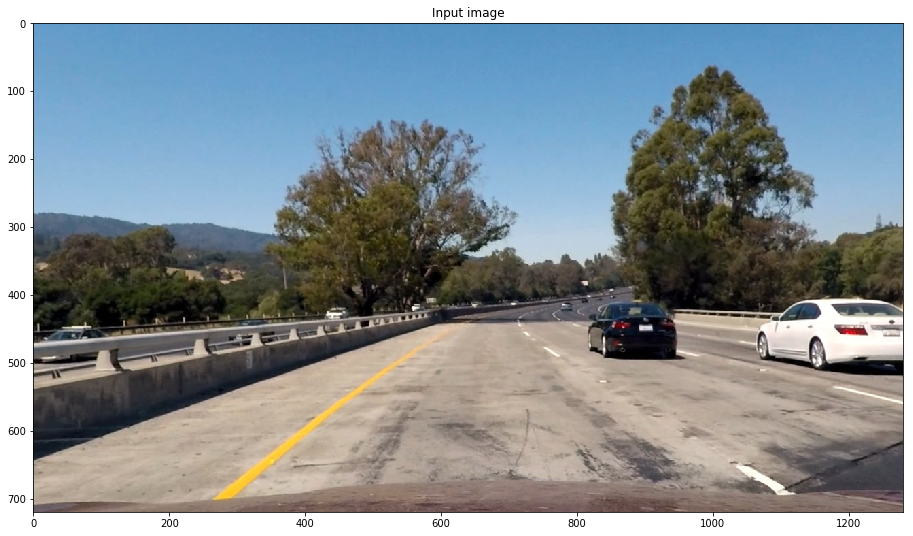

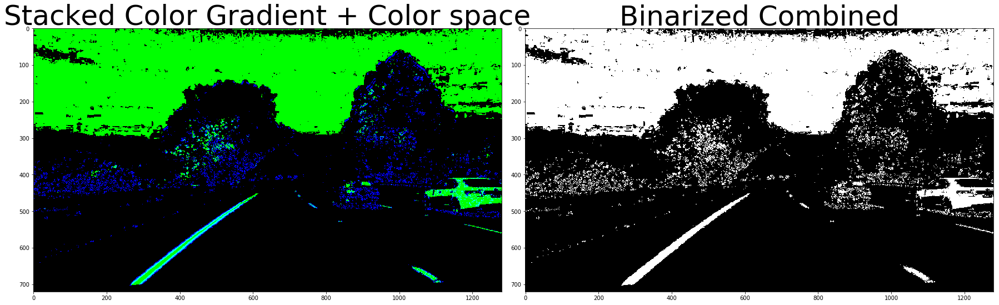

In [820]:
image=plt.imread('test_images/test1.jpg')
undist = cv2.undistort(image, mtx, dist, None, mtx)
plt.figure(figsize=(24,9))
plt.imshow(undist)
plt.title('Input image')
b_color, b_combined = binarize(undist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(b_color)
ax1.set_title('Stacked Color Gradient + Color space', fontsize=50)
ax2.imshow(b_combined, cmap='gray')
ax2.set_title('Binarized Combined', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Region of interest + change perspective to bird eye view

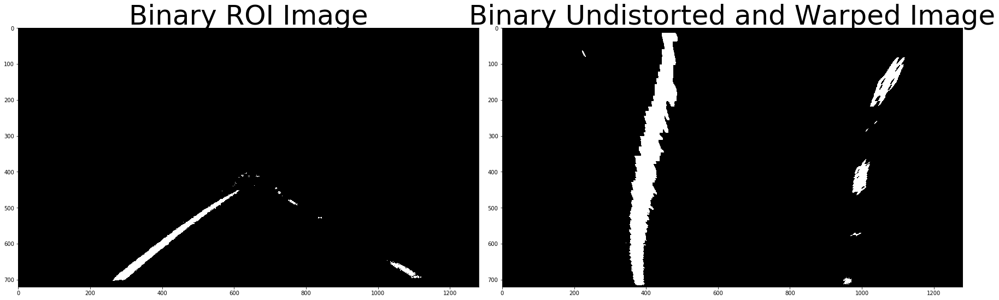

In [821]:
imshape = b_combined.shape
vertices = np.array([[(100, imshape[0]),(imshape[1]/2-10, imshape[0]/2+42),(imshape[1]/2+10, imshape[0]/2+42), (imshape[1], imshape[0])]], dtype=np.int32)

roi = region_of_interest(b_combined, vertices)

img_size = (undist.shape[1], undist.shape[0])

# Warp the image using OpenCV warpPerspective()
binary_warped = cv2.warpPerspective(roi, M, img_size, flags=cv2.INTER_LINEAR)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(roi, cmap='gray')
ax1.set_title('Binary ROI Image', fontsize=50)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Binary Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Save the camera matrix, distortion coefficients, perspective matrix and its inverse for future use

In [507]:
import pickle
dist_pickle = {}
dist_pickle['mtx'] = mtx
dist_pickle['dist'] = dist
dist_pickle['M'] = perspective_M
dist_pickle['MInv'] = perspective_MInv
pickle.dump(dist_pickle, open( "dist.p", "wb" ) )


### Use 2nd order polynominal to fit the lane line

In [822]:
def fit_lane_line(binary_warped, left_fit = None, right_fit = None):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # only need to search within the margin of previous frame's curves
    if left_fit != None and right_fit != None:
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    else:
        print("first frame")
        histogram = np.sum(binary_warped[360:,:], axis=0)
        # Create an output image to draw on and  visualize the result
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit


first frame


(720, 0)

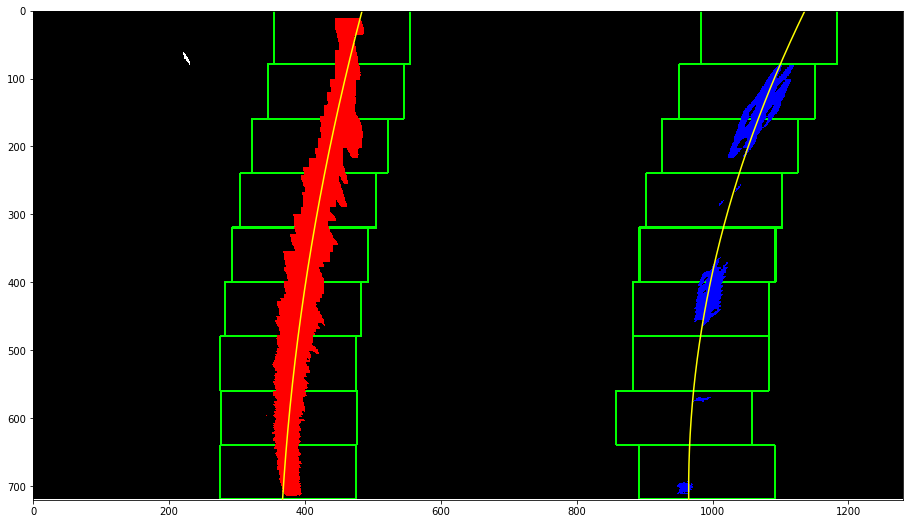

In [823]:
out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_lane_line(binary_warped)
plt.figure(figsize=(24, 9))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Calculate the curve radius and offset to centor of road in unit of meters

In [714]:
def get_stats(ploty, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    line_pos_left = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    line_pos_right = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    offset = ((line_pos_left + line_pos_right) / 2 - 640) * xm_per_pix
    return left_curverad, right_curverad, offset, line_pos_left, line_pos_right

In [824]:
print(get_stats(ploty, left_fit, right_fit))

(1167.0040611385377, 475.50979799082, 0.13768365073003938, 367.21990145555054, 964.87661503689674)


## Project the lane line area back to undistorted input image

In [825]:
def project_lane_lines(binary_warped, undist, left_fitx, right_fitx, ploty, MInv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, MInv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image

    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    return result
    

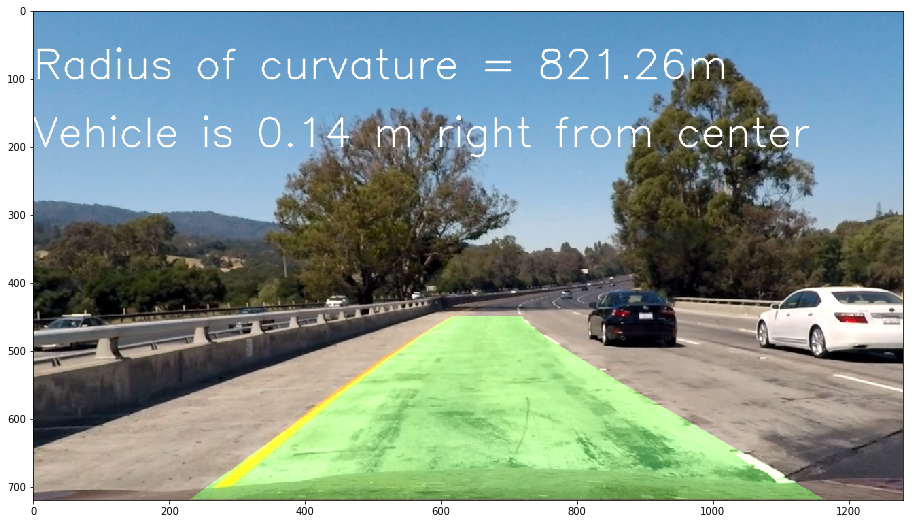

In [826]:
result = project_lane_lines(binary_warped, undist, left_fitx, right_fitx, ploty, MInv)
left_curverad, right_curverad, offset, line_pos_left, line_pos_right = get_stats(ploty, left_fit, right_fit)
str_curverad = 'Radius of curvature = {0:.2f}m'.format((left_curverad + right_curverad) / 2)
str_offset = 'Vehicle is {} m {} from center'.format(round(offset,2), 'right' if offset > 0 else 'left')
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(result,str_curverad,(0,100), font, 2,(255,255,255),2,cv2.LINE_AA)
cv2.putText(result,str_offset,(0,200), font, 2,(255,255,255),2,cv2.LINE_AA)    
plt.figure(figsize=(24, 9))
plt.imshow(result)

In [733]:
def process_image(img_path, mtx, dist, M, MInv):
    image=plt.imread(img_path)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    b_color, b_combined = binarize(undist)
    imshape = b_combined.shape
    vertices = np.array([[(100, imshape[0]),(imshape[1]/2-10, imshape[0]/2+42),(imshape[1]/2+10, imshape[0]/2+42), (imshape[1], imshape[0])]], dtype=np.int32)
    roi = region_of_interest(b_combined, vertices)
    img_size = (imshape[1], imshape[0])
    # Warp the image using OpenCV warpPerspective()
    binary_warped = cv2.warpPerspective(roi, M, img_size, flags=cv2.INTER_LINEAR)
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_lane_line(binary_warped)
    result = project_lane_lines(binary_warped, undist, left_fitx, right_fitx, ploty, MInv)
    left_curverad, right_curverad, offset, line_pos_left, line_pos_right = get_stats(ploty, left_fit, right_fit)
    str_curverad = 'Radius of curvature = {0:.2f}m'.format((left_curverad + right_curverad) / 2)
    str_offset = 'Vehicle is {} m {} from center'.format(round(offset,2), 'right' if offset > 0 else 'left')
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,str_curverad,(0,100), font, 2,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,str_offset,(0,200), font, 2,(255,255,255),2,cv2.LINE_AA)    
    plt.figure(figsize=(24, 9))
    plt.imshow(result)

first frame


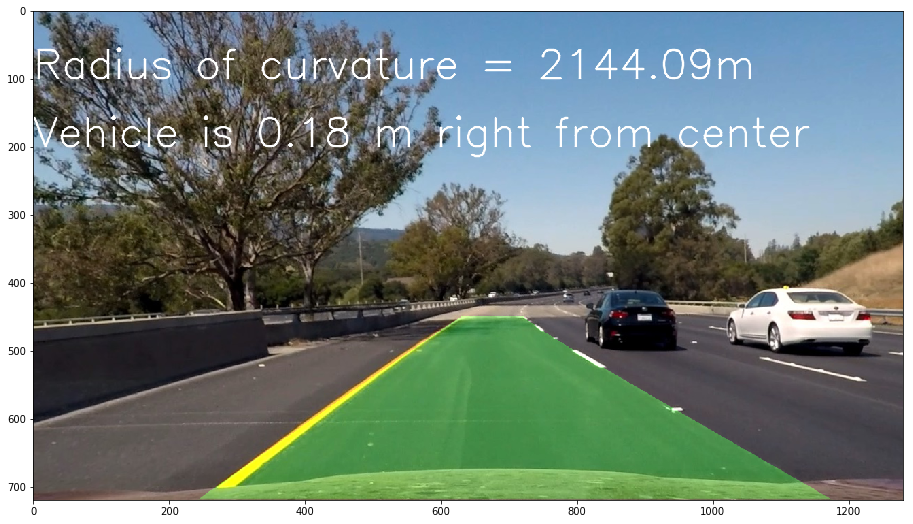

In [734]:
process_image('test_images/test6.jpg', mtx, dist, M, MInv)

## Video Pipeline and Sanity check of detected lane lines

In [773]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        # average x values of the fitted line over the last n iterations
        self.bestx = None    
        # polynomial coefficients of the last n fits
        self.recent_fits = []
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #x values for detected line pixels
        self.allx = None  
        
    def update(self, pos, curverad, fit, fitx):
        self.detected = True
        self.radius_of_curvature = curverad
        self.current_fit = fit
        self.allx = fitx
        if len(self.recent_xfitted) > 5:
            self.recent_xfitted.pop(0)
        self.recent_xfitted.append(pos)
        self.bestx = sum(self.recent_xfitted) / len(self.recent_xfitted)
        if len(self.recent_fits) > 5:
            self.recent_fits.pop(0)
        self.recent_fits.append(fit)
        self.best_fit = [x/len(self.recent_fits) for x in [ sum(x) for x in zip(*self.recent_fits) ]]
        

In [799]:
def line_sanity(left, right, line_pos_left, line_pos_right, left_curverad, right_curverad, left_fit, right_fit, left_fitx, right_fitx):
    # left and right line has similar curvature
    if np.linalg.norm(left_fit - right_fit) / np.linalg.norm((left_fit+right_fit)/2) < 1.3:
        # left and right line are not too far away from center
        if 640 - line_pos_left < 500 and line_pos_right - 640 < 500:
            # left and right x position are not too far from previous detection
            if abs(left.bestx - line_pos_left) < 25 and abs(right.bestx - line_pos_right) < 25:
                # left and right coefficients are close to previous detection
                if np.linalg.norm(left_fit - left.best_fit) < 200 and np.linalg.norm(right_fit - right.best_fit) < 200:
                    # radius difference within 10x
                    if max(left_curverad,right_curverad) / min(left_curverad,right_curverad) < 10:
                        left.update(line_pos_left, left_curverad, left_fit, left_fitx)
                        right.update(line_pos_right, right_curverad, right_fit, right_fitx)
                        return True
                    else:
                        print(abs(left_curverad - right_curverad))
                        print('failed sanity: radius diff')
                else:
                    print(np.linalg.norm(left_fit - left.best_fit))
                    print(np.linalg.norm(right_fit - right.best_fit))
                    print('failed sanity: left and right line coefficient')
            else:
                print(abs(left.bestx - line_pos_left))
                print(abs(right.bestx - line_pos_right))
                print('failed sanity: line distance from previous detection')
        else:
            print('failed sanity: line distance from center')
    else:
        print(np.linalg.norm(left_fit - right_fit) / np.linalg.norm((left_fit+right_fit)/2))
        print('failed sanity: left and right line curvature')
    left.detected = False
    right.detected = False
    return False     

In [800]:
def process_image_in_video(image):
    global mtx
    global dist
    global M
    global MInv
    global left_fit_prev
    global right_fit_prev
    global left
    global right
    global frame_count
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    b_color, b_combined = binarize(undist)
    imshape = b_combined.shape
    vertices = np.array([[(100, imshape[0]),(imshape[1]/2-10, imshape[0]/2+42),(imshape[1]/2+10, imshape[0]/2+42), (imshape[1], imshape[0])]], dtype=np.int32)
    roi = region_of_interest(b_combined, vertices)
    img_size = (imshape[1], imshape[0])
    # Warp the image using OpenCV warpPerspective()
    binary_warped = cv2.warpPerspective(roi, M, img_size, flags=cv2.INTER_LINEAR)
    try:
        out_img, left_fitx, right_fitx, ploty, left_fit, right_fit = fit_lane_line(binary_warped, left_fit_prev, right_fit_prev)
    except:
        left_fitx = left.allx
        right_fitx = right.allx
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fit = left.current_fit
        right_fit = right.current_fit

    left_curverad, right_curverad, offset, line_pos_left, line_pos_right = get_stats(ploty, left_fit, right_fit)
    # sanity check, if detected, update and use the new line detected, otherwise use the previous line
    if 0 == frame_count:
        result = project_lane_lines(binary_warped, undist, left_fitx, right_fitx, ploty, MInv)
        left.update(line_pos_left, left_curverad, left_fit, left_fitx)
        right.update(line_pos_right, right_curverad, right_fit, right_fitx)
    elif line_sanity(left, right, line_pos_left, line_pos_right, left_curverad, right_curverad, left_fit, right_fit, left_fitx, right_fitx):
        result = project_lane_lines(binary_warped, undist, left_fitx, right_fitx, ploty, MInv)
        left_fit_prev = left_fit
        right_fit_prev = right_fit
    else:
        result = project_lane_lines(binary_warped, undist, left.allx, right.allx, ploty, MInv)
        left_curverad, right_curverad, offset, line_pos_left, line_pos_right = get_stats(ploty, left.current_fit, right.current_fit)

    str_curverad = 'Radius of curvature = {0:.2f}m'.format((left_curverad + right_curverad) / 2)
    str_offset = 'Vehicle is {} m {} from center'.format(round(offset,2), 'right' if offset > 0 else 'left')
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,str_curverad,(0,100), font, 2,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,str_offset,(0,200), font, 2,(255,255,255),2,cv2.LINE_AA) 
    
    frame_count += 1
    return result

In [802]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
out_dir='./'
output = out_dir+'processed_project_video.mp4'
left_fit_prev = right_fit_prev = None
frame_count = 0
left, right = Line(), Line()
clip = VideoFileClip("project_video.mp4")
out_clip = clip.fl_image(process_image_in_video) 
%time out_clip.write_videofile(output, audio=False)

first frame
[MoviePy] >>>> Building video ./processed_project_video.mp4
[MoviePy] Writing video ./processed_project_video.mp4




















  0%|          | 0/1261 [00:00<?, ?it/s]

















  0%|          | 1/1261 [00:00<06:48,  3.08it/s]

first frame
7328.90839543
failed sanity: radius diff




















  0%|          | 2/1261 [00:00<06:29,  3.24it/s]

first frame




















  0%|          | 3/1261 [00:00<06:17,  3.33it/s]

17378.5884457
failed sanity: radius diff




















  0%|          | 4/1261 [00:01<06:04,  3.45it/s]

















  0%|          | 5/1261 [00:01<05:56,  3.52it/s]

















  0%|          | 6/1261 [00:01<05:46,  3.62it/s]

















  1%|          | 7/1261 [00:01<05:54,  3.54it/s]

















  1%|          | 8/1261 [00:02<05:47,  3.61it/s]

















  1%|          | 9/1261 [00:02<05:40,  3.67it/s]

















  1%|          | 10/1261 [00:02<05:52,  3.55it/s]

















  1%|          | 11/1261 [00:03<06:14,  3.34it/s]

















  1%|          | 12/1261 [00:03<06:19,  3.29it/s]

















  1%|          | 13/1261 [00:03<06:25,  3.24it/s]

5101.08717263
failed sanity: radius diff




















  1%|          | 14/1261 [00:04<06:34,  3.16it/s]

















  1%|          | 15/1261 [00:04<06:47,  3.06it/s]

















  1%|▏         | 16/1261 [00:04<06:30,  3.19it/s]

7324.14534506
failed sanity: radius diff




















  1%|▏         | 17/1261 [00:05<06:24,  3.24it/s]

6221.63215801
failed sanity: radius diff




















  1%|▏         | 18/1261 [00:05<06:18,  3.28it/s]

















  2%|▏         | 19/1261 [00:05<06:02,  3.43it/s]

















  2%|▏         | 20/1261 [00:05<06:13,  3.32it/s]

















  2%|▏         | 21/1261 [00:06<06:01,  3.43it/s]

1.32649053365
failed sanity: left and right line curvature




















  2%|▏         | 22/1261 [00:06<05:55,  3.49it/s]

1.38601634876
failed sanity: left and right line curvature




















  2%|▏         | 23/1261 [00:06<06:19,  3.26it/s]

1.40417421439
failed sanity: left and right line curvature




















  2%|▏         | 24/1261 [00:07<06:05,  3.39it/s]

1.38789130568
failed sanity: left and right line curvature




















  2%|▏         | 25/1261 [00:07<05:53,  3.50it/s]

















  2%|▏         | 26/1261 [00:07<06:02,  3.41it/s]

















  2%|▏         | 27/1261 [00:07<06:04,  3.38it/s]

















  2%|▏         | 28/1261 [00:08<06:05,  3.37it/s]

















  2%|▏         | 29/1261 [00:08<06:09,  3.34it/s]

















  2%|▏         | 30/1261 [00:08<06:03,  3.38it/s]

















  2%|▏         | 31/1261 [00:09<05:53,  3.48it/s]

















  3%|▎         | 32/1261 [00:09<06:06,  3.36it/s]

















  3%|▎         | 33/1261 [00:09<06:04,  3.37it/s]

















  3%|▎         | 34/1261 [00:10<06:11,  3.30it/s]

















  3%|▎         | 35/1261 [00:10<06:18,  3.24it/s]

















  3%|▎         | 36/1261 [00:10<06:27,  3.16it/s]

















  3%|▎         | 37/1261 [00:11<06:18,  3.23it/s]

















  3%|▎         | 38/1261 [00:11<06:32,  3.11it/s]

















  3%|▎         | 39/1261 [00:11<06:24,  3.18

1.31972774747
failed sanity: left and right line curvature




















  3%|▎         | 44/1261 [00:13<06:30,  3.11it/s]

1.35212129562
failed sanity: left and right line curvature




















  4%|▎         | 45/1261 [00:13<06:26,  3.14it/s]

1.3410854208
failed sanity: left and right line curvature




















  4%|▎         | 46/1261 [00:13<06:37,  3.06it/s]

1.42952641561
failed sanity: left and right line curvature




















  4%|▎         | 47/1261 [00:14<06:53,  2.94it/s]

1.42103940623
failed sanity: left and right line curvature




















  4%|▍         | 48/1261 [00:14<06:33,  3.08it/s]

1.4143457095
failed sanity: left and right line curvature




















  4%|▍         | 49/1261 [00:14<06:14,  3.24it/s]

1.41727921407
failed sanity: left and right line curvature




















  4%|▍         | 50/1261 [00:15<06:04,  3.32it/s]

1.40957643728
failed sanity: left and right line curvature




















  4%|▍         | 51/1261 [00:15<05:57,  3.38it/s]

















  4%|▍         | 52/1261 [00:15<06:21,  3.17it/s]

















  4%|▍         | 53/1261 [00:16<05:58,  3.37it/s]

















  4%|▍         | 54/1261 [00:16<05:50,  3.44it/s]

















  4%|▍         | 55/1261 [00:16<05:39,  3.55it/s]

















  4%|▍         | 56/1261 [00:16<05:34,  3.60it/s]

















  5%|▍         | 57/1261 [00:17<05:26,  3.69it/s]

















  5%|▍         | 58/1261 [00:17<05:20,  3.76it/s]

















  5%|▍         | 59/1261 [00:17<05:14,  3.82it/s]

1.34700068967
failed sanity: left and right line curvature




















  5%|▍         | 60/1261 [00:17<05:20,  3.75it/s]

















  5%|▍         | 61/1261 [00:18<05:18,  3.77it/s]

















  5%|▍         | 62/1261 [00:18<05:13,  3.82it/s]

















  5%|▍         | 63/1261 [00:18<05:12,  3.83it/s]

6806.47423622
failed sanity: radius diff




















  5%|▌         | 64/1261 [00:18<05:19,  3.74it/s]

12197.8673616
failed sanity: radius diff




















  5%|▌         | 65/1261 [00:19<05:17,  3.77it/s]

128377.092746
failed sanity: radius diff




















  5%|▌         | 66/1261 [00:19<05:16,  3.78it/s]

4472.6722518
failed sanity: radius diff




















  5%|▌         | 67/1261 [00:19<05:13,  3.80it/s]

















  5%|▌         | 68/1261 [00:20<05:15,  3.78it/s]

















  5%|▌         | 69/1261 [00:20<05:11,  3.82it/s]

















  6%|▌         | 70/1261 [00:20<05:10,  3.84it/s]

















  6%|▌         | 71/1261 [00:20<05:06,  3.88it/s]

















  6%|▌         | 72/1261 [00:21<05:07,  3.87it/s]

















  6%|▌         | 73/1261 [00:21<05:07,  3.87it/s]

















  6%|▌         | 74/1261 [00:21<05:06,  3.88it/s]

















  6%|▌         | 75/1261 [00:21<05:05,  3.88it/s]

















  6%|▌         | 76/1261 [00:22<05:08,  3.84it/s]

















  6%|▌         | 77/1261 [00:22<05:07,  3.85it/s]

















  6%|▌         | 78/1261 [00:22<05:08,  3.84it/s]

















  6%|▋         | 79/1261 [00:22<05:08,  3.84it/s]

17353.6001417
failed sanity: radius diff




















  6%|▋         | 80/1261 [00:23<05:12,  3.78it/s]

















  6%|▋         | 81/1261 [00:23<05:09,  3.82it/s]

















  7%|▋         | 82/1261 [00:23<05:06,  3.85it/s]

















  7%|▋         | 83/1261 [00:23<05:05,  3.85it/s]

















  7%|▋         | 84/1261 [00:24<05:10,  3.79it/s]

1.36362563399
failed sanity: left and right line curvature




















  7%|▋         | 85/1261 [00:24<05:09,  3.80it/s]

















  7%|▋         | 86/1261 [00:24<05:43,  3.42it/s]

















  7%|▋         | 87/1261 [00:25<06:19,  3.10it/s]

















  7%|▋         | 88/1261 [00:25<06:50,  2.86it/s]

















  7%|▋         | 89/1261 [00:25<06:54,  2.83it/s]

















  7%|▋         | 90/1261 [00:26<06:45,  2.88it/s]

















  7%|▋         | 91/1261 [00:26<07:01,  2.77it/s]

















  7%|▋         | 92/1261 [00:27<07:08,  2.73it/s]

















  7%|▋         | 93/1261 [00:27<07:15,  2.68it/s]

















  7%|▋         | 94/1261 [00:27<07:04,  2.75it/s]

















  8%|▊         | 95/1261 [00:28<07:01,  2.77it/s]

















  8%|▊         | 96/1261 [00:28<07:21,  2.64it/s]

















  8%|▊         | 97/1261 [00:28<07:17,  2.66it/s]

















  8%|▊         | 98/1261 [00:29<07:09,  2.71it/s]

















  8%|▊         | 99/1261 [00:29<06:45,  2.87

1.34507932836
failed sanity: left and right line curvature




















  9%|▊         | 110/1261 [00:33<07:03,  2.72it/s]

















  9%|▉         | 111/1261 [00:33<06:53,  2.78it/s]

















  9%|▉         | 112/1261 [00:34<07:02,  2.72it/s]

















  9%|▉         | 113/1261 [00:34<07:00,  2.73it/s]

















  9%|▉         | 114/1261 [00:34<06:33,  2.92it/s]

















  9%|▉         | 115/1261 [00:34<06:06,  3.13it/s]

8461.65785861
failed sanity: radius diff




















  9%|▉         | 116/1261 [00:35<06:20,  3.01it/s]

5582.09009557
failed sanity: radius diff




















  9%|▉         | 117/1261 [00:35<06:04,  3.14it/s]

















  9%|▉         | 118/1261 [00:35<05:45,  3.31it/s]

















  9%|▉         | 119/1261 [00:36<05:55,  3.21it/s]

















 10%|▉         | 120/1261 [00:36<06:16,  3.03it/s]

















 10%|▉         | 121/1261 [00:36<05:54,  3.22it/s]

















 10%|▉         | 122/1261 [00:37<05:52,  3.23it/s]

















 10%|▉         | 123/1261 [00:37<05:38,  3.36it/s]

















 10%|▉         | 124/1261 [00:37<05:35,  3.39it/s]

















 10%|▉         | 125/1261 [00:38<05:31,  3.42it/s]

















 10%|▉         | 126/1261 [00:38<05:16,  3.58it/s]

















 10%|█         | 127/1261 [00:38<05:06,  3.69it/s]

















 10%|█         | 128/1261 [00:38<05:32,  3.40it/s]

















 10%|█         | 129/1261 [00:39<05:22,  3.50it/s]

















 10%|█         | 130/1261 [00:39<05:11,  3.63it/s]

















 10%|█         | 131/1261 [00:

8526.25969231
failed sanity: radius diff




















 11%|█▏        | 143/1261 [00:42<04:47,  3.89it/s]

















 11%|█▏        | 144/1261 [00:42<04:47,  3.89it/s]

















 11%|█▏        | 145/1261 [00:43<04:45,  3.90it/s]

















 12%|█▏        | 146/1261 [00:43<04:43,  3.93it/s]

















 12%|█▏        | 147/1261 [00:43<04:40,  3.97it/s]

















 12%|█▏        | 148/1261 [00:44<04:43,  3.93it/s]

















 12%|█▏        | 149/1261 [00:44<04:43,  3.92it/s]

















 12%|█▏        | 150/1261 [00:44<04:43,  3.91it/s]

















 12%|█▏        | 151/1261 [00:44<04:44,  3.90it/s]

















 12%|█▏        | 152/1261 [00:45<04:46,  3.87it/s]

6344.0806242
failed sanity: radius diff




















 12%|█▏        | 153/1261 [00:45<04:46,  3.87it/s]

















 12%|█▏        | 154/1261 [00:45<04:45,  3.88it/s]

4866.60033923
failed sanity: radius diff




















 12%|█▏        | 155/1261 [00:45<04:45,  3.88it/s]

7662.77923971
failed sanity: radius diff




















 12%|█▏        | 156/1261 [00:46<04:47,  3.84it/s]

















 12%|█▏        | 157/1261 [00:46<04:45,  3.86it/s]

















 13%|█▎        | 158/1261 [00:46<04:45,  3.87it/s]

















 13%|█▎        | 159/1261 [00:46<04:44,  3.88it/s]

















 13%|█▎        | 160/1261 [00:47<04:46,  3.84it/s]

















 13%|█▎        | 161/1261 [00:47<04:44,  3.87it/s]

5818.68832448
failed sanity: radius diff




















 13%|█▎        | 162/1261 [00:47<04:44,  3.87it/s]

















 13%|█▎        | 163/1261 [00:47<04:43,  3.88it/s]

















 13%|█▎        | 164/1261 [00:48<04:43,  3.87it/s]

















 13%|█▎        | 165/1261 [00:48<04:42,  3.88it/s]

















 13%|█▎        | 166/1261 [00:48<04:40,  3.90it/s]

















 13%|█▎        | 167/1261 [00:48<04:39,  3.91it/s]

13558.6705773
failed sanity: radius diff




















 13%|█▎        | 168/1261 [00:49<04:42,  3.87it/s]

















 13%|█▎        | 169/1261 [00:49<04:38,  3.92it/s]

















 13%|█▎        | 170/1261 [00:49<04:39,  3.90it/s]

















 14%|█▎        | 171/1261 [00:49<04:37,  3.92it/s]

1.31960207878
failed sanity: left and right line curvature




















 14%|█▎        | 172/1261 [00:50<04:40,  3.89it/s]

1.44377675525
failed sanity: left and right line curvature




















 14%|█▎        | 173/1261 [00:50<04:38,  3.90it/s]

1.43093552676
failed sanity: left and right line curvature




















 14%|█▍        | 174/1261 [00:50<04:41,  3.86it/s]

1.40500775284
failed sanity: left and right line curvature




















 14%|█▍        | 175/1261 [00:50<04:40,  3.87it/s]

1.42986462548
failed sanity: left and right line curvature




















 14%|█▍        | 176/1261 [00:51<04:41,  3.85it/s]

















 14%|█▍        | 177/1261 [00:51<04:38,  3.89it/s]

















 14%|█▍        | 178/1261 [00:51<04:36,  3.91it/s]

















 14%|█▍        | 179/1261 [00:51<04:34,  3.94it/s]

















 14%|█▍        | 180/1261 [00:52<04:34,  3.93it/s]

















 14%|█▍        | 181/1261 [00:52<04:34,  3.93it/s]

















 14%|█▍        | 182/1261 [00:52<04:34,  3.93it/s]

















 15%|█▍        | 183/1261 [00:52<04:33,  3.93it/s]

















 15%|█▍        | 184/1261 [00:53<04:36,  3.89it/s]

1.32944871279
failed sanity: left and right line curvature




















 15%|█▍        | 185/1261 [00:53<04:36,  3.89it/s]

















 15%|█▍        | 186/1261 [00:53<04:35,  3.91it/s]

















 15%|█▍        | 187/1261 [00:54<04:32,  3.94it/s]

















 15%|█▍        | 188/1261 [00:54<04:35,  3.89it/s]

1.49131544697
failed sanity: left and right line curvature




















 15%|█▍        | 189/1261 [00:54<04:35,  3.89it/s]

















 15%|█▌        | 190/1261 [00:54<04:35,  3.89it/s]

















 15%|█▌        | 191/1261 [00:55<04:34,  3.90it/s]

















 15%|█▌        | 192/1261 [00:55<04:36,  3.86it/s]

















 15%|█▌        | 193/1261 [00:55<04:34,  3.89it/s]

















 15%|█▌        | 194/1261 [00:55<04:34,  3.89it/s]

2949.11827023
failed sanity: radius diff




















 15%|█▌        | 195/1261 [00:56<04:33,  3.90it/s]

















 16%|█▌        | 196/1261 [00:56<04:35,  3.86it/s]

















 16%|█▌        | 197/1261 [00:56<04:34,  3.87it/s]

1.3703858714
failed sanity: left and right line curvature




















 16%|█▌        | 198/1261 [00:56<04:34,  3.87it/s]

1.33233854686
failed sanity: left and right line curvature




















 16%|█▌        | 199/1261 [00:57<04:37,  3.83it/s]

1.3995882413
failed sanity: left and right line curvature




















 16%|█▌        | 200/1261 [00:57<04:43,  3.74it/s]

















 16%|█▌        | 201/1261 [00:57<04:40,  3.79it/s]

















 16%|█▌        | 202/1261 [00:57<04:36,  3.82it/s]

















 16%|█▌        | 203/1261 [00:58<04:32,  3.88it/s]

















 16%|█▌        | 204/1261 [00:58<04:33,  3.86it/s]

















 16%|█▋        | 205/1261 [00:58<04:32,  3.88it/s]

















 16%|█▋        | 206/1261 [00:58<04:32,  3.87it/s]

















 16%|█▋        | 207/1261 [00:59<04:31,  3.88it/s]

















 16%|█▋        | 208/1261 [00:59<04:34,  3.84it/s]

1.3292884604
failed sanity: left and right line curvature




















 17%|█▋        | 209/1261 [00:59<04:34,  3.84it/s]

















 17%|█▋        | 210/1261 [00:59<04:31,  3.87it/s]

1.35246067879
failed sanity: left and right line curvature




















 17%|█▋        | 211/1261 [01:00<04:36,  3.80it/s]

















 17%|█▋        | 212/1261 [01:00<04:53,  3.57it/s]

















 17%|█▋        | 213/1261 [01:00<05:18,  3.29it/s]

















 17%|█▋        | 214/1261 [01:01<05:33,  3.14it/s]

















 17%|█▋        | 215/1261 [01:01<05:57,  2.93it/s]

















 17%|█▋        | 216/1261 [01:02<06:07,  2.85it/s]

















 17%|█▋        | 217/1261 [01:02<05:40,  3.06it/s]

















 17%|█▋        | 218/1261 [01:02<05:21,  3.24it/s]

1.31906223049
failed sanity: left and right line curvature




















 17%|█▋        | 219/1261 [01:02<05:30,  3.15it/s]

















 17%|█▋        | 220/1261 [01:03<05:45,  3.01it/s]

















 18%|█▊        | 221/1261 [01:03<05:26,  3.18it/s]

1.3222294784
failed sanity: left and right line curvature




















 18%|█▊        | 222/1261 [01:03<05:40,  3.05it/s]

1.32184214176
failed sanity: left and right line curvature




















 18%|█▊        | 223/1261 [01:04<05:52,  2.94it/s]

1.30897504722
failed sanity: left and right line curvature




















 18%|█▊        | 224/1261 [01:04<05:42,  3.03it/s]

















 18%|█▊        | 225/1261 [01:04<05:22,  3.21it/s]

1.33559858049
failed sanity: left and right line curvature




















 18%|█▊        | 226/1261 [01:05<05:28,  3.15it/s]

1.32025820101
failed sanity: left and right line curvature




















 18%|█▊        | 227/1261 [01:05<05:31,  3.12it/s]

1.32550422525
failed sanity: left and right line curvature




















 18%|█▊        | 228/1261 [01:05<05:18,  3.25it/s]

1.32842120281
failed sanity: left and right line curvature




















 18%|█▊        | 229/1261 [01:06<05:10,  3.32it/s]

1.31289423114
failed sanity: left and right line curvature




















 18%|█▊        | 230/1261 [01:06<05:05,  3.38it/s]

















 18%|█▊        | 231/1261 [01:06<04:56,  3.47it/s]

1.32030774057
failed sanity: left and right line curvature




















 18%|█▊        | 232/1261 [01:06<04:56,  3.47it/s]

1.32263693597
failed sanity: left and right line curvature




















 18%|█▊        | 233/1261 [01:07<04:52,  3.52it/s]

1.45079646093
failed sanity: left and right line curvature




















 19%|█▊        | 234/1261 [01:07<04:54,  3.49it/s]

1.3034233909
failed sanity: left and right line curvature




















 19%|█▊        | 235/1261 [01:07<05:00,  3.42it/s]

















 19%|█▊        | 236/1261 [01:08<05:00,  3.42it/s]

















 19%|█▉        | 237/1261 [01:08<04:52,  3.50it/s]

















 19%|█▉        | 238/1261 [01:08<04:57,  3.43it/s]

















 19%|█▉        | 239/1261 [01:08<04:54,  3.47it/s]

















 19%|█▉        | 240/1261 [01:09<04:45,  3.58it/s]

1.30291252755
failed sanity: left and right line curvature




















 19%|█▉        | 241/1261 [01:09<04:40,  3.63it/s]

















 19%|█▉        | 242/1261 [01:09<04:43,  3.59it/s]

1.32865152585
failed sanity: left and right line curvature




















 19%|█▉        | 243/1261 [01:10<04:47,  3.54it/s]

1.33095578894
failed sanity: left and right line curvature




















 19%|█▉        | 244/1261 [01:10<04:56,  3.43it/s]

















 19%|█▉        | 245/1261 [01:10<04:48,  3.52it/s]

1.31530568897
failed sanity: left and right line curvature




















 20%|█▉        | 246/1261 [01:10<04:48,  3.52it/s]

















 20%|█▉        | 247/1261 [01:11<04:40,  3.61it/s]

















 20%|█▉        | 248/1261 [01:11<04:48,  3.51it/s]

















 20%|█▉        | 249/1261 [01:11<04:55,  3.43it/s]

















 20%|█▉        | 250/1261 [01:12<04:55,  3.42it/s]

















 20%|█▉        | 251/1261 [01:12<04:59,  3.37it/s]

















 20%|█▉        | 252/1261 [01:12<05:07,  3.29it/s]

















 20%|██        | 253/1261 [01:13<05:09,  3.26it/s]

















 20%|██        | 254/1261 [01:13<05:10,  3.24it/s]

4178.84892546
failed sanity: radius diff




















 20%|██        | 255/1261 [01:13<05:05,  3.29it/s]

15271.9914593
failed sanity: radius diff




















 20%|██        | 256/1261 [01:13<05:02,  3.32it/s]

















 20%|██        | 257/1261 [01:14<05:03,  3.31it/s]

















 20%|██        | 258/1261 [01:14<04:52,  3.43it/s]

1.32466578805
failed sanity: left and right line curvature




















 21%|██        | 259/1261 [01:14<05:00,  3.34it/s]

















 21%|██        | 260/1261 [01:15<04:55,  3.38it/s]

















 21%|██        | 261/1261 [01:15<04:58,  3.35it/s]

















 21%|██        | 262/1261 [01:15<04:48,  3.46it/s]

















 21%|██        | 263/1261 [01:15<04:47,  3.47it/s]

















 21%|██        | 264/1261 [01:16<04:42,  3.52it/s]

















 21%|██        | 265/1261 [01:16<04:42,  3.53it/s]

















 21%|██        | 266/1261 [01:16<04:36,  3.59it/s]

















 21%|██        | 267/1261 [01:17<04:47,  3.46it/s]

















 21%|██▏       | 268/1261 [01:17<04:38,  3.56it/s]

















 21%|██▏       | 269/1261 [01:17<04:45,  3.47it/s]

















 21%|██▏       | 270/1261 [01:17<04:37,  3.57it/s]

















 21%|██▏       | 271/1261 [01:18<04:42,  3.50it/s]

















 22%|██▏       | 272/1261 [01:18<04:48,  3.43it/s]

















 22%|██▏       | 273/1261 [01:

48306.1549095
failed sanity: radius diff




















 22%|██▏       | 277/1261 [01:19<04:30,  3.64it/s]

11213.4955994
failed sanity: radius diff




















 22%|██▏       | 278/1261 [01:20<04:32,  3.60it/s]

















 22%|██▏       | 279/1261 [01:20<04:32,  3.60it/s]

4591.17545211
failed sanity: radius diff




















 22%|██▏       | 280/1261 [01:20<04:37,  3.54it/s]

















 22%|██▏       | 281/1261 [01:21<04:34,  3.57it/s]

















 22%|██▏       | 282/1261 [01:21<04:41,  3.47it/s]

















 22%|██▏       | 283/1261 [01:21<05:03,  3.22it/s]

















 23%|██▎       | 284/1261 [01:22<05:19,  3.06it/s]

















 23%|██▎       | 285/1261 [01:22<05:27,  2.98it/s]

















 23%|██▎       | 286/1261 [01:22<05:11,  3.13it/s]

















 23%|██▎       | 287/1261 [01:22<05:03,  3.21it/s]

















 23%|██▎       | 288/1261 [01:23<05:02,  3.22it/s]

















 23%|██▎       | 289/1261 [01:23<05:18,  3.05it/s]

















 23%|██▎       | 290/1261 [01:23<05:14,  3.09it/s]

















 23%|██▎       | 291/1261 [01:24<05:18,  3.04it/s]

















 23%|██▎       | 292/1261 [01:24<05:19,  3.03it/s]

















 23%|██▎       | 293/1261 [01:24<05:07,  3.15it/s]

















 23%|██▎       | 294/1261 [01:

31338.8846357
failed sanity: radius diff




















 24%|██▍       | 301/1261 [01:27<05:01,  3.18it/s]

















 24%|██▍       | 302/1261 [01:27<05:07,  3.12it/s]

















 24%|██▍       | 303/1261 [01:28<04:52,  3.28it/s]

















 24%|██▍       | 304/1261 [01:28<04:38,  3.44it/s]

















 24%|██▍       | 305/1261 [01:28<04:33,  3.49it/s]

23180.4612536
failed sanity: radius diff




















 24%|██▍       | 306/1261 [01:28<04:36,  3.46it/s]

















 24%|██▍       | 307/1261 [01:29<04:28,  3.55it/s]

















 24%|██▍       | 308/1261 [01:29<04:24,  3.60it/s]

















 25%|██▍       | 309/1261 [01:29<04:27,  3.56it/s]

















 25%|██▍       | 310/1261 [01:30<04:38,  3.41it/s]

116068.542823
failed sanity: radius diff




















 25%|██▍       | 311/1261 [01:30<04:41,  3.37it/s]

















 25%|██▍       | 312/1261 [01:30<05:07,  3.09it/s]

















 25%|██▍       | 313/1261 [01:30<04:48,  3.28it/s]

















 25%|██▍       | 314/1261 [01:31<04:43,  3.34it/s]

















 25%|██▍       | 315/1261 [01:31<05:00,  3.15it/s]

















 25%|██▌       | 316/1261 [01:31<04:49,  3.26it/s]

















 25%|██▌       | 317/1261 [01:32<04:58,  3.16it/s]

















 25%|██▌       | 318/1261 [01:32<05:15,  2.99it/s]

















 25%|██▌       | 319/1261 [01:32<05:21,  2.93it/s]

















 25%|██▌       | 320/1261 [01:33<05:39,  2.77it/s]

















 25%|██▌       | 321/1261 [01:33<05:37,  2.79it/s]

















 26%|██▌       | 322/1261 [01:34<05:35,  2.80it/s]

















 26%|██▌       | 323/1261 [01:34<05:19,  2.94it/s]

















 26%|██▌       | 324/1261 [01:34<04:56,  3.16it/s]

















 26%|██▌       | 325/1261 [01:

12511.4909919
failed sanity: radius diff




















 27%|██▋       | 341/1261 [01:39<04:38,  3.30it/s]

















 27%|██▋       | 342/1261 [01:40<04:48,  3.18it/s]

1.94293825512
26.9464220085
failed sanity: line distance from previous detection




















 27%|██▋       | 343/1261 [01:40<04:50,  3.16it/s]

















 27%|██▋       | 344/1261 [01:40<04:53,  3.13it/s]

















 27%|██▋       | 345/1261 [01:41<04:53,  3.12it/s]

















 27%|██▋       | 346/1261 [01:41<04:52,  3.12it/s]

















 28%|██▊       | 347/1261 [01:41<04:51,  3.14it/s]

















 28%|██▊       | 348/1261 [01:42<04:47,  3.18it/s]

















 28%|██▊       | 349/1261 [01:42<04:41,  3.24it/s]

















 28%|██▊       | 350/1261 [01:42<04:50,  3.13it/s]

72212.6116408
failed sanity: radius diff




















 28%|██▊       | 351/1261 [01:42<04:47,  3.17it/s]

















 28%|██▊       | 352/1261 [01:43<04:41,  3.23it/s]

















 28%|██▊       | 353/1261 [01:43<04:44,  3.19it/s]

















 28%|██▊       | 354/1261 [01:43<04:45,  3.17it/s]

















 28%|██▊       | 355/1261 [01:44<04:45,  3.17it/s]

















 28%|██▊       | 356/1261 [01:44<04:41,  3.21it/s]

















 28%|██▊       | 357/1261 [01:44<04:44,  3.18it/s]

















 28%|██▊       | 358/1261 [01:45<04:51,  3.10it/s]

















 28%|██▊       | 359/1261 [01:45<04:36,  3.26it/s]

















 29%|██▊       | 360/1261 [01:45<04:35,  3.27it/s]

















 29%|██▊       | 361/1261 [01:46<04:38,  3.24it/s]

















 29%|██▊       | 362/1261 [01:46<04:28,  3.35it/s]

















 29%|██▉       | 363/1261 [01:46<04:32,  3.29it/s]

















 29%|██▉       | 364/1261 [01:46<04:26,  3.37it/s]

















 29%|██▉       | 365/1261 [01:

2.23081243283
27.3173177745
failed sanity: line distance from previous detection




















 29%|██▉       | 366/1261 [01:47<04:44,  3.15it/s]

















 29%|██▉       | 367/1261 [01:47<04:45,  3.13it/s]

















 29%|██▉       | 368/1261 [01:48<04:34,  3.25it/s]

















 29%|██▉       | 369/1261 [01:48<04:38,  3.20it/s]

















 29%|██▉       | 370/1261 [01:48<04:43,  3.14it/s]

















 29%|██▉       | 371/1261 [01:49<04:46,  3.11it/s]

6146.88607127
failed sanity: radius diff




















 30%|██▉       | 372/1261 [01:49<04:46,  3.10it/s]

















 30%|██▉       | 373/1261 [01:49<04:48,  3.08it/s]

















 30%|██▉       | 374/1261 [01:50<04:53,  3.02it/s]

















 30%|██▉       | 375/1261 [01:50<04:36,  3.21it/s]

















 30%|██▉       | 376/1261 [01:50<04:38,  3.18it/s]

















 30%|██▉       | 377/1261 [01:51<04:41,  3.14it/s]

















 30%|██▉       | 378/1261 [01:51<04:49,  3.05it/s]

















 30%|███       | 379/1261 [01:51<04:48,  3.06it/s]

















 30%|███       | 380/1261 [01:52<04:51,  3.03it/s]

















 30%|███       | 381/1261 [01:52<04:49,  3.04it/s]

















 30%|███       | 382/1261 [01:52<04:57,  2.95it/s]

















 30%|███       | 383/1261 [01:53<04:37,  3.16it/s]

















 30%|███       | 384/1261 [01:53<04:37,  3.16it/s]

















 31%|███       | 385/1261 [01:53<04:35,  3.18it/s]

















 31%|███       | 386/1261 [01:

15549.4422196
failed sanity: radius diff




















 31%|███       | 389/1261 [01:54<04:32,  3.20it/s]

















 31%|███       | 390/1261 [01:55<04:35,  3.16it/s]

















 31%|███       | 391/1261 [01:55<04:34,  3.17it/s]

















 31%|███       | 392/1261 [01:55<04:37,  3.13it/s]

















 31%|███       | 393/1261 [01:56<04:35,  3.15it/s]

57615.2256289
failed sanity: radius diff




















 31%|███       | 394/1261 [01:56<04:38,  3.11it/s]

















 31%|███▏      | 395/1261 [01:56<04:35,  3.14it/s]

















 31%|███▏      | 396/1261 [01:57<04:30,  3.19it/s]

















 31%|███▏      | 397/1261 [01:57<04:30,  3.20it/s]

















 32%|███▏      | 398/1261 [01:57<04:28,  3.21it/s]

















 32%|███▏      | 399/1261 [01:58<04:26,  3.24it/s]

















 32%|███▏      | 400/1261 [01:58<04:26,  3.23it/s]

















 32%|███▏      | 401/1261 [01:58<04:32,  3.16it/s]

















 32%|███▏      | 402/1261 [01:59<04:53,  2.93it/s]

















 32%|███▏      | 403/1261 [01:59<04:54,  2.92it/s]

















 32%|███▏      | 404/1261 [01:59<04:42,  3.04it/s]

















 32%|███▏      | 405/1261 [02:00<04:33,  3.13it/s]

















 32%|███▏      | 406/1261 [02:00<04:40,  3.05it/s]

















 32%|███▏      | 407/1261 [02:00<04:39,  3.05it/s]

















 32%|███▏      | 408/1261 [02:

57305.7498906
failed sanity: radius diff




















 32%|███▏      | 409/1261 [02:01<04:36,  3.08it/s]

















 33%|███▎      | 410/1261 [02:01<04:41,  3.03it/s]

















 33%|███▎      | 411/1261 [02:02<04:37,  3.06it/s]

















 33%|███▎      | 412/1261 [02:02<04:35,  3.08it/s]

















 33%|███▎      | 413/1261 [02:02<04:35,  3.08it/s]

















 33%|███▎      | 414/1261 [02:03<04:38,  3.04it/s]

















 33%|███▎      | 415/1261 [02:03<04:44,  2.98it/s]

















 33%|███▎      | 416/1261 [02:03<04:42,  2.99it/s]

















 33%|███▎      | 417/1261 [02:04<04:40,  3.01it/s]

















 33%|███▎      | 418/1261 [02:04<04:34,  3.07it/s]

















 33%|███▎      | 419/1261 [02:04<04:18,  3.26it/s]

















 33%|███▎      | 420/1261 [02:04<04:12,  3.33it/s]

















 33%|███▎      | 421/1261 [02:05<04:08,  3.39it/s]

















 33%|███▎      | 422/1261 [02:05<04:07,  3.39it/s]

















 34%|███▎      | 423/1261 [02:

4765.44498087
failed sanity: radius diff




















 34%|███▍      | 427/1261 [02:07<04:09,  3.34it/s]

11304.4521528
failed sanity: radius diff




















 34%|███▍      | 428/1261 [02:07<04:18,  3.23it/s]

12574.5308269
failed sanity: radius diff




















 34%|███▍      | 429/1261 [02:07<04:10,  3.33it/s]

















 34%|███▍      | 430/1261 [02:07<04:08,  3.35it/s]

















 34%|███▍      | 431/1261 [02:08<04:12,  3.29it/s]

















 34%|███▍      | 432/1261 [02:08<04:13,  3.27it/s]

















 34%|███▍      | 433/1261 [02:08<04:15,  3.24it/s]

















 34%|███▍      | 434/1261 [02:09<04:08,  3.32it/s]

















 34%|███▍      | 435/1261 [02:09<03:59,  3.45it/s]

















 35%|███▍      | 436/1261 [02:09<04:09,  3.31it/s]

11589.1057982
failed sanity: radius diff




















 35%|███▍      | 437/1261 [02:10<04:17,  3.20it/s]

4.85167452751
36.1647514436
failed sanity: line distance from previous detection




















 35%|███▍      | 438/1261 [02:10<04:26,  3.09it/s]

79127.1201394
failed sanity: radius diff




















 35%|███▍      | 439/1261 [02:10<04:30,  3.04it/s]

















 35%|███▍      | 440/1261 [02:11<04:13,  3.24it/s]

















 35%|███▍      | 441/1261 [02:11<04:08,  3.31it/s]

32928.596113
failed sanity: radius diff




















 35%|███▌      | 442/1261 [02:11<04:06,  3.33it/s]

13866.0807948
failed sanity: radius diff




















 35%|███▌      | 443/1261 [02:11<04:05,  3.33it/s]

















 35%|███▌      | 444/1261 [02:12<04:09,  3.27it/s]

















 35%|███▌      | 445/1261 [02:12<04:13,  3.21it/s]

















 35%|███▌      | 446/1261 [02:12<04:17,  3.16it/s]

8078.33990705
failed sanity: radius diff




















 35%|███▌      | 447/1261 [02:13<04:19,  3.14it/s]

















 36%|███▌      | 448/1261 [02:13<04:19,  3.13it/s]

















 36%|███▌      | 449/1261 [02:13<04:09,  3.25it/s]

















 36%|███▌      | 450/1261 [02:14<04:03,  3.33it/s]

67779.2045127
failed sanity: radius diff




















 36%|███▌      | 451/1261 [02:14<04:04,  3.31it/s]

6815.80209447
failed sanity: radius diff




















 36%|███▌      | 452/1261 [02:14<04:04,  3.31it/s]

6809.79776053
failed sanity: radius diff




















 36%|███▌      | 453/1261 [02:15<04:25,  3.05it/s]

10472.4203726
failed sanity: radius diff




















 36%|███▌      | 454/1261 [02:15<04:11,  3.21it/s]

















 36%|███▌      | 455/1261 [02:15<04:00,  3.35it/s]

















 36%|███▌      | 456/1261 [02:15<03:56,  3.41it/s]

















 36%|███▌      | 457/1261 [02:16<03:46,  3.55it/s]

















 36%|███▋      | 458/1261 [02:16<03:42,  3.61it/s]

















 36%|███▋      | 459/1261 [02:16<03:36,  3.70it/s]

















 36%|███▋      | 460/1261 [02:16<03:34,  3.74it/s]

















 37%|███▋      | 461/1261 [02:17<03:30,  3.80it/s]

















 37%|███▋      | 462/1261 [02:17<03:32,  3.77it/s]

















 37%|███▋      | 463/1261 [02:17<03:31,  3.78it/s]

6056.9936576
failed sanity: radius diff




















 37%|███▋      | 464/1261 [02:18<03:30,  3.79it/s]

















 37%|███▋      | 465/1261 [02:18<03:29,  3.81it/s]

















 37%|███▋      | 466/1261 [02:18<03:29,  3.79it/s]

















 37%|███▋      | 467/1261 [02:18<03:29,  3.79it/s]

















 37%|███▋      | 468/1261 [02:19<03:27,  3.82it/s]

















 37%|███▋      | 469/1261 [02:19<03:26,  3.84it/s]

















 37%|███▋      | 470/1261 [02:19<03:27,  3.82it/s]

















 37%|███▋      | 471/1261 [02:19<03:31,  3.74it/s]

41851.5802666
failed sanity: radius diff




















 37%|███▋      | 472/1261 [02:20<03:38,  3.61it/s]

















 38%|███▊      | 473/1261 [02:20<03:42,  3.54it/s]

















 38%|███▊      | 474/1261 [02:20<03:51,  3.40it/s]

















 38%|███▊      | 475/1261 [02:21<03:48,  3.44it/s]

















 38%|███▊      | 476/1261 [02:21<03:42,  3.53it/s]

28241.9469567
failed sanity: radius diff




















 38%|███▊      | 477/1261 [02:21<03:46,  3.46it/s]

5785.70989747
failed sanity: radius diff




















 38%|███▊      | 478/1261 [02:21<03:56,  3.32it/s]

11543.4567411
failed sanity: radius diff




















 38%|███▊      | 479/1261 [02:22<03:59,  3.27it/s]

16292.4266323
failed sanity: radius diff




















 38%|███▊      | 480/1261 [02:22<03:56,  3.30it/s]

60725.0129977
failed sanity: radius diff




















 38%|███▊      | 481/1261 [02:22<03:48,  3.41it/s]

















 38%|███▊      | 482/1261 [02:23<03:50,  3.37it/s]

















 38%|███▊      | 483/1261 [02:23<03:49,  3.39it/s]

















 38%|███▊      | 484/1261 [02:23<03:50,  3.37it/s]

















 38%|███▊      | 485/1261 [02:24<03:47,  3.42it/s]

602789.647022
failed sanity: radius diff




















 39%|███▊      | 486/1261 [02:24<03:44,  3.46it/s]

















 39%|███▊      | 487/1261 [02:24<03:39,  3.53it/s]

















 39%|███▊      | 488/1261 [02:24<03:38,  3.53it/s]

23718.7400085
failed sanity: radius diff




















 39%|███▉      | 489/1261 [02:25<04:02,  3.18it/s]

8819.97558012
failed sanity: radius diff




















 39%|███▉      | 490/1261 [02:25<04:17,  2.99it/s]

















 39%|███▉      | 491/1261 [02:26<04:28,  2.87it/s]

















 39%|███▉      | 492/1261 [02:26<04:22,  2.93it/s]

















 39%|███▉      | 493/1261 [02:26<04:13,  3.03it/s]

















 39%|███▉      | 494/1261 [02:26<04:10,  3.06it/s]

















 39%|███▉      | 495/1261 [02:27<04:06,  3.11it/s]

















 39%|███▉      | 496/1261 [02:27<04:02,  3.16it/s]

















 39%|███▉      | 497/1261 [02:27<03:57,  3.22it/s]

















 39%|███▉      | 498/1261 [02:28<03:57,  3.21it/s]

















 40%|███▉      | 499/1261 [02:28<03:54,  3.25it/s]

















 40%|███▉      | 500/1261 [02:28<03:53,  3.26it/s]

















 40%|███▉      | 501/1261 [02:29<03:45,  3.37it/s]

















 40%|███▉      | 502/1261 [02:29<03:44,  3.39it/s]

















 40%|███▉      | 503/1261 [02:29<03:43,  3.40it/s]

















 40%|███▉      | 504/1261 [02:

2.51135973406
37.2462035809
failed sanity: line distance from previous detection




















 40%|████      | 510/1261 [02:31<03:31,  3.54it/s]

3.45834704894
32.1648419058
failed sanity: line distance from previous detection




















 41%|████      | 511/1261 [02:31<03:35,  3.48it/s]

















 41%|████      | 512/1261 [02:32<03:38,  3.43it/s]

















 41%|████      | 513/1261 [02:32<03:35,  3.47it/s]

















 41%|████      | 514/1261 [02:32<03:31,  3.53it/s]

















 41%|████      | 515/1261 [02:33<03:39,  3.40it/s]

















 41%|████      | 516/1261 [02:33<03:29,  3.55it/s]

















 41%|████      | 517/1261 [02:33<03:23,  3.65it/s]

















 41%|████      | 518/1261 [02:33<03:25,  3.62it/s]

















 41%|████      | 519/1261 [02:34<03:18,  3.74it/s]

















 41%|████      | 520/1261 [02:34<03:14,  3.82it/s]

















 41%|████▏     | 521/1261 [02:34<03:10,  3.88it/s]

















 41%|████▏     | 522/1261 [02:34<03:10,  3.88it/s]

















 41%|████▏     | 523/1261 [02:35<03:09,  3.89it/s]

















 42%|████▏     | 524/1261 [02:35<03:06,  3.94it/s]

















 42%|████▏     | 525/1261 [02:

12880.8134917
failed sanity: radius diff




















 42%|████▏     | 528/1261 [02:36<03:10,  3.85it/s]

















 42%|████▏     | 529/1261 [02:36<03:10,  3.84it/s]

















 42%|████▏     | 530/1261 [02:37<03:11,  3.81it/s]

















 42%|████▏     | 531/1261 [02:37<03:08,  3.88it/s]

















 42%|████▏     | 532/1261 [02:37<03:05,  3.92it/s]

37710.9743367
failed sanity: radius diff




















 42%|████▏     | 533/1261 [02:37<03:06,  3.90it/s]

4.14558733896
25.6555136486
failed sanity: line distance from previous detection




















 42%|████▏     | 534/1261 [02:38<03:15,  3.72it/s]

















 42%|████▏     | 535/1261 [02:38<03:17,  3.67it/s]

















 43%|████▎     | 536/1261 [02:38<03:15,  3.70it/s]

















 43%|████▎     | 537/1261 [02:38<03:13,  3.75it/s]

















 43%|████▎     | 538/1261 [02:39<03:14,  3.72it/s]

















 43%|████▎     | 539/1261 [02:39<03:09,  3.81it/s]

18574.568538
failed sanity: radius diff




















 43%|████▎     | 540/1261 [02:39<03:09,  3.81it/s]

123933.44036
failed sanity: radius diff




















 43%|████▎     | 541/1261 [02:39<03:11,  3.76it/s]

















 43%|████▎     | 542/1261 [02:40<03:18,  3.62it/s]

27043.3498595
failed sanity: radius diff




















 43%|████▎     | 543/1261 [02:40<03:18,  3.62it/s]

















 43%|████▎     | 544/1261 [02:40<03:19,  3.60it/s]

















 43%|████▎     | 545/1261 [02:41<03:38,  3.28it/s]

















 43%|████▎     | 546/1261 [02:41<03:28,  3.42it/s]

















 43%|████▎     | 547/1261 [02:41<03:36,  3.30it/s]

















 43%|████▎     | 548/1261 [02:42<03:35,  3.31it/s]

















 44%|████▎     | 549/1261 [02:42<03:36,  3.29it/s]

















 44%|████▎     | 550/1261 [02:42<03:42,  3.20it/s]

















 44%|████▎     | 551/1261 [02:42<03:36,  3.28it/s]

















 44%|████▍     | 552/1261 [02:43<03:37,  3.26it/s]

















 44%|████▍     | 553/1261 [02:43<03:35,  3.29it/s]

















 44%|████▍     | 554/1261 [02:43<03:31,  3.35it/s]

















 44%|████▍     | 555/1261 [02:44<03:20,  3.51it/s]

















 44%|████▍     | 556/1261 [02:44<03:20,  3.51it/s]

















 44%|████▍     | 557/1261 [02:

1.33009391178
failed sanity: left and right line curvature




















 45%|████▍     | 562/1261 [02:46<03:05,  3.76it/s]

1.36766775946
failed sanity: left and right line curvature




















 45%|████▍     | 563/1261 [02:46<03:03,  3.80it/s]

















 45%|████▍     | 564/1261 [02:46<03:02,  3.81it/s]

















 45%|████▍     | 565/1261 [02:46<02:59,  3.87it/s]

0.899289562783
41.3803916013
failed sanity: line distance from previous detection




















 45%|████▍     | 566/1261 [02:47<02:58,  3.89it/s]

















 45%|████▍     | 567/1261 [02:47<02:56,  3.94it/s]

















 45%|████▌     | 568/1261 [02:47<03:03,  3.77it/s]

















 45%|████▌     | 569/1261 [02:47<03:02,  3.80it/s]

















 45%|████▌     | 570/1261 [02:48<02:59,  3.84it/s]

















 45%|████▌     | 571/1261 [02:48<02:58,  3.86it/s]

















 45%|████▌     | 572/1261 [02:48<03:00,  3.82it/s]

















 45%|████▌     | 573/1261 [02:48<02:57,  3.87it/s]

















 46%|████▌     | 574/1261 [02:49<02:56,  3.88it/s]

















 46%|████▌     | 575/1261 [02:49<02:53,  3.95it/s]

















 46%|████▌     | 576/1261 [02:49<02:53,  3.94it/s]

















 46%|████▌     | 577/1261 [02:49<02:52,  3.96it/s]

4.68653861276
34.4331632003
failed sanity: line distance from previous detection




















 46%|████▌     | 578/1261 [02:50<02:51,  3.98it/s]

0.341161186238
29.5128020639
failed sanity: line distance from previous detection




















 46%|████▌     | 579/1261 [02:50<02:49,  4.02it/s]

















 46%|████▌     | 580/1261 [02:50<02:49,  4.01it/s]

















 46%|████▌     | 581/1261 [02:50<02:47,  4.06it/s]

















 46%|████▌     | 582/1261 [02:51<02:44,  4.13it/s]

















 46%|████▌     | 583/1261 [02:51<02:43,  4.14it/s]

















 46%|████▋     | 584/1261 [02:51<02:43,  4.14it/s]

















 46%|████▋     | 585/1261 [02:51<02:42,  4.15it/s]

















 46%|████▋     | 586/1261 [02:52<02:41,  4.18it/s]

















 47%|████▋     | 587/1261 [02:52<02:41,  4.18it/s]

















 47%|████▋     | 588/1261 [02:52<02:42,  4.14it/s]

















 47%|████▋     | 589/1261 [02:52<02:41,  4.15it/s]

















 47%|████▋     | 590/1261 [02:53<02:41,  4.15it/s]

















 47%|████▋     | 591/1261 [02:53<02:39,  4.19it/s]

















 47%|████▋     | 592/1261 [02:53<02:42,  4.11it/s]

















 47%|████▋     | 593/1261 [02:

1.33747678966
failed sanity: left and right line curvature




















 47%|████▋     | 596/1261 [02:54<02:56,  3.77it/s]

















 47%|████▋     | 597/1261 [02:54<02:52,  3.86it/s]

















 47%|████▋     | 598/1261 [02:55<02:49,  3.91it/s]

1.39158545717
failed sanity: left and right line curvature




















 48%|████▊     | 599/1261 [02:55<02:51,  3.86it/s]

1.35499892761
failed sanity: left and right line curvature




















 48%|████▊     | 600/1261 [02:55<02:56,  3.74it/s]

















 48%|████▊     | 601/1261 [02:55<03:02,  3.61it/s]

















 48%|████▊     | 602/1261 [02:56<03:04,  3.57it/s]

















 48%|████▊     | 603/1261 [02:56<03:04,  3.57it/s]

















 48%|████▊     | 604/1261 [02:56<03:06,  3.51it/s]

17328.6189162
failed sanity: radius diff




















 48%|████▊     | 605/1261 [02:57<03:07,  3.49it/s]

















 48%|████▊     | 606/1261 [02:57<03:05,  3.52it/s]

206.659729474
315.042190707
failed sanity: left and right line coefficient




















 48%|████▊     | 607/1261 [02:57<02:57,  3.68it/s]

223.546070479
82.2378852038
failed sanity: left and right line coefficient




















 48%|████▊     | 608/1261 [02:57<03:02,  3.59it/s]

211.712685072
431.934149766
failed sanity: left and right line coefficient




















 48%|████▊     | 609/1261 [02:58<03:03,  3.55it/s]

189.231919407
765.758850494
failed sanity: left and right line coefficient




















 48%|████▊     | 610/1261 [02:58<03:01,  3.58it/s]

44792.7724318
failed sanity: radius diff




















 48%|████▊     | 611/1261 [02:58<03:02,  3.56it/s]

1.61673739658
failed sanity: left and right line curvature




















 49%|████▊     | 612/1261 [02:59<03:02,  3.55it/s]

2.07004435179
failed sanity: left and right line curvature




















 49%|████▊     | 613/1261 [02:59<02:59,  3.61it/s]

2.00882667382
failed sanity: left and right line curvature




















 49%|████▊     | 614/1261 [02:59<02:58,  3.62it/s]

2.00828686351
failed sanity: left and right line curvature




















 49%|████▉     | 615/1261 [02:59<02:53,  3.71it/s]

247.626454832
347.943081178
failed sanity: left and right line coefficient




















 49%|████▉     | 616/1261 [03:00<02:53,  3.72it/s]

2.00460602074
failed sanity: left and right line curvature




















 49%|████▉     | 617/1261 [03:00<02:54,  3.68it/s]

















 49%|████▉     | 618/1261 [03:00<02:49,  3.78it/s]

















 49%|████▉     | 619/1261 [03:00<02:46,  3.86it/s]

2.02314897573
failed sanity: left and right line curvature




















 49%|████▉     | 620/1261 [03:01<02:46,  3.85it/s]

1.73892687263
failed sanity: left and right line curvature




















 49%|████▉     | 621/1261 [03:01<02:49,  3.79it/s]

24.1885723719
35.0499422265
failed sanity: line distance from previous detection




















 49%|████▉     | 622/1261 [03:01<02:45,  3.86it/s]

1.41174789823
failed sanity: left and right line curvature




















 49%|████▉     | 623/1261 [03:01<02:44,  3.87it/s]

26.6446584247
31.1858378364
failed sanity: line distance from previous detection




















 49%|████▉     | 624/1261 [03:02<02:51,  3.72it/s]

23.054327214
35.3364749996
failed sanity: line distance from previous detection




















 50%|████▉     | 625/1261 [03:02<02:53,  3.66it/s]

12.7031290465
32.4536694099
failed sanity: line distance from previous detection




















 50%|████▉     | 626/1261 [03:02<02:54,  3.63it/s]

8.64848158711
33.255322722
failed sanity: line distance from previous detection




















 50%|████▉     | 627/1261 [03:03<03:03,  3.46it/s]

17.1884427752
failed sanity: left and right line curvature




















 50%|████▉     | 628/1261 [03:03<03:04,  3.43it/s]

3.97180498937
27.2526244056
failed sanity: line distance from previous detection




















 50%|████▉     | 629/1261 [03:03<03:03,  3.44it/s]

6.05374043179
258.185715175
failed sanity: line distance from previous detection




















 50%|████▉     | 630/1261 [03:03<03:04,  3.42it/s]

1.43769303396
failed sanity: left and right line curvature




















 50%|█████     | 631/1261 [03:04<03:04,  3.42it/s]

2343.59802359
failed sanity: radius diff




















 50%|█████     | 632/1261 [03:04<03:08,  3.34it/s]

72.0412609561
262.308664984
failed sanity: left and right line coefficient




















 50%|█████     | 633/1261 [03:04<03:07,  3.34it/s]

















 50%|█████     | 634/1261 [03:05<03:00,  3.48it/s]

122.361452419
277.941752944
failed sanity: left and right line coefficient




















 50%|█████     | 635/1261 [03:05<03:01,  3.46it/s]

















 50%|█████     | 636/1261 [03:05<03:01,  3.45it/s]

















 51%|█████     | 637/1261 [03:05<02:57,  3.51it/s]

















 51%|█████     | 638/1261 [03:06<03:01,  3.43it/s]

















 51%|█████     | 639/1261 [03:06<02:57,  3.51it/s]

















 51%|█████     | 640/1261 [03:06<03:00,  3.44it/s]

















 51%|█████     | 641/1261 [03:07<03:01,  3.41it/s]

















 51%|█████     | 642/1261 [03:07<03:01,  3.41it/s]

1.69712915608
35.2340791574
failed sanity: line distance from previous detection




















 51%|█████     | 643/1261 [03:07<03:00,  3.42it/s]

















 51%|█████     | 644/1261 [03:08<03:02,  3.38it/s]

















 51%|█████     | 645/1261 [03:08<03:01,  3.40it/s]

















 51%|█████     | 646/1261 [03:08<02:59,  3.42it/s]

















 51%|█████▏    | 647/1261 [03:08<02:59,  3.42it/s]

9832.95005528
failed sanity: radius diff




















 51%|█████▏    | 648/1261 [03:09<02:57,  3.45it/s]

69758.4846512
failed sanity: radius diff




















 51%|█████▏    | 649/1261 [03:09<02:53,  3.53it/s]

















 52%|█████▏    | 650/1261 [03:09<02:53,  3.51it/s]

















 52%|█████▏    | 651/1261 [03:10<02:56,  3.46it/s]

















 52%|█████▏    | 652/1261 [03:10<02:57,  3.44it/s]

















 52%|█████▏    | 653/1261 [03:10<02:50,  3.57it/s]

















 52%|█████▏    | 654/1261 [03:10<02:54,  3.48it/s]

















 52%|█████▏    | 655/1261 [03:11<03:00,  3.36it/s]

















 52%|█████▏    | 656/1261 [03:11<03:01,  3.34it/s]

















 52%|█████▏    | 657/1261 [03:11<02:56,  3.42it/s]

















 52%|█████▏    | 658/1261 [03:12<03:02,  3.30it/s]

















 52%|█████▏    | 659/1261 [03:12<03:21,  2.99it/s]

















 52%|█████▏    | 660/1261 [03:12<03:18,  3.03it/s]

















 52%|█████▏    | 661/1261 [03:13<03:05,  3.23it/s]

















 52%|█████▏    | 662/1261 [03:13<03:09,  3.17it/s]

















 53%|█████▎    | 663/1261 [03:

4.41283495167
27.5378128333
failed sanity: line distance from previous detection




















 62%|██████▏   | 777/1261 [03:44<02:08,  3.78it/s]

















 62%|██████▏   | 778/1261 [03:45<02:05,  3.84it/s]

















 62%|██████▏   | 779/1261 [03:45<02:04,  3.86it/s]

















 62%|██████▏   | 780/1261 [03:45<02:05,  3.84it/s]

















 62%|██████▏   | 781/1261 [03:45<02:05,  3.84it/s]

















 62%|██████▏   | 782/1261 [03:46<02:04,  3.84it/s]

















 62%|██████▏   | 783/1261 [03:46<02:04,  3.85it/s]

















 62%|██████▏   | 784/1261 [03:46<02:05,  3.80it/s]

















 62%|██████▏   | 785/1261 [03:47<02:05,  3.80it/s]

















 62%|██████▏   | 786/1261 [03:47<02:04,  3.83it/s]

















 62%|██████▏   | 787/1261 [03:47<02:03,  3.83it/s]

















 62%|██████▏   | 788/1261 [03:47<02:04,  3.81it/s]

















 63%|██████▎   | 789/1261 [03:48<02:03,  3.83it/s]

















 63%|██████▎   | 790/1261 [03:48<02:02,  3.84it/s]

















 63%|██████▎   | 791/1261 [03:

80869.9963621
failed sanity: radius diff




















 64%|██████▎   | 801/1261 [03:51<01:59,  3.84it/s]

















 64%|██████▎   | 802/1261 [03:51<02:00,  3.80it/s]

















 64%|██████▎   | 803/1261 [03:51<02:00,  3.81it/s]

















 64%|██████▍   | 804/1261 [03:51<01:58,  3.85it/s]

















 64%|██████▍   | 805/1261 [03:52<01:57,  3.88it/s]

















 64%|██████▍   | 806/1261 [03:52<01:58,  3.85it/s]

















 64%|██████▍   | 807/1261 [03:52<01:57,  3.86it/s]

















 64%|██████▍   | 808/1261 [03:53<01:56,  3.88it/s]

















 64%|██████▍   | 809/1261 [03:53<01:56,  3.88it/s]

















 64%|██████▍   | 810/1261 [03:53<01:56,  3.86it/s]

















 64%|██████▍   | 811/1261 [03:53<01:56,  3.86it/s]

















 64%|██████▍   | 812/1261 [03:54<01:56,  3.85it/s]

















 64%|██████▍   | 813/1261 [03:54<01:56,  3.84it/s]

















 65%|██████▍   | 814/1261 [03:54<01:56,  3.83it/s]

















 65%|██████▍   | 815/1261 [03:

3975.91953689
failed sanity: radius diff




















 65%|██████▌   | 824/1261 [03:57<01:53,  3.84it/s]

















 65%|██████▌   | 825/1261 [03:57<01:53,  3.83it/s]

















 66%|██████▌   | 826/1261 [03:57<01:56,  3.72it/s]

















 66%|██████▌   | 827/1261 [03:57<01:55,  3.77it/s]

















 66%|██████▌   | 828/1261 [03:58<01:53,  3.82it/s]

















 66%|██████▌   | 829/1261 [03:58<01:53,  3.82it/s]

















 66%|██████▌   | 830/1261 [03:58<01:54,  3.77it/s]

















 66%|██████▌   | 831/1261 [03:59<01:52,  3.82it/s]

















 66%|██████▌   | 832/1261 [03:59<01:52,  3.82it/s]

















 66%|██████▌   | 833/1261 [03:59<01:51,  3.83it/s]

















 66%|██████▌   | 834/1261 [03:59<01:51,  3.82it/s]

















 66%|██████▌   | 835/1261 [04:00<01:50,  3.84it/s]

















 66%|██████▋   | 836/1261 [04:00<01:51,  3.82it/s]

















 66%|██████▋   | 837/1261 [04:00<01:50,  3.83it/s]

















 66%|██████▋   | 838/1261 [04:

2.50655730893
34.8900967296
failed sanity: line distance from previous detection




















 70%|███████   | 883/1261 [04:12<01:40,  3.76it/s]

















 70%|███████   | 884/1261 [04:12<01:40,  3.76it/s]

















 70%|███████   | 885/1261 [04:13<01:38,  3.80it/s]

















 70%|███████   | 886/1261 [04:13<01:38,  3.81it/s]

















 70%|███████   | 887/1261 [04:13<01:37,  3.82it/s]

















 70%|███████   | 888/1261 [04:13<01:37,  3.84it/s]

















 70%|███████   | 889/1261 [04:14<01:36,  3.85it/s]

















 71%|███████   | 890/1261 [04:14<01:37,  3.79it/s]

















 71%|███████   | 891/1261 [04:14<01:37,  3.79it/s]

















 71%|███████   | 892/1261 [04:15<01:37,  3.80it/s]

















 71%|███████   | 893/1261 [04:15<01:36,  3.83it/s]

















 71%|███████   | 894/1261 [04:15<01:37,  3.78it/s]

















 71%|███████   | 895/1261 [04:15<01:36,  3.79it/s]

















 71%|███████   | 896/1261 [04:16<01:35,  3.82it/s]

















 71%|███████   | 897/1261 [04:

5.38517443108
27.9083244383
failed sanity: line distance from previous detection




















 74%|███████▍  | 931/1261 [04:25<01:26,  3.79it/s]

















 74%|███████▍  | 932/1261 [04:25<01:25,  3.83it/s]

















 74%|███████▍  | 933/1261 [04:25<01:25,  3.86it/s]

















 74%|███████▍  | 934/1261 [04:26<01:25,  3.81it/s]

















 74%|███████▍  | 935/1261 [04:26<01:24,  3.85it/s]

















 74%|███████▍  | 936/1261 [04:26<01:24,  3.86it/s]

















 74%|███████▍  | 937/1261 [04:26<01:24,  3.85it/s]

















 74%|███████▍  | 938/1261 [04:27<01:24,  3.84it/s]

















 74%|███████▍  | 939/1261 [04:27<01:23,  3.86it/s]

















 75%|███████▍  | 940/1261 [04:27<01:22,  3.87it/s]

















 75%|███████▍  | 941/1261 [04:27<01:22,  3.86it/s]

















 75%|███████▍  | 942/1261 [04:28<01:23,  3.83it/s]

















 75%|███████▍  | 943/1261 [04:28<01:22,  3.84it/s]

7005.48770628
failed sanity: radius diff




















 75%|███████▍  | 944/1261 [04:28<01:23,  3.82it/s]

















 75%|███████▍  | 945/1261 [04:28<01:21,  3.86it/s]

















 75%|███████▌  | 946/1261 [04:29<01:21,  3.85it/s]

















 75%|███████▌  | 947/1261 [04:29<01:21,  3.85it/s]

















 75%|███████▌  | 948/1261 [04:29<01:21,  3.85it/s]

















 75%|███████▌  | 949/1261 [04:30<01:21,  3.85it/s]

















 75%|███████▌  | 950/1261 [04:30<01:21,  3.81it/s]

















 75%|███████▌  | 951/1261 [04:30<01:21,  3.82it/s]

















 75%|███████▌  | 952/1261 [04:30<01:20,  3.83it/s]

















 76%|███████▌  | 953/1261 [04:31<01:20,  3.83it/s]

















 76%|███████▌  | 954/1261 [04:31<01:20,  3.83it/s]

















 76%|███████▌  | 955/1261 [04:31<01:20,  3.81it/s]

















 76%|███████▌  | 956/1261 [04:31<01:19,  3.82it/s]

10478.7183842
failed sanity: radius diff




















 76%|███████▌  | 957/1261 [04:32<01:19,  3.82it/s]

















 76%|███████▌  | 958/1261 [04:32<01:19,  3.82it/s]

30408.319938
failed sanity: radius diff




















 76%|███████▌  | 959/1261 [04:32<01:19,  3.81it/s]

















 76%|███████▌  | 960/1261 [04:32<01:18,  3.81it/s]

















 76%|███████▌  | 961/1261 [04:33<01:20,  3.71it/s]

















 76%|███████▋  | 962/1261 [04:33<01:20,  3.72it/s]

11187.9423904
failed sanity: radius diff




















 76%|███████▋  | 963/1261 [04:33<01:19,  3.75it/s]

















 76%|███████▋  | 964/1261 [04:33<01:18,  3.78it/s]

















 77%|███████▋  | 965/1261 [04:34<01:17,  3.81it/s]

















 77%|███████▋  | 966/1261 [04:34<01:18,  3.77it/s]

















 77%|███████▋  | 967/1261 [04:34<01:17,  3.80it/s]

157327.466569
failed sanity: radius diff




















 77%|███████▋  | 968/1261 [04:35<01:17,  3.79it/s]

















 77%|███████▋  | 969/1261 [04:35<01:16,  3.81it/s]

















 77%|███████▋  | 970/1261 [04:35<01:17,  3.78it/s]

















 77%|███████▋  | 971/1261 [04:35<01:16,  3.79it/s]

















 77%|███████▋  | 972/1261 [04:36<01:15,  3.81it/s]

















 77%|███████▋  | 973/1261 [04:36<01:15,  3.82it/s]

















 77%|███████▋  | 974/1261 [04:36<01:15,  3.80it/s]

















 77%|███████▋  | 975/1261 [04:36<01:15,  3.81it/s]

















 77%|███████▋  | 976/1261 [04:37<01:14,  3.84it/s]

















 77%|███████▋  | 977/1261 [04:37<01:13,  3.84it/s]

















 78%|███████▊  | 978/1261 [04:37<01:14,  3.81it/s]

















 78%|███████▊  | 979/1261 [04:37<01:13,  3.83it/s]

8975.25376669
failed sanity: radius diff




















 78%|███████▊  | 980/1261 [04:38<01:13,  3.83it/s]

















 78%|███████▊  | 981/1261 [04:38<01:12,  3.85it/s]

4913.82231316
failed sanity: radius diff




















 78%|███████▊  | 982/1261 [04:38<01:13,  3.82it/s]

















 78%|███████▊  | 983/1261 [04:38<01:12,  3.83it/s]

















 78%|███████▊  | 984/1261 [04:39<01:12,  3.84it/s]

















 78%|███████▊  | 985/1261 [04:39<01:11,  3.85it/s]

















 78%|███████▊  | 986/1261 [04:39<01:12,  3.80it/s]

















 78%|███████▊  | 987/1261 [04:39<01:11,  3.82it/s]

















 78%|███████▊  | 988/1261 [04:40<01:10,  3.85it/s]

















 78%|███████▊  | 989/1261 [04:40<01:10,  3.85it/s]

















 79%|███████▊  | 990/1261 [04:40<01:10,  3.83it/s]

9.67121005452
31.5212444406
failed sanity: line distance from previous detection




















 79%|███████▊  | 991/1261 [04:41<01:14,  3.64it/s]

















 79%|███████▊  | 992/1261 [04:41<01:13,  3.68it/s]

















 79%|███████▊  | 993/1261 [04:41<01:13,  3.67it/s]

















 79%|███████▉  | 994/1261 [04:41<01:13,  3.62it/s]

















 79%|███████▉  | 995/1261 [04:42<01:13,  3.60it/s]

















 79%|███████▉  | 996/1261 [04:42<01:14,  3.54it/s]

















 79%|███████▉  | 997/1261 [04:42<01:12,  3.62it/s]

















 79%|███████▉  | 998/1261 [04:43<01:11,  3.65it/s]

















 79%|███████▉  | 999/1261 [04:43<01:10,  3.72it/s]

















 79%|███████▉  | 1000/1261 [04:43<01:09,  3.75it/s]

















 79%|███████▉  | 1001/1261 [04:43<01:08,  3.78it/s]

16.6489282915
40.5147204079
failed sanity: line distance from previous detection




















 79%|███████▉  | 1002/1261 [04:44<01:08,  3.77it/s]

26.0487327451
46.8417381271
failed sanity: line distance from previous detection




















 80%|███████▉  | 1003/1261 [04:44<01:08,  3.76it/s]

32.5555443507
39.1453669043
failed sanity: line distance from previous detection




















 80%|███████▉  | 1004/1261 [04:44<01:10,  3.67it/s]

33.7615358679
31.2540629634
failed sanity: line distance from previous detection




















 80%|███████▉  | 1005/1261 [04:44<01:09,  3.70it/s]

36.5965109864
32.1493563271
failed sanity: line distance from previous detection




















 80%|███████▉  | 1006/1261 [04:45<01:09,  3.66it/s]

28.2431552463
3.19205938975
failed sanity: line distance from previous detection




















 80%|███████▉  | 1007/1261 [04:45<01:09,  3.67it/s]

31.1076027337
2.77038167177
failed sanity: line distance from previous detection




















 80%|███████▉  | 1008/1261 [04:45<01:08,  3.71it/s]

26.5403285968
0.0656470350556
failed sanity: line distance from previous detection




















 80%|████████  | 1009/1261 [04:45<01:07,  3.73it/s]

31.1510388998
2.43831085165
failed sanity: line distance from previous detection




















 80%|████████  | 1010/1261 [04:46<01:07,  3.70it/s]

29.1463090391
4.60148707665
failed sanity: line distance from previous detection




















 80%|████████  | 1011/1261 [04:46<01:07,  3.71it/s]

29.7658828085
10.1112384209
failed sanity: line distance from previous detection




















 80%|████████  | 1012/1261 [04:46<01:06,  3.73it/s]

35.7780250011
9.27833175926
failed sanity: line distance from previous detection




















 80%|████████  | 1013/1261 [04:47<01:06,  3.75it/s]

40.4221321242
12.3327195533
failed sanity: line distance from previous detection




















 80%|████████  | 1014/1261 [04:47<01:06,  3.70it/s]

30.8960305809
11.6938624063
failed sanity: line distance from previous detection




















 80%|████████  | 1015/1261 [04:47<01:06,  3.72it/s]

32.5981433935
9.09933565699
failed sanity: line distance from previous detection




















 81%|████████  | 1016/1261 [04:47<01:05,  3.74it/s]

31.4845877586
0.546884241512
failed sanity: line distance from previous detection




















 81%|████████  | 1017/1261 [04:48<01:04,  3.76it/s]

35.7662521276
7.25076585699
failed sanity: line distance from previous detection




















 81%|████████  | 1018/1261 [04:48<01:05,  3.71it/s]

42.780721121
12.5570245674
failed sanity: line distance from previous detection




















 81%|████████  | 1019/1261 [04:48<01:05,  3.71it/s]

46.6017373555
13.8347360448
failed sanity: line distance from previous detection




















 81%|████████  | 1020/1261 [04:48<01:04,  3.72it/s]

29.7966742443
10.5432849964
failed sanity: line distance from previous detection




















 81%|████████  | 1021/1261 [04:49<01:04,  3.72it/s]

32.1896673328
23.1898374234
failed sanity: line distance from previous detection




















 81%|████████  | 1022/1261 [04:49<01:05,  3.65it/s]

34.8625707955
21.5951886915
failed sanity: line distance from previous detection




















 81%|████████  | 1023/1261 [04:49<01:05,  3.65it/s]

36.270370158
21.2312952657
failed sanity: line distance from previous detection




















 81%|████████  | 1024/1261 [04:49<01:04,  3.69it/s]

41.84508023
20.6872307448
failed sanity: line distance from previous detection




















 81%|████████▏ | 1025/1261 [04:50<01:03,  3.72it/s]

41.6319259308
15.5518646965
failed sanity: line distance from previous detection




















 81%|████████▏ | 1026/1261 [04:50<01:03,  3.68it/s]

42.6368252666
16.8196766156
failed sanity: line distance from previous detection




















 81%|████████▏ | 1027/1261 [04:50<01:03,  3.70it/s]

46.4320255746
44.8153839871
failed sanity: line distance from previous detection




















 82%|████████▏ | 1028/1261 [04:51<01:02,  3.70it/s]

45.4135763093
73.6304869262
failed sanity: line distance from previous detection




















 82%|████████▏ | 1029/1261 [04:51<01:02,  3.72it/s]

40.984579713
7.60636450935
failed sanity: line distance from previous detection




















 82%|████████▏ | 1030/1261 [04:51<01:02,  3.68it/s]

50.7333220727
0.834791950625
failed sanity: line distance from previous detection




















 82%|████████▏ | 1031/1261 [04:51<01:02,  3.70it/s]

49.3326280174
18.7670729235
failed sanity: line distance from previous detection




















 82%|████████▏ | 1032/1261 [04:52<01:01,  3.72it/s]

48.3908057565
23.7330692843
failed sanity: line distance from previous detection




















 82%|████████▏ | 1033/1261 [04:52<01:00,  3.74it/s]

48.0767849301
16.4837124253
failed sanity: line distance from previous detection




















 82%|████████▏ | 1034/1261 [04:52<01:01,  3.68it/s]

55.3287234349
20.1917845243
failed sanity: line distance from previous detection




















 82%|████████▏ | 1035/1261 [04:52<01:00,  3.71it/s]

57.0281372461
22.0652815783
failed sanity: line distance from previous detection




















 82%|████████▏ | 1036/1261 [04:53<01:00,  3.72it/s]

60.6044045338
25.4065441373
failed sanity: line distance from previous detection




















 82%|████████▏ | 1037/1261 [04:53<01:00,  3.72it/s]

56.2013012231
21.4940158727
failed sanity: line distance from previous detection




















 82%|████████▏ | 1038/1261 [04:53<01:00,  3.71it/s]

55.0882197053
29.0698350351
failed sanity: line distance from previous detection




















 82%|████████▏ | 1039/1261 [04:54<00:59,  3.73it/s]

45.2648770856
18.9214533384
failed sanity: line distance from previous detection




















 82%|████████▏ | 1040/1261 [04:54<00:58,  3.77it/s]

45.581226587
49.6117903241
failed sanity: line distance from previous detection




















 83%|████████▎ | 1041/1261 [04:54<00:58,  3.78it/s]

51.3066116107
82.850610078
failed sanity: line distance from previous detection




















 83%|████████▎ | 1042/1261 [04:54<00:58,  3.73it/s]

44.665998346
32.9165044593
failed sanity: line distance from previous detection




















 83%|████████▎ | 1043/1261 [04:55<00:59,  3.65it/s]

35.5945991762
17.2750936671
failed sanity: line distance from previous detection




















 83%|████████▎ | 1044/1261 [04:55<00:58,  3.70it/s]

















 83%|████████▎ | 1045/1261 [04:55<00:57,  3.74it/s]

















 83%|████████▎ | 1046/1261 [04:55<00:56,  3.78it/s]

















 83%|████████▎ | 1047/1261 [04:56<00:56,  3.81it/s]

















 83%|████████▎ | 1048/1261 [04:56<00:56,  3.80it/s]

















 83%|████████▎ | 1049/1261 [04:56<00:55,  3.83it/s]

















 83%|████████▎ | 1050/1261 [04:56<00:54,  3.85it/s]

















 83%|████████▎ | 1051/1261 [04:57<00:54,  3.86it/s]

28.162906495
30.0794516455
failed sanity: line distance from previous detection




















 83%|████████▎ | 1052/1261 [04:57<00:54,  3.80it/s]

29.6733660636
27.8645551028
failed sanity: line distance from previous detection




















 84%|████████▎ | 1053/1261 [04:57<00:55,  3.78it/s]

32.7894055937
19.2496610314
failed sanity: line distance from previous detection




















 84%|████████▎ | 1054/1261 [04:57<00:54,  3.79it/s]

29.9317648152
7.29819402951
failed sanity: line distance from previous detection




















 84%|████████▎ | 1055/1261 [04:58<00:54,  3.79it/s]

28.7268463798
1.3031159468
failed sanity: line distance from previous detection




















 84%|████████▎ | 1056/1261 [04:58<00:54,  3.75it/s]

26.8539930944
5.74659202932
failed sanity: line distance from previous detection




















 84%|████████▍ | 1057/1261 [04:58<00:53,  3.78it/s]

















 84%|████████▍ | 1058/1261 [04:59<00:53,  3.80it/s]

















 84%|████████▍ | 1059/1261 [04:59<00:52,  3.82it/s]

















 84%|████████▍ | 1060/1261 [04:59<00:53,  3.79it/s]

















 84%|████████▍ | 1061/1261 [04:59<00:52,  3.82it/s]

25.7985866193
6.08985286273
failed sanity: line distance from previous detection




















 84%|████████▍ | 1062/1261 [05:00<00:51,  3.83it/s]

31.4319830828
10.8367370575
failed sanity: line distance from previous detection




















 84%|████████▍ | 1063/1261 [05:00<00:51,  3.82it/s]

32.3180930924
11.4391503506
failed sanity: line distance from previous detection




















 84%|████████▍ | 1064/1261 [05:00<00:52,  3.78it/s]

















 84%|████████▍ | 1065/1261 [05:00<00:51,  3.79it/s]

















 85%|████████▍ | 1066/1261 [05:01<00:51,  3.79it/s]

80056.5330053
failed sanity: radius diff




















 85%|████████▍ | 1067/1261 [05:01<00:51,  3.80it/s]

















 85%|████████▍ | 1068/1261 [05:01<00:52,  3.70it/s]

















 85%|████████▍ | 1069/1261 [05:01<00:51,  3.75it/s]

















 85%|████████▍ | 1070/1261 [05:02<00:50,  3.79it/s]

















 85%|████████▍ | 1071/1261 [05:02<00:49,  3.81it/s]

















 85%|████████▌ | 1072/1261 [05:02<00:50,  3.77it/s]

4.09179066476
41.2040790301
failed sanity: line distance from previous detection




















 85%|████████▌ | 1073/1261 [05:03<00:49,  3.78it/s]

















 85%|████████▌ | 1074/1261 [05:03<00:50,  3.68it/s]

















 85%|████████▌ | 1075/1261 [05:03<00:49,  3.73it/s]

9634.30376125
failed sanity: radius diff




















 85%|████████▌ | 1076/1261 [05:03<00:50,  3.69it/s]

















 85%|████████▌ | 1077/1261 [05:04<00:49,  3.74it/s]

















 85%|████████▌ | 1078/1261 [05:04<00:48,  3.77it/s]

















 86%|████████▌ | 1079/1261 [05:04<00:47,  3.80it/s]

















 86%|████████▌ | 1080/1261 [05:04<00:48,  3.77it/s]

















 86%|████████▌ | 1081/1261 [05:05<00:47,  3.80it/s]

















 86%|████████▌ | 1082/1261 [05:05<00:46,  3.85it/s]

















 86%|████████▌ | 1083/1261 [05:05<00:46,  3.85it/s]

















 86%|████████▌ | 1084/1261 [05:05<00:45,  3.86it/s]

7.79306001716
31.3992010399
failed sanity: line distance from previous detection




















 86%|████████▌ | 1085/1261 [05:06<00:45,  3.84it/s]

9.81266092074
27.2542291334
failed sanity: line distance from previous detection




















 86%|████████▌ | 1086/1261 [05:06<00:45,  3.83it/s]

















 86%|████████▌ | 1087/1261 [05:06<00:45,  3.84it/s]

















 86%|████████▋ | 1088/1261 [05:06<00:45,  3.78it/s]

















 86%|████████▋ | 1089/1261 [05:07<00:45,  3.80it/s]

















 86%|████████▋ | 1090/1261 [05:07<00:44,  3.81it/s]

7134.36569566
failed sanity: radius diff




















 87%|████████▋ | 1091/1261 [05:07<00:44,  3.80it/s]

















 87%|████████▋ | 1092/1261 [05:08<00:44,  3.76it/s]

















 87%|████████▋ | 1093/1261 [05:08<00:44,  3.77it/s]

















 87%|████████▋ | 1094/1261 [05:08<00:44,  3.77it/s]

















 87%|████████▋ | 1095/1261 [05:08<00:43,  3.79it/s]

13546.8642894
failed sanity: radius diff




















 87%|████████▋ | 1096/1261 [05:09<00:43,  3.79it/s]

















 87%|████████▋ | 1097/1261 [05:09<00:42,  3.81it/s]

















 87%|████████▋ | 1098/1261 [05:09<00:43,  3.76it/s]

















 87%|████████▋ | 1099/1261 [05:09<00:42,  3.78it/s]

















 87%|████████▋ | 1100/1261 [05:10<00:42,  3.78it/s]

















 87%|████████▋ | 1101/1261 [05:10<00:41,  3.81it/s]

















 87%|████████▋ | 1102/1261 [05:10<00:42,  3.76it/s]

















 87%|████████▋ | 1103/1261 [05:10<00:41,  3.77it/s]

















 88%|████████▊ | 1104/1261 [05:11<00:41,  3.80it/s]

















 88%|████████▊ | 1105/1261 [05:11<00:40,  3.81it/s]

















 88%|████████▊ | 1106/1261 [05:11<00:40,  3.80it/s]

















 88%|████████▊ | 1107/1261 [05:11<00:40,  3.80it/s]

0.76174931366
50.3671377764
failed sanity: line distance from previous detection




















 88%|████████▊ | 1108/1261 [05:12<00:40,  3.80it/s]

0.988829985819
35.7665151855
failed sanity: line distance from previous detection




















 88%|████████▊ | 1109/1261 [05:12<00:40,  3.80it/s]

0.249728113858
31.6056269417
failed sanity: line distance from previous detection




















 88%|████████▊ | 1110/1261 [05:12<00:40,  3.74it/s]

















 88%|████████▊ | 1111/1261 [05:13<00:39,  3.75it/s]

















 88%|████████▊ | 1112/1261 [05:13<00:39,  3.77it/s]

















 88%|████████▊ | 1113/1261 [05:13<00:39,  3.79it/s]

















 88%|████████▊ | 1114/1261 [05:13<00:38,  3.79it/s]

















 88%|████████▊ | 1115/1261 [05:14<00:38,  3.82it/s]

















 89%|████████▊ | 1116/1261 [05:14<00:37,  3.82it/s]

















 89%|████████▊ | 1117/1261 [05:14<00:37,  3.83it/s]

















 89%|████████▊ | 1118/1261 [05:14<00:37,  3.81it/s]

















 89%|████████▊ | 1119/1261 [05:15<00:37,  3.82it/s]

















 89%|████████▉ | 1120/1261 [05:15<00:36,  3.82it/s]

















 89%|████████▉ | 1121/1261 [05:15<00:36,  3.81it/s]

















 89%|████████▉ | 1122/1261 [05:15<00:36,  3.77it/s]

















 89%|████████▉ | 1123/1261 [05:16<00:36,  3.77it/s]

















 89%|████████▉ |

0.0437787167114
27.8711491514
failed sanity: line distance from previous detection




















 90%|████████▉ | 1130/1261 [05:18<00:34,  3.75it/s]

1.26338840247
25.8031950375
failed sanity: line distance from previous detection




















 90%|████████▉ | 1131/1261 [05:18<00:34,  3.75it/s]

















 90%|████████▉ | 1132/1261 [05:18<00:34,  3.77it/s]

















 90%|████████▉ | 1133/1261 [05:18<00:33,  3.78it/s]

















 90%|████████▉ | 1134/1261 [05:19<00:34,  3.72it/s]

















 90%|█████████ | 1135/1261 [05:19<00:33,  3.76it/s]

















 90%|█████████ | 1136/1261 [05:19<00:33,  3.77it/s]

















 90%|█████████ | 1137/1261 [05:19<00:32,  3.79it/s]

















 90%|█████████ | 1138/1261 [05:20<00:32,  3.78it/s]

















 90%|█████████ | 1139/1261 [05:20<00:32,  3.75it/s]

















 90%|█████████ | 1140/1261 [05:20<00:32,  3.77it/s]

















 90%|█████████ | 1141/1261 [05:20<00:31,  3.76it/s]

2.71691666632
26.6390641077
failed sanity: line distance from previous detection




















 91%|█████████ | 1142/1261 [05:21<00:31,  3.74it/s]

















 91%|█████████ | 1143/1261 [05:21<00:31,  3.75it/s]

















 91%|█████████ | 1144/1261 [05:21<00:31,  3.75it/s]

















 91%|█████████ | 1145/1261 [05:22<00:30,  3.77it/s]

















 91%|█████████ | 1146/1261 [05:22<00:31,  3.70it/s]

















 91%|█████████ | 1147/1261 [05:22<00:30,  3.75it/s]

















 91%|█████████ | 1148/1261 [05:22<00:29,  3.78it/s]

















 91%|█████████ | 1149/1261 [05:23<00:29,  3.80it/s]

5701.4530808
failed sanity: radius diff




















 91%|█████████ | 1150/1261 [05:23<00:29,  3.79it/s]

27211.5471203
failed sanity: radius diff




















 91%|█████████▏| 1151/1261 [05:23<00:29,  3.79it/s]

















 91%|█████████▏| 1152/1261 [05:23<00:28,  3.83it/s]

5544.65419434
failed sanity: radius diff




















 91%|█████████▏| 1153/1261 [05:24<00:28,  3.83it/s]

6041.10754755
failed sanity: radius diff




















 92%|█████████▏| 1154/1261 [05:24<00:28,  3.79it/s]

















 92%|█████████▏| 1155/1261 [05:24<00:27,  3.81it/s]

31267.2930014
failed sanity: radius diff




















 92%|█████████▏| 1156/1261 [05:24<00:27,  3.81it/s]

















 92%|█████████▏| 1157/1261 [05:25<00:27,  3.84it/s]

















 92%|█████████▏| 1158/1261 [05:25<00:27,  3.81it/s]

















 92%|█████████▏| 1159/1261 [05:25<00:26,  3.83it/s]

















 92%|█████████▏| 1160/1261 [05:25<00:26,  3.85it/s]

















 92%|█████████▏| 1161/1261 [05:26<00:26,  3.85it/s]

















 92%|█████████▏| 1162/1261 [05:26<00:25,  3.81it/s]

















 92%|█████████▏| 1163/1261 [05:26<00:25,  3.81it/s]

















 92%|█████████▏| 1164/1261 [05:27<00:25,  3.82it/s]

















 92%|█████████▏| 1165/1261 [05:27<00:25,  3.82it/s]

















 92%|█████████▏| 1166/1261 [05:27<00:25,  3.77it/s]

















 93%|█████████▎| 1167/1261 [05:27<00:24,  3.79it/s]

















 93%|█████████▎| 1168/1261 [05:28<00:24,  3.80it/s]

















 93%|█████████▎| 1169/1261 [05:28<00:24,  3.80it/s]

















 93%|█████████▎|

2.8082846176
39.8154991259
failed sanity: line distance from previous detection




















 94%|█████████▍| 1187/1261 [05:33<00:20,  3.69it/s]

















 94%|█████████▍| 1188/1261 [05:33<00:19,  3.74it/s]

















 94%|█████████▍| 1189/1261 [05:33<00:19,  3.78it/s]

















 94%|█████████▍| 1190/1261 [05:33<00:18,  3.78it/s]

















 94%|█████████▍| 1191/1261 [05:34<00:18,  3.79it/s]

















 95%|█████████▍| 1192/1261 [05:34<00:18,  3.80it/s]

















 95%|█████████▍| 1193/1261 [05:34<00:17,  3.81it/s]

















 95%|█████████▍| 1194/1261 [05:34<00:17,  3.78it/s]

















 95%|█████████▍| 1195/1261 [05:35<00:17,  3.80it/s]

















 95%|█████████▍| 1196/1261 [05:35<00:17,  3.82it/s]

















 95%|█████████▍| 1197/1261 [05:35<00:16,  3.84it/s]

















 95%|█████████▌| 1198/1261 [05:36<00:16,  3.80it/s]

















 95%|█████████▌| 1199/1261 [05:36<00:16,  3.81it/s]

















 95%|█████████▌| 1200/1261 [05:36<00:16,  3.81it/s]

















 95%|█████████▌|

2.95818355874
30.5275917764
failed sanity: line distance from previous detection




















 97%|█████████▋| 1221/1261 [05:42<00:10,  3.77it/s]

















 97%|█████████▋| 1222/1261 [05:42<00:10,  3.74it/s]

















 97%|█████████▋| 1223/1261 [05:42<00:10,  3.75it/s]

















 97%|█████████▋| 1224/1261 [05:42<00:09,  3.74it/s]

















 97%|█████████▋| 1225/1261 [05:43<00:09,  3.77it/s]

















 97%|█████████▋| 1226/1261 [05:43<00:09,  3.70it/s]

















 97%|█████████▋| 1227/1261 [05:43<00:09,  3.73it/s]

















 97%|█████████▋| 1228/1261 [05:44<00:08,  3.73it/s]

















 97%|█████████▋| 1229/1261 [05:44<00:08,  3.75it/s]

















 98%|█████████▊| 1230/1261 [05:44<00:08,  3.73it/s]

















 98%|█████████▊| 1231/1261 [05:44<00:08,  3.74it/s]

















 98%|█████████▊| 1232/1261 [05:45<00:07,  3.78it/s]

















 98%|█████████▊| 1233/1261 [05:45<00:07,  3.82it/s]

3.00158975463
26.1740476136
failed sanity: line distance from previous detection




















 98%|█████████▊| 1234/1261 [05:45<00:07,  3.78it/s]

















 98%|█████████▊| 1235/1261 [05:45<00:06,  3.78it/s]

















 98%|█████████▊| 1236/1261 [05:46<00:06,  3.80it/s]

















 98%|█████████▊| 1237/1261 [05:46<00:06,  3.81it/s]

















 98%|█████████▊| 1238/1261 [05:46<00:06,  3.79it/s]

















 98%|█████████▊| 1239/1261 [05:46<00:05,  3.78it/s]

15086.2125053
failed sanity: radius diff




















 98%|█████████▊| 1240/1261 [05:47<00:05,  3.78it/s]

















 98%|█████████▊| 1241/1261 [05:47<00:05,  3.80it/s]

















 98%|█████████▊| 1242/1261 [05:47<00:05,  3.76it/s]

3.19678810134
35.4271397334
failed sanity: line distance from previous detection




















 99%|█████████▊| 1243/1261 [05:47<00:04,  3.75it/s]

2.37108746527
37.0882631699
failed sanity: line distance from previous detection




















 99%|█████████▊| 1244/1261 [05:48<00:04,  3.76it/s]

















 99%|█████████▊| 1245/1261 [05:48<00:04,  3.77it/s]

















 99%|█████████▉| 1246/1261 [05:48<00:04,  3.75it/s]

















 99%|█████████▉| 1247/1261 [05:49<00:03,  3.76it/s]

85248.5230965
failed sanity: radius diff




















 99%|█████████▉| 1248/1261 [05:49<00:03,  3.71it/s]

















 99%|█████████▉| 1249/1261 [05:49<00:03,  3.73it/s]

















 99%|█████████▉| 1250/1261 [05:49<00:03,  3.57it/s]

9141.46047719
failed sanity: radius diff




















 99%|█████████▉| 1251/1261 [05:50<00:02,  3.47it/s]

















 99%|█████████▉| 1252/1261 [05:50<00:02,  3.44it/s]

















 99%|█████████▉| 1253/1261 [05:50<00:02,  3.39it/s]

3.36823430033
25.2206097066
failed sanity: line distance from previous detection




















 99%|█████████▉| 1254/1261 [05:51<00:02,  3.43it/s]

















100%|█████████▉| 1255/1261 [05:51<00:01,  3.50it/s]

















100%|█████████▉| 1256/1261 [05:51<00:01,  3.36it/s]

















100%|█████████▉| 1257/1261 [05:51<00:01,  3.43it/s]

4017.88249051
failed sanity: radius diff




















100%|█████████▉| 1258/1261 [05:52<00:00,  3.43it/s]

148178.949966
failed sanity: radius diff




















100%|█████████▉| 1259/1261 [05:52<00:00,  3.51it/s]

38814.7018919
failed sanity: radius diff




















100%|█████████▉| 1260/1261 [05:52<00:00,  3.51it/s]



















[MoviePy] Done.
[MoviePy] >>>> Video ready: ./processed_project_video.mp4 

CPU times: user 5min 58s, sys: 1min 20s, total: 7min 18s
Wall time: 5min 54s


In [827]:
output = out_dir+'processed_challenge_video.mp4'
left_fit_prev = right_fit_prev = None
frame_count = 0
left, right = Line(), Line()
clip = VideoFileClip("challenge_video.mp4")
out_clip = clip.fl_image(process_image_in_video) 
%time out_clip.write_videofile(output, audio=False)

first frame
[MoviePy] >>>> Building video ./processed_challenge_video.mp4
[MoviePy] Writing video ./processed_challenge_video.mp4



















  0%|          | 0/485 [00:00<?, ?it/s]
















  0%|          | 1/485 [00:00<02:20,  3.44it/s]

first frame



















  0%|          | 2/485 [00:00<02:16,  3.54it/s]
















  1%|          | 3/485 [00:00<02:10,  3.70it/s]
















  1%|          | 4/485 [00:01<02:04,  3.87it/s]
















  1%|          | 5/485 [00:01<02:01,  3.94it/s]
















  1%|          | 6/485 [00:01<02:01,  3.95it/s]

27.7658878585
42.5283973016
failed sanity: line distance from previous detection



















  1%|▏         | 7/485 [00:01<02:01,  3.93it/s]

24.9740281583
42.5283973016
failed sanity: line distance from previous detection



















  2%|▏         | 8/485 [00:02<02:02,  3.90it/s]

17.4919023391
43.0283973016
failed sanity: line distance from previous detection



















  2%|▏         | 9/485 [00:02<02:02,  3.88it/s]
















  2%|▏         | 10/485 [00:02<02:11,  3.61it/s]

31.0563232478
44.2586666105
failed sanity: line distance from previous detection



















  2%|▏         | 11/485 [00:02<02:09,  3.66it/s]
















  2%|▏         | 12/485 [00:03<02:05,  3.78it/s]
















  3%|▎         | 13/485 [00:03<02:08,  3.68it/s]
















  3%|▎         | 14/485 [00:03<02:09,  3.64it/s]
















  3%|▎         | 15/485 [00:03<02:09,  3.62it/s]
















  3%|▎         | 16/485 [00:04<02:06,  3.71it/s]
















  4%|▎         | 17/485 [00:04<02:02,  3.83it/s]
















  4%|▎         | 18/485 [00:04<01:59,  3.91it/s]
















  4%|▍         | 19/485 [00:05<02:03,  3.79it/s]
















  4%|▍         | 20/485 [00:05<02:04,  3.74it/s]
















  4%|▍         | 21/485 [00:05<02:07,  3.64it/s]
















  5%|▍         | 22/485 [00:05<02:14,  3.43it/s]
















  5%|▍         | 23/485 [00:06<02:21,  3.27it/s]

199.722203337
627.738059966
failed sanity: left and right line coefficient



















  5%|▍         | 24/485 [00:06<02:28,  3.11it/s]

2.5451184549
628.07137903
failed sanity: left and right line coefficient



















  5%|▌         | 25/485 [00:06<02:20,  3.28it/s]

17.0905225974
32.3039420141
failed sanity: line distance from previous detection



















  5%|▌         | 26/485 [00:07<02:15,  3.40it/s]
















  6%|▌         | 27/485 [00:07<02:10,  3.51it/s]
















  6%|▌         | 28/485 [00:07<02:10,  3.49it/s]
















  6%|▌         | 29/485 [00:07<02:05,  3.63it/s]
















  6%|▌         | 30/485 [00:08<02:02,  3.70it/s]
















  6%|▋         | 31/485 [00:08<02:02,  3.69it/s]

20.6674591967
43.1122991557
failed sanity: line distance from previous detection



















  7%|▋         | 32/485 [00:08<02:15,  3.35it/s]

20.3758111988
2191.91328031
failed sanity: line distance from previous detection



















  7%|▋         | 33/485 [00:09<02:27,  3.07it/s]

6654.41203134
failed sanity: radius diff



















  7%|▋         | 34/485 [00:09<02:32,  2.96it/s]

21.1745103536
31.3731253432
failed sanity: line distance from previous detection



















  7%|▋         | 35/485 [00:09<02:29,  3.01it/s]

21.4803045789
31.1837545017
failed sanity: line distance from previous detection



















  7%|▋         | 36/485 [00:10<02:29,  3.00it/s]

21.9958455745
650.193142232
failed sanity: line distance from previous detection



















  8%|▊         | 37/485 [00:10<02:18,  3.23it/s]

241.309363073
84.0159718021
failed sanity: left and right line coefficient



















  8%|▊         | 38/485 [00:10<02:13,  3.35it/s]

224.956465481
78.00831922
failed sanity: left and right line coefficient



















  8%|▊         | 39/485 [00:11<02:07,  3.50it/s]

1.99099022096
failed sanity: left and right line curvature



















  8%|▊         | 40/485 [00:11<02:01,  3.65it/s]

2.27051354907
failed sanity: left and right line curvature



















  8%|▊         | 41/485 [00:11<01:56,  3.80it/s]

14.5962206875
34.2297479775
failed sanity: line distance from previous detection



















  9%|▊         | 42/485 [00:11<01:53,  3.89it/s]
















  9%|▉         | 43/485 [00:11<01:51,  3.95it/s]

190.836426714
641.071365718
failed sanity: left and right line coefficient



















  9%|▉         | 44/485 [00:12<01:49,  4.02it/s]

1.51137467594
failed sanity: left and right line curvature



















  9%|▉         | 45/485 [00:12<01:48,  4.04it/s]

265.683441137
642.738028447
failed sanity: left and right line coefficient



















  9%|▉         | 46/485 [00:12<01:46,  4.11it/s]
















 10%|▉         | 47/485 [00:12<01:44,  4.18it/s]
















 10%|▉         | 48/485 [00:13<01:46,  4.11it/s]

7.26351770005
71.2807145785
failed sanity: line distance from previous detection



















 10%|█         | 49/485 [00:13<01:46,  4.09it/s]
















 10%|█         | 50/485 [00:13<01:44,  4.14it/s]
















 11%|█         | 51/485 [00:13<01:44,  4.17it/s]
















 11%|█         | 52/485 [00:14<01:44,  4.15it/s]
















 11%|█         | 53/485 [00:14<01:44,  4.14it/s]

2.13054833827
127.930445952
failed sanity: line distance from previous detection



















 11%|█         | 54/485 [00:14<01:44,  4.13it/s]
















 11%|█▏        | 55/485 [00:14<01:42,  4.19it/s]
















 12%|█▏        | 56/485 [00:15<01:44,  4.11it/s]

0.202683788731
127.435149265
failed sanity: line distance from previous detection



















 12%|█▏        | 57/485 [00:15<01:44,  4.10it/s]

234.647163176
15.4803528683
failed sanity: left and right line coefficient



















 12%|█▏        | 58/485 [00:15<01:44,  4.08it/s]

2.48543016947
209.297970548
failed sanity: line distance from previous detection



















 12%|█▏        | 59/485 [00:15<01:44,  4.07it/s]

4.53182094853
302.487202483
failed sanity: line distance from previous detection



















 12%|█▏        | 60/485 [00:16<01:45,  4.01it/s]

1.24732358007
71.2333062339
failed sanity: line distance from previous detection



















 13%|█▎        | 61/485 [00:16<01:46,  3.98it/s]

301.180223075
111.986491972
failed sanity: left and right line coefficient



















 13%|█▎        | 62/485 [00:16<01:45,  4.00it/s]

10.5128237221
26.3532476154
failed sanity: line distance from previous detection



















 13%|█▎        | 63/485 [00:16<01:44,  4.02it/s]

5.93384126943
97.9763097227
failed sanity: line distance from previous detection



















 13%|█▎        | 64/485 [00:17<01:45,  3.97it/s]

18.6139548596
34.0658503588
failed sanity: line distance from previous detection



















 13%|█▎        | 65/485 [00:17<01:45,  3.99it/s]

305.048189754
57.0160382901
failed sanity: left and right line coefficient



















 14%|█▎        | 66/485 [00:17<01:44,  4.00it/s]
















 14%|█▍        | 67/485 [00:17<01:43,  4.03it/s]

328.239270863
600.292946053
failed sanity: left and right line coefficient



















 14%|█▍        | 68/485 [00:18<01:44,  3.98it/s]

27.1821615162
224.812614086
failed sanity: line distance from previous detection



















 14%|█▍        | 69/485 [00:18<01:43,  4.03it/s]
















 14%|█▍        | 70/485 [00:18<01:41,  4.08it/s]
















 15%|█▍        | 71/485 [00:18<01:40,  4.14it/s]

21.5109129465
87.4707755071
failed sanity: line distance from previous detection



















 15%|█▍        | 72/485 [00:19<01:41,  4.06it/s]

21.476089277
28.7561629597
failed sanity: line distance from previous detection



















 15%|█▌        | 73/485 [00:19<01:41,  4.05it/s]

failed sanity: line distance from center



















 15%|█▌        | 74/485 [00:19<01:41,  4.06it/s]

20.9289716249
397.755967275
failed sanity: line distance from previous detection



















 15%|█▌        | 75/485 [00:19<01:40,  4.08it/s]
















 16%|█▌        | 76/485 [00:20<01:40,  4.08it/s]
















 16%|█▌        | 77/485 [00:20<01:39,  4.09it/s]

failed sanity: line distance from center



















 16%|█▌        | 78/485 [00:20<01:38,  4.11it/s]
















 16%|█▋        | 79/485 [00:20<01:37,  4.18it/s]
















 16%|█▋        | 80/485 [00:21<01:37,  4.15it/s]
















 17%|█▋        | 81/485 [00:21<01:35,  4.22it/s]
















 17%|█▋        | 82/485 [00:21<01:35,  4.23it/s]
















 17%|█▋        | 83/485 [00:21<01:34,  4.27it/s]
















 17%|█▋        | 84/485 [00:21<01:35,  4.20it/s]
















 18%|█▊        | 85/485 [00:22<01:34,  4.24it/s]
















 18%|█▊        | 86/485 [00:22<01:34,  4.24it/s]
















 18%|█▊        | 87/485 [00:22<01:33,  4.26it/s]
















 18%|█▊        | 88/485 [00:22<01:34,  4.21it/s]
















 18%|█▊        | 89/485 [00:23<01:33,  4.23it/s]
















 19%|█▊        | 90/485 [00:23<01:32,  4.27it/s]
















 19%|█▉        | 91/485 [00:23<01:31,  4.29it/s]
















 19%|█▉        | 92/485 [00:23<01:33,  4.20it/s]
















 19%|█▉ 

177.895780481
586.400713539
failed sanity: left and right line coefficient



















 21%|██        | 102/485 [00:26<01:32,  4.16it/s]

8.82451771867
28.7699261815
failed sanity: line distance from previous detection



















 21%|██        | 103/485 [00:26<01:32,  4.14it/s]
















 21%|██▏       | 104/485 [00:26<01:32,  4.13it/s]
















 22%|██▏       | 105/485 [00:26<01:30,  4.18it/s]
















 22%|██▏       | 106/485 [00:27<01:30,  4.20it/s]

15.604681719
49.6327704117
failed sanity: line distance from previous detection



















 22%|██▏       | 107/485 [00:27<01:30,  4.19it/s]
















 22%|██▏       | 108/485 [00:27<01:31,  4.11it/s]
















 22%|██▏       | 109/485 [00:27<01:32,  4.07it/s]
















 23%|██▎       | 110/485 [00:28<01:33,  4.02it/s]

1.4141382614
failed sanity: left and right line curvature



















 23%|██▎       | 111/485 [00:28<01:33,  3.99it/s]
















 23%|██▎       | 112/485 [00:28<01:34,  3.96it/s]

1.36011562825
failed sanity: left and right line curvature



















 23%|██▎       | 113/485 [00:28<01:33,  3.99it/s]
















 24%|██▎       | 114/485 [00:29<01:37,  3.81it/s]

1.39080411952
172.088883706
failed sanity: line distance from previous detection



















 24%|██▎       | 115/485 [00:29<01:37,  3.78it/s]
















 24%|██▍       | 116/485 [00:29<01:37,  3.79it/s]

1.71343047277
82.2588132315
failed sanity: line distance from previous detection



















 24%|██▍       | 117/485 [00:30<01:40,  3.68it/s]

1.53518492318
failed sanity: left and right line curvature



















 24%|██▍       | 118/485 [00:30<01:39,  3.68it/s]

10.2304137488
138.987998631
failed sanity: line distance from previous detection



















 25%|██▍       | 119/485 [00:30<01:40,  3.66it/s]

13.8282749095
282.927191737
failed sanity: line distance from previous detection



















 25%|██▍       | 120/485 [00:30<01:38,  3.71it/s]

2.51040743989
failed sanity: left and right line curvature



















 25%|██▍       | 121/485 [00:31<01:42,  3.57it/s]

1.88126586808
failed sanity: left and right line curvature



















 25%|██▌       | 122/485 [00:31<01:40,  3.61it/s]

2.18208446697
failed sanity: left and right line curvature



















 25%|██▌       | 123/485 [00:31<01:40,  3.62it/s]

1.3846497177
failed sanity: left and right line curvature



















 26%|██▌       | 124/485 [00:31<01:36,  3.76it/s]

12.9252773549
95.5430266901
failed sanity: line distance from previous detection



















 26%|██▌       | 125/485 [00:32<01:33,  3.85it/s]

19.1897779031
97.9440078491
failed sanity: line distance from previous detection



















 26%|██▌       | 126/485 [00:32<01:33,  3.84it/s]

1.84177131312
failed sanity: left and right line curvature



















 26%|██▌       | 127/485 [00:32<01:31,  3.90it/s]

2.56555072926
failed sanity: left and right line curvature



















 26%|██▋       | 128/485 [00:32<01:31,  3.92it/s]

4.86312239313
failed sanity: left and right line curvature



















 27%|██▋       | 129/485 [00:33<01:29,  3.97it/s]

19.9233766334
84.1137294428
failed sanity: line distance from previous detection



















 27%|██▋       | 130/485 [00:33<01:29,  3.95it/s]

1.65610942521
failed sanity: left and right line curvature



















 27%|██▋       | 131/485 [00:33<01:29,  3.96it/s]

1.96621435398
failed sanity: left and right line curvature



















 27%|██▋       | 132/485 [00:33<01:28,  4.01it/s]

1.99806297559
failed sanity: left and right line curvature



















 27%|██▋       | 133/485 [00:34<01:27,  4.02it/s]

1.99217681566
failed sanity: left and right line curvature



















 28%|██▊       | 134/485 [00:34<01:27,  4.01it/s]

73.1864733017
582.400724051
failed sanity: left and right line coefficient



















 28%|██▊       | 135/485 [00:34<01:27,  4.00it/s]

62.2685567146
583.234048887
failed sanity: left and right line coefficient



















 28%|██▊       | 136/485 [00:34<01:26,  4.03it/s]

20.8229329694
160.50261198
failed sanity: line distance from previous detection



















 28%|██▊       | 137/485 [00:35<01:26,  4.02it/s]

1.88412400881
failed sanity: left and right line curvature



















 28%|██▊       | 138/485 [00:35<01:26,  3.99it/s]
















 29%|██▊       | 139/485 [00:35<01:27,  3.94it/s]

97.3654577216
416.181299119
failed sanity: left and right line coefficient



















 29%|██▉       | 140/485 [00:35<01:27,  3.96it/s]

1.58834535854
failed sanity: left and right line curvature



















 29%|██▉       | 141/485 [00:36<01:26,  3.99it/s]

252.409041332
1342.21738721
failed sanity: left and right line coefficient



















 29%|██▉       | 142/485 [00:36<01:26,  3.98it/s]

248.382033452
2181.56274538
failed sanity: left and right line coefficient



















 29%|██▉       | 143/485 [00:36<01:25,  4.00it/s]

32.0026782588
49.1706008576
failed sanity: line distance from previous detection



















 30%|██▉       | 144/485 [00:36<01:24,  4.04it/s]

26.3891053583
2.18608560173
failed sanity: line distance from previous detection



















 30%|██▉       | 145/485 [00:37<01:24,  4.05it/s]

2.43157328672
failed sanity: left and right line curvature



















 30%|███       | 146/485 [00:37<01:25,  3.98it/s]

4.59083817541
failed sanity: left and right line curvature



















 30%|███       | 147/485 [00:37<01:25,  3.97it/s]

10.402443494
164.884690598
failed sanity: line distance from previous detection



















 31%|███       | 148/485 [00:37<01:24,  3.99it/s]

1.65244127752
failed sanity: left and right line curvature



















 31%|███       | 149/485 [00:38<01:23,  4.03it/s]

2.21994098065
failed sanity: left and right line curvature



















 31%|███       | 150/485 [00:38<01:24,  3.98it/s]

2.29696443551
failed sanity: left and right line curvature



















 31%|███       | 151/485 [00:38<01:23,  4.00it/s]

3.20713985461
26.0616831698
failed sanity: line distance from previous detection



















 31%|███▏      | 152/485 [00:38<01:23,  3.99it/s]

47.6984245371
1050.31705347
failed sanity: left and right line coefficient



















 32%|███▏      | 153/485 [00:39<01:22,  4.03it/s]

3.06157615228
25.6253155321
failed sanity: line distance from previous detection



















 32%|███▏      | 154/485 [00:39<01:22,  3.99it/s]

3.3186594061
51.1451343745
failed sanity: line distance from previous detection



















 32%|███▏      | 155/485 [00:39<01:22,  3.99it/s]

1.3535710974
failed sanity: left and right line curvature



















 32%|███▏      | 156/485 [00:39<01:22,  4.01it/s]

1.14752988182
66.9873099583
failed sanity: line distance from previous detection



















 32%|███▏      | 157/485 [00:40<01:21,  4.02it/s]

2.19290901701
64.2344252267
failed sanity: line distance from previous detection



















 33%|███▎      | 158/485 [00:40<01:22,  3.97it/s]

0.986612775639
80.1353294686
failed sanity: line distance from previous detection



















 33%|███▎      | 159/485 [00:40<01:21,  4.01it/s]

4.69608641806
82.4179642985
failed sanity: line distance from previous detection



















 33%|███▎      | 160/485 [00:40<01:20,  4.03it/s]

7.28739192043
95.2526809265
failed sanity: line distance from previous detection



















 33%|███▎      | 161/485 [00:41<01:20,  4.02it/s]

2.27584787449
failed sanity: left and right line curvature



















 33%|███▎      | 162/485 [00:41<01:21,  3.98it/s]

0.355093985795
109.883296354
failed sanity: line distance from previous detection



















 34%|███▎      | 163/485 [00:41<01:20,  4.01it/s]

1.30763729116
failed sanity: left and right line curvature



















 34%|███▍      | 164/485 [00:41<01:19,  4.04it/s]

2.28198201718
failed sanity: left and right line curvature



















 34%|███▍      | 165/485 [00:42<01:18,  4.09it/s]

22.541322616
failed sanity: left and right line curvature



















 34%|███▍      | 166/485 [00:42<01:19,  4.03it/s]

1.94294958313
86.0213520137
failed sanity: line distance from previous detection



















 34%|███▍      | 167/485 [00:42<01:18,  4.05it/s]

1.86204548871
failed sanity: left and right line curvature



















 35%|███▍      | 168/485 [00:42<01:17,  4.08it/s]

1.87920292825
failed sanity: left and right line curvature



















 35%|███▍      | 169/485 [00:43<01:17,  4.08it/s]

2.91084964843
108.792014291
failed sanity: line distance from previous detection



















 35%|███▌      | 170/485 [00:43<01:18,  4.00it/s]

2.23230900941
failed sanity: left and right line curvature



















 35%|███▌      | 171/485 [00:43<01:18,  4.02it/s]

7.61063527056
91.8401315551
failed sanity: line distance from previous detection



















 35%|███▌      | 172/485 [00:43<01:17,  4.03it/s]

7.69162642677
98.4512257457
failed sanity: line distance from previous detection



















 36%|███▌      | 173/485 [00:44<01:17,  4.04it/s]

1.97473637708
failed sanity: left and right line curvature



















 36%|███▌      | 174/485 [00:44<01:18,  3.98it/s]

2.92473709343
82.8291343781
failed sanity: line distance from previous detection



















 36%|███▌      | 175/485 [00:44<01:18,  3.96it/s]
















 36%|███▋      | 176/485 [00:44<01:16,  4.04it/s]
















 36%|███▋      | 177/485 [00:45<01:14,  4.12it/s]
















 37%|███▋      | 178/485 [00:45<01:15,  4.09it/s]
















 37%|███▋      | 179/485 [00:45<01:14,  4.13it/s]
















 37%|███▋      | 180/485 [00:45<01:12,  4.18it/s]
















 37%|███▋      | 181/485 [00:46<01:12,  4.20it/s]

1.99247923895
failed sanity: left and right line curvature



















 38%|███▊      | 182/485 [00:46<01:14,  4.08it/s]

31.5695383367
47.2134924291
failed sanity: line distance from previous detection



















 38%|███▊      | 183/485 [00:46<01:14,  4.04it/s]

1.96150453838
failed sanity: left and right line curvature



















 38%|███▊      | 184/485 [00:46<01:14,  4.03it/s]

30.8541982196
62.7243939115
failed sanity: line distance from previous detection



















 38%|███▊      | 185/485 [00:47<01:13,  4.06it/s]

27.2140188532
155.615654622
failed sanity: line distance from previous detection



















 38%|███▊      | 186/485 [00:47<01:14,  4.00it/s]

28.571806255
67.9422870385
failed sanity: line distance from previous detection



















 39%|███▊      | 187/485 [00:47<01:15,  3.96it/s]

23.8722369161
65.8221402424
failed sanity: line distance from previous detection



















 39%|███▉      | 188/485 [00:47<01:14,  3.99it/s]
















 39%|███▉      | 189/485 [00:48<01:12,  4.08it/s]
















 39%|███▉      | 190/485 [00:48<01:10,  4.16it/s]
















 39%|███▉      | 191/485 [00:48<01:09,  4.22it/s]
















 40%|███▉      | 192/485 [00:48<01:10,  4.17it/s]
















 40%|███▉      | 193/485 [00:49<01:08,  4.24it/s]
















 40%|████      | 194/485 [00:49<01:08,  4.26it/s]
















 40%|████      | 195/485 [00:49<01:08,  4.24it/s]
















 40%|████      | 196/485 [00:49<01:08,  4.23it/s]
















 41%|████      | 197/485 [00:49<01:07,  4.26it/s]
















 41%|████      | 198/485 [00:50<01:07,  4.26it/s]

22.1848847712
56.0807199949
failed sanity: line distance from previous detection



















 41%|████      | 199/485 [00:50<01:08,  4.18it/s]
















 41%|████      | 200/485 [00:50<01:07,  4.23it/s]
















 41%|████▏     | 201/485 [00:50<01:06,  4.25it/s]
















 42%|████▏     | 202/485 [00:51<01:06,  4.27it/s]
















 42%|████▏     | 203/485 [00:51<01:06,  4.25it/s]
















 42%|████▏     | 204/485 [00:51<01:06,  4.24it/s]
















 42%|████▏     | 205/485 [00:51<01:06,  4.23it/s]
















 42%|████▏     | 206/485 [00:52<01:05,  4.24it/s]
















 43%|████▎     | 207/485 [00:52<01:05,  4.24it/s]
















 43%|████▎     | 208/485 [00:52<01:06,  4.19it/s]
















 43%|████▎     | 209/485 [00:52<01:05,  4.21it/s]
















 43%|████▎     | 210/485 [00:53<01:04,  4.24it/s]
















 44%|████▎     | 211/485 [00:53<01:05,  4.20it/s]
















 44%|████▎     | 212/485 [00:53<01:05,  4.16it/s]
















 44%|████▍     | 213/485 [00:53<01:05,  4.16it/s]











25.8282324361
938.116205899
failed sanity: line distance from previous detection



















 48%|████▊     | 233/485 [00:58<01:01,  4.12it/s]
















 48%|████▊     | 234/485 [00:58<00:59,  4.19it/s]
















 48%|████▊     | 235/485 [00:59<00:59,  4.20it/s]
















 49%|████▊     | 236/485 [00:59<01:00,  4.14it/s]
















 49%|████▉     | 237/485 [00:59<00:59,  4.19it/s]
















 49%|████▉     | 238/485 [00:59<00:58,  4.22it/s]
















 49%|████▉     | 239/485 [00:59<00:58,  4.23it/s]
















 49%|████▉     | 240/485 [01:00<00:58,  4.22it/s]
















 50%|████▉     | 241/485 [01:00<00:57,  4.25it/s]
















 50%|████▉     | 242/485 [01:00<00:56,  4.28it/s]
















 50%|█████     | 243/485 [01:00<00:56,  4.30it/s]
















 50%|█████     | 244/485 [01:01<00:56,  4.26it/s]
















 51%|█████     | 245/485 [01:01<00:56,  4.25it/s]
















 51%|█████     | 246/485 [01:01<00:55,  4.28it/s]
















 51%|█████     | 247/485 [01:01<00:55,  4.26it/s]











19.3417571407
34.0
failed sanity: line distance from previous detection



















 61%|██████    | 296/485 [01:13<00:44,  4.22it/s]
















 61%|██████    | 297/485 [01:13<00:44,  4.24it/s]

25.9546049439
41.9156987195
failed sanity: line distance from previous detection



















 61%|██████▏   | 298/485 [01:13<00:44,  4.18it/s]
















 62%|██████▏   | 299/485 [01:14<00:44,  4.21it/s]

29.6719127766
43.918485528
failed sanity: line distance from previous detection



















 62%|██████▏   | 300/485 [01:14<00:44,  4.19it/s]

30.9688122329
44.4191822301
failed sanity: line distance from previous detection



















 62%|██████▏   | 301/485 [01:14<00:43,  4.20it/s]
















 62%|██████▏   | 302/485 [01:14<00:43,  4.16it/s]
















 62%|██████▏   | 303/485 [01:15<00:43,  4.21it/s]
















 63%|██████▎   | 304/485 [01:15<00:42,  4.22it/s]
















 63%|██████▎   | 305/485 [01:15<00:42,  4.25it/s]
















 63%|██████▎   | 306/485 [01:15<00:42,  4.19it/s]
















 63%|██████▎   | 307/485 [01:16<00:42,  4.21it/s]

26.7960459589
26.8947976557
failed sanity: line distance from previous detection



















 64%|██████▎   | 308/485 [01:16<00:42,  4.20it/s]
















 64%|██████▎   | 309/485 [01:16<00:41,  4.23it/s]
















 64%|██████▍   | 310/485 [01:16<00:41,  4.18it/s]
















 64%|██████▍   | 311/485 [01:17<00:41,  4.22it/s]
















 64%|██████▍   | 312/485 [01:17<00:40,  4.26it/s]
















 65%|██████▍   | 313/485 [01:17<00:40,  4.28it/s]
















 65%|██████▍   | 314/485 [01:17<00:40,  4.21it/s]
















 65%|██████▍   | 315/485 [01:17<00:39,  4.25it/s]
















 65%|██████▌   | 316/485 [01:18<00:39,  4.26it/s]
















 65%|██████▌   | 317/485 [01:18<00:39,  4.29it/s]
















 66%|██████▌   | 318/485 [01:18<00:39,  4.20it/s]
















 66%|██████▌   | 319/485 [01:18<00:39,  4.23it/s]
















 66%|██████▌   | 320/485 [01:19<00:38,  4.24it/s]
















 66%|██████▌   | 321/485 [01:19<00:38,  4.27it/s]
















 66%|██████▋   | 322/485 [01:19<00:38,  4.20it/s]











27.5898609991
27.7470885579
failed sanity: line distance from previous detection



















 74%|███████▍  | 360/485 [01:28<00:30,  4.16it/s]

310.934706517
518.750262448
failed sanity: left and right line coefficient



















 74%|███████▍  | 361/485 [01:28<00:29,  4.13it/s]
















 75%|███████▍  | 362/485 [01:29<00:30,  4.08it/s]

27.9269510646
22.5554262373
failed sanity: line distance from previous detection



















 75%|███████▍  | 363/485 [01:29<00:29,  4.09it/s]
















 75%|███████▌  | 364/485 [01:29<00:29,  4.12it/s]

28.8681910477
340.486183733
failed sanity: line distance from previous detection



















 75%|███████▌  | 365/485 [01:29<00:29,  4.11it/s]
















 75%|███████▌  | 366/485 [01:30<00:29,  4.09it/s]
















 76%|███████▌  | 367/485 [01:30<00:28,  4.12it/s]
















 76%|███████▌  | 368/485 [01:30<00:27,  4.18it/s]
















 76%|███████▌  | 369/485 [01:30<00:27,  4.20it/s]

1.69402162117
failed sanity: left and right line curvature



















 76%|███████▋  | 370/485 [01:31<00:27,  4.11it/s]

1.84420187442
failed sanity: left and right line curvature



















 76%|███████▋  | 371/485 [01:31<00:27,  4.12it/s]
















 77%|███████▋  | 372/485 [01:31<00:27,  4.17it/s]
















 77%|███████▋  | 373/485 [01:31<00:26,  4.21it/s]
















 77%|███████▋  | 374/485 [01:32<00:26,  4.20it/s]
















 77%|███████▋  | 375/485 [01:32<00:26,  4.23it/s]
















 78%|███████▊  | 376/485 [01:32<00:25,  4.27it/s]
















 78%|███████▊  | 377/485 [01:32<00:25,  4.29it/s]
















 78%|███████▊  | 378/485 [01:32<00:24,  4.31it/s]
















 78%|███████▊  | 379/485 [01:33<00:24,  4.27it/s]
















 78%|███████▊  | 380/485 [01:33<00:24,  4.26it/s]

30.1779911736
65.185191779
failed sanity: line distance from previous detection



















 79%|███████▊  | 381/485 [01:33<00:24,  4.20it/s]
















 79%|███████▉  | 382/485 [01:33<00:24,  4.24it/s]
















 79%|███████▉  | 383/485 [01:34<00:24,  4.19it/s]
















 79%|███████▉  | 384/485 [01:34<00:23,  4.22it/s]
















 79%|███████▉  | 385/485 [01:34<00:23,  4.19it/s]
















 80%|███████▉  | 386/485 [01:34<00:23,  4.24it/s]
















 80%|███████▉  | 387/485 [01:35<00:23,  4.14it/s]
















 80%|████████  | 388/485 [01:35<00:23,  4.21it/s]
















 80%|████████  | 389/485 [01:35<00:22,  4.23it/s]
















 80%|████████  | 390/485 [01:35<00:22,  4.24it/s]
















 81%|████████  | 391/485 [01:36<00:22,  4.11it/s]
















 81%|████████  | 392/485 [01:36<00:22,  4.15it/s]
















 81%|████████  | 393/485 [01:36<00:22,  4.18it/s]
















 81%|████████  | 394/485 [01:36<00:21,  4.21it/s]
















 81%|████████▏ | 395/485 [01:36<00:21,  4.16it/s]











44.1650867008
10.8725031877
failed sanity: line distance from previous detection



















 82%|████████▏ | 397/485 [01:37<00:21,  4.12it/s]

39.7734666385
258.879927842
failed sanity: line distance from previous detection



















 82%|████████▏ | 398/485 [01:37<00:21,  4.10it/s]

35.0183104138
77.5578373859
failed sanity: line distance from previous detection



















 82%|████████▏ | 399/485 [01:37<00:21,  4.04it/s]

36.9584141716
57.4372964854
failed sanity: line distance from previous detection



















 82%|████████▏ | 400/485 [01:38<00:20,  4.07it/s]

33.6378486632
39.912911911
failed sanity: line distance from previous detection



















 83%|████████▎ | 401/485 [01:38<00:20,  4.10it/s]

2.16096299684
failed sanity: left and right line curvature



















 83%|████████▎ | 402/485 [01:38<00:20,  4.11it/s]

61.1411120765
failed sanity: left and right line curvature



















 83%|████████▎ | 403/485 [01:38<00:20,  4.07it/s]

1.5415662399
failed sanity: left and right line curvature



















 83%|████████▎ | 404/485 [01:39<00:19,  4.09it/s]

1.97574027871
failed sanity: left and right line curvature



















 84%|████████▎ | 405/485 [01:39<00:19,  4.07it/s]

1.92254509113
failed sanity: left and right line curvature



















 84%|████████▎ | 406/485 [01:39<00:19,  4.09it/s]

2.06597298622
failed sanity: left and right line curvature



















 84%|████████▍ | 407/485 [01:39<00:19,  4.04it/s]

2.00163113358
failed sanity: left and right line curvature



















 84%|████████▍ | 408/485 [01:40<00:18,  4.08it/s]

2.03806687457
failed sanity: left and right line curvature



















 84%|████████▍ | 409/485 [01:40<00:18,  4.09it/s]

2.48632337068
failed sanity: left and right line curvature



















 85%|████████▍ | 410/485 [01:40<00:18,  4.11it/s]

1.97210746677
failed sanity: left and right line curvature



















 85%|████████▍ | 411/485 [01:40<00:18,  4.03it/s]

2.01200672603
failed sanity: left and right line curvature



















 85%|████████▍ | 412/485 [01:41<00:18,  4.05it/s]

1.97320221129
failed sanity: left and right line curvature



















 85%|████████▌ | 413/485 [01:41<00:17,  4.04it/s]

1.83538793079
failed sanity: left and right line curvature



















 85%|████████▌ | 414/485 [01:41<00:17,  4.07it/s]

2.12286744508
failed sanity: left and right line curvature



















 86%|████████▌ | 415/485 [01:41<00:17,  4.02it/s]

1.95221283648
failed sanity: left and right line curvature



















 86%|████████▌ | 416/485 [01:42<00:17,  4.04it/s]

1.81889971524
failed sanity: left and right line curvature



















 86%|████████▌ | 417/485 [01:42<00:16,  4.07it/s]

1.98074912017
failed sanity: left and right line curvature



















 86%|████████▌ | 418/485 [01:42<00:16,  4.05it/s]

2.03541970527
failed sanity: left and right line curvature



















 86%|████████▋ | 419/485 [01:42<00:16,  4.01it/s]

1.96191190485
failed sanity: left and right line curvature



















 87%|████████▋ | 420/485 [01:43<00:16,  4.02it/s]

1.98527493965
failed sanity: left and right line curvature



















 87%|████████▋ | 421/485 [01:43<00:15,  4.04it/s]

1.97760041537
failed sanity: left and right line curvature



















 87%|████████▋ | 422/485 [01:43<00:15,  4.07it/s]

1.97361891349
failed sanity: left and right line curvature



















 87%|████████▋ | 423/485 [01:43<00:15,  4.02it/s]

1.97293118694
failed sanity: left and right line curvature



















 87%|████████▋ | 424/485 [01:44<00:15,  4.04it/s]

1.97780614452
failed sanity: left and right line curvature



















 88%|████████▊ | 425/485 [01:44<00:14,  4.08it/s]

1.97783878612
failed sanity: left and right line curvature



















 88%|████████▊ | 426/485 [01:44<00:14,  4.10it/s]

1.97404280544
failed sanity: left and right line curvature



















 88%|████████▊ | 427/485 [01:44<00:14,  4.04it/s]

2.59756501425
failed sanity: left and right line curvature



















 88%|████████▊ | 428/485 [01:45<00:14,  4.07it/s]

1.96882460156
failed sanity: left and right line curvature



















 88%|████████▊ | 429/485 [01:45<00:13,  4.09it/s]

1.96183675053
failed sanity: left and right line curvature



















 89%|████████▊ | 430/485 [01:45<00:13,  4.08it/s]

1.9218961465
failed sanity: left and right line curvature



















 89%|████████▉ | 431/485 [01:45<00:13,  4.04it/s]

1.94572203981
failed sanity: left and right line curvature



















 89%|████████▉ | 432/485 [01:46<00:13,  4.07it/s]

1.94949404778
failed sanity: left and right line curvature



















 89%|████████▉ | 433/485 [01:46<00:12,  4.07it/s]

1.67207445837
failed sanity: left and right line curvature



















 89%|████████▉ | 434/485 [01:46<00:12,  4.11it/s]

1.6662750994
failed sanity: left and right line curvature



















 90%|████████▉ | 435/485 [01:46<00:12,  4.05it/s]

2.04859612947
failed sanity: left and right line curvature



















 90%|████████▉ | 436/485 [01:47<00:12,  4.06it/s]

1.87215570092
failed sanity: left and right line curvature



















 90%|█████████ | 437/485 [01:47<00:11,  4.08it/s]

1.90849560815
failed sanity: left and right line curvature



















 90%|█████████ | 438/485 [01:47<00:11,  4.07it/s]

1.89042730373
failed sanity: left and right line curvature



















 91%|█████████ | 439/485 [01:47<00:11,  4.03it/s]

1.92738466204
failed sanity: left and right line curvature



















 91%|█████████ | 440/485 [01:48<00:11,  4.04it/s]

2.0663351196
failed sanity: left and right line curvature



















 91%|█████████ | 441/485 [01:48<00:10,  4.03it/s]

2.66989961228
failed sanity: left and right line curvature



















 91%|█████████ | 442/485 [01:48<00:10,  4.00it/s]

2.44933502287
failed sanity: left and right line curvature



















 91%|█████████▏| 443/485 [01:48<00:10,  4.00it/s]

2.20058267112
failed sanity: left and right line curvature



















 92%|█████████▏| 444/485 [01:49<00:10,  4.03it/s]

2.08386371136
failed sanity: left and right line curvature



















 92%|█████████▏| 445/485 [01:49<00:09,  4.03it/s]

2.15428968616
failed sanity: left and right line curvature



















 92%|█████████▏| 446/485 [01:49<00:09,  3.95it/s]

2.13716080492
failed sanity: left and right line curvature



















 92%|█████████▏| 447/485 [01:49<00:09,  3.98it/s]

1.95786298428
failed sanity: left and right line curvature



















 92%|█████████▏| 448/485 [01:50<00:09,  4.00it/s]

1.92027879523
failed sanity: left and right line curvature



















 93%|█████████▎| 449/485 [01:50<00:09,  3.99it/s]

1.97458982143
failed sanity: left and right line curvature



















 93%|█████████▎| 450/485 [01:50<00:08,  3.96it/s]

1.94670776754
failed sanity: left and right line curvature



















 93%|█████████▎| 451/485 [01:50<00:08,  3.98it/s]

1.94062933648
failed sanity: left and right line curvature



















 93%|█████████▎| 452/485 [01:51<00:08,  4.00it/s]

1.76481798443
failed sanity: left and right line curvature



















 93%|█████████▎| 453/485 [01:51<00:07,  4.03it/s]

5.00348364225
failed sanity: left and right line curvature



















 94%|█████████▎| 454/485 [01:51<00:07,  3.97it/s]

23.7803162283
failed sanity: left and right line curvature



















 94%|█████████▍| 455/485 [01:51<00:07,  4.01it/s]

2.58781940462
failed sanity: left and right line curvature



















 94%|█████████▍| 456/485 [01:52<00:07,  4.04it/s]

2.39234472617
failed sanity: left and right line curvature



















 94%|█████████▍| 457/485 [01:52<00:06,  4.07it/s]

2.50629989076
failed sanity: left and right line curvature



















 94%|█████████▍| 458/485 [01:52<00:06,  4.01it/s]

3.04132034126
failed sanity: left and right line curvature



















 95%|█████████▍| 459/485 [01:52<00:06,  4.02it/s]

3.15601746472
failed sanity: left and right line curvature



















 95%|█████████▍| 460/485 [01:53<00:06,  4.04it/s]

1.53309639033
failed sanity: left and right line curvature



















 95%|█████████▌| 461/485 [01:53<00:05,  4.05it/s]

1.94270148629
failed sanity: left and right line curvature



















 95%|█████████▌| 462/485 [01:53<00:05,  3.99it/s]

1.97501825318
failed sanity: left and right line curvature



















 95%|█████████▌| 463/485 [01:53<00:05,  4.03it/s]

1.96655191451
failed sanity: left and right line curvature



















 96%|█████████▌| 464/485 [01:54<00:05,  4.07it/s]

1.95997758992
failed sanity: left and right line curvature



















 96%|█████████▌| 465/485 [01:54<00:04,  4.10it/s]

1.95639578588
failed sanity: left and right line curvature



















 96%|█████████▌| 466/485 [01:54<00:04,  4.02it/s]

1.96278456555
failed sanity: left and right line curvature



















 96%|█████████▋| 467/485 [01:54<00:04,  4.03it/s]

1.95957001576
failed sanity: left and right line curvature



















 96%|█████████▋| 468/485 [01:55<00:04,  4.03it/s]

1.95865461697
failed sanity: left and right line curvature



















 97%|█████████▋| 469/485 [01:55<00:03,  4.04it/s]

1.96523834853
failed sanity: left and right line curvature



















 97%|█████████▋| 470/485 [01:55<00:03,  4.01it/s]

2.64104885541
failed sanity: left and right line curvature



















 97%|█████████▋| 471/485 [01:55<00:03,  4.01it/s]

2.31447627877
failed sanity: left and right line curvature



















 97%|█████████▋| 472/485 [01:56<00:03,  4.02it/s]

2.88602424736
failed sanity: left and right line curvature



















 98%|█████████▊| 473/485 [01:56<00:02,  4.02it/s]

1.94395563443
failed sanity: left and right line curvature



















 98%|█████████▊| 474/485 [01:56<00:02,  4.00it/s]

4.54479873847
failed sanity: left and right line curvature



















 98%|█████████▊| 475/485 [01:56<00:02,  4.04it/s]

1.91816584349
failed sanity: left and right line curvature



















 98%|█████████▊| 476/485 [01:57<00:02,  4.05it/s]

1.92350680685
failed sanity: left and right line curvature



















 98%|█████████▊| 477/485 [01:57<00:02,  3.99it/s]

1.95696045192
failed sanity: left and right line curvature



















 99%|█████████▊| 478/485 [01:57<00:01,  4.04it/s]

1.9464760169
failed sanity: left and right line curvature



















 99%|█████████▉| 479/485 [01:57<00:01,  4.05it/s]

1.93426496011
failed sanity: left and right line curvature



















 99%|█████████▉| 480/485 [01:58<00:01,  4.00it/s]

1.94307594298
failed sanity: left and right line curvature



















 99%|█████████▉| 481/485 [01:58<00:01,  3.97it/s]

1.93502861467
failed sanity: left and right line curvature



















 99%|█████████▉| 482/485 [01:58<00:00,  3.99it/s]

1.93819449267
failed sanity: left and right line curvature



















100%|█████████▉| 483/485 [01:58<00:00,  4.03it/s]

1.93137734308
failed sanity: left and right line curvature



















100%|█████████▉| 484/485 [01:59<00:00,  4.04it/s]

1.94850478184
failed sanity: left and right line curvature



















100%|██████████| 485/485 [01:59<00:00,  4.01it/s]

1.94850478184
failed sanity: left and right line curvature


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./processed_challenge_video.mp4 

CPU times: user 2min 10s, sys: 23.3 s, total: 2min 33s
Wall time: 2min


In [828]:
output = out_dir+'processed_harder_challenge_video.mp4'
left_fit_prev = right_fit_prev = None
frame_count = 0
left, right = Line(), Line()
clip = VideoFileClip("harder_challenge_video.mp4")
out_clip = clip.fl_image(process_image_in_video) 
out_clip.write_videofile(output, audio=False)

first frame
[MoviePy] >>>> Building video ./processed_harder_challenge_video.mp4
[MoviePy] Writing video ./processed_harder_challenge_video.mp4



















  0%|          | 0/1200 [00:00<?, ?it/s]
















  0%|          | 1/1200 [00:00<06:44,  2.97it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















  0%|          | 2/1200 [00:00<06:28,  3.08it/s]

first frame
2.33492924896
failed sanity: left and right line curvature



















  0%|          | 3/1200 [00:00<06:16,  3.18it/s]

first frame
2.26791390349
failed sanity: left and right line curvature



















  0%|          | 4/1200 [00:01<06:08,  3.25it/s]

first frame
2.25449324818
failed sanity: left and right line curvature



















  0%|          | 5/1200 [00:01<06:12,  3.21it/s]

first frame
2.27695410266
failed sanity: left and right line curvature



















  0%|          | 6/1200 [00:01<06:54,  2.88it/s]

first frame
2.29942031739
failed sanity: left and right line curvature



















  1%|          | 7/1200 [00:02<06:47,  2.93it/s]

first frame
2.3965338737
failed sanity: left and right line curvature



















  1%|          | 8/1200 [00:02<06:43,  2.95it/s]

first frame
2.58757705762
failed sanity: left and right line curvature



















  1%|          | 9/1200 [00:02<06:37,  2.99it/s]

first frame
2.78295594295
failed sanity: left and right line curvature



















  1%|          | 10/1200 [00:03<06:33,  3.03it/s]

first frame
2.93940058232
failed sanity: left and right line curvature



















  1%|          | 11/1200 [00:03<06:19,  3.13it/s]

first frame
2.78575882233
failed sanity: left and right line curvature



















  1%|          | 12/1200 [00:03<06:19,  3.13it/s]

first frame
2.78847298968
failed sanity: left and right line curvature



















  1%|          | 13/1200 [00:04<06:23,  3.10it/s]

first frame
2.7000222697
failed sanity: left and right line curvature



















  1%|          | 14/1200 [00:04<06:27,  3.06it/s]

first frame
2.76336721403
failed sanity: left and right line curvature



















  1%|▏         | 15/1200 [00:04<06:27,  3.06it/s]

first frame
2.84061150242
failed sanity: left and right line curvature



















  1%|▏         | 16/1200 [00:05<06:23,  3.09it/s]

first frame
3.01547919628
failed sanity: left and right line curvature



















  1%|▏         | 17/1200 [00:05<06:23,  3.08it/s]

first frame
3.30225179516
failed sanity: left and right line curvature



















  2%|▏         | 18/1200 [00:05<06:23,  3.08it/s]

first frame
3.50050314924
failed sanity: left and right line curvature



















  2%|▏         | 19/1200 [00:06<06:23,  3.08it/s]

first frame
315.749773115
92.4934983619
failed sanity: left and right line coefficient



















  2%|▏         | 20/1200 [00:06<06:23,  3.07it/s]

first frame
274.274831757
92.3533267717
failed sanity: left and right line coefficient



















  2%|▏         | 21/1200 [00:06<06:19,  3.10it/s]

first frame
323.709909503
95.7920630518
failed sanity: left and right line coefficient



















  2%|▏         | 22/1200 [00:07<05:59,  3.28it/s]

first frame
307.508860414
92.8102675848
failed sanity: left and right line coefficient



















  2%|▏         | 23/1200 [00:07<06:03,  3.24it/s]

first frame
305.8842536
90.2651778056
failed sanity: left and right line coefficient



















  2%|▏         | 24/1200 [00:07<06:09,  3.18it/s]

first frame
260.336652811
93.3459746654
failed sanity: left and right line coefficient



















  2%|▏         | 25/1200 [00:08<06:13,  3.15it/s]

first frame
3.61747409696
failed sanity: left and right line curvature



















  2%|▏         | 26/1200 [00:08<06:13,  3.14it/s]

first frame
3.44224574079
failed sanity: left and right line curvature



















  2%|▏         | 27/1200 [00:08<06:04,  3.22it/s]

first frame
1.46972793904
failed sanity: left and right line curvature



















  2%|▏         | 28/1200 [00:08<05:47,  3.37it/s]

first frame
2.98970307717
failed sanity: left and right line curvature



















  2%|▏         | 29/1200 [00:09<05:48,  3.36it/s]

first frame
319.520420599
146.241337068
failed sanity: left and right line coefficient



















  2%|▎         | 30/1200 [00:09<05:39,  3.45it/s]

first frame
328.150606096
169.257750888
failed sanity: left and right line coefficient



















  3%|▎         | 31/1200 [00:09<05:32,  3.52it/s]

first frame
2.44565810846
failed sanity: left and right line curvature



















  3%|▎         | 32/1200 [00:10<05:25,  3.59it/s]

first frame
2.38696869902
failed sanity: left and right line curvature



















  3%|▎         | 33/1200 [00:10<05:20,  3.64it/s]

first frame
2.41724273224
failed sanity: left and right line curvature



















  3%|▎         | 34/1200 [00:10<05:18,  3.66it/s]

first frame
2.53989698081
failed sanity: left and right line curvature



















  3%|▎         | 35/1200 [00:10<05:15,  3.69it/s]

first frame
3.09063290936
failed sanity: left and right line curvature



















  3%|▎         | 36/1200 [00:11<05:13,  3.71it/s]

first frame
4.76494401492
failed sanity: left and right line curvature



















  3%|▎         | 37/1200 [00:11<05:12,  3.72it/s]

first frame
6.98788681731
failed sanity: left and right line curvature



















  3%|▎         | 38/1200 [00:11<05:10,  3.74it/s]

first frame
12.4407752813
failed sanity: left and right line curvature



















  3%|▎         | 39/1200 [00:11<05:08,  3.76it/s]

first frame
25.1993774052
failed sanity: left and right line curvature



















  3%|▎         | 40/1200 [00:12<05:09,  3.75it/s]

first frame
761.914857075
failed sanity: left and right line curvature



















  3%|▎         | 41/1200 [00:12<05:07,  3.77it/s]

first frame
4.50726874144
62.4849151516
failed sanity: line distance from previous detection



















  4%|▎         | 42/1200 [00:12<05:06,  3.78it/s]

first frame
6.83319952963
62.3500841222
failed sanity: line distance from previous detection



















  4%|▎         | 43/1200 [00:12<05:08,  3.75it/s]

first frame
9.52100599862
63.7963505118
failed sanity: line distance from previous detection



















  4%|▎         | 44/1200 [00:13<05:07,  3.76it/s]

first frame
1.37221601381
failed sanity: left and right line curvature



















  4%|▍         | 45/1200 [00:13<05:06,  3.77it/s]

first frame
2.92695405615
failed sanity: left and right line curvature



















  4%|▍         | 46/1200 [00:13<05:06,  3.77it/s]

first frame
17.2288240612
60.8675705242
failed sanity: line distance from previous detection



















  4%|▍         | 47/1200 [00:14<05:06,  3.76it/s]

first frame
21.7886635553
148.81410994
failed sanity: line distance from previous detection



















  4%|▍         | 48/1200 [00:14<05:08,  3.74it/s]

first frame
31.0823491446
117.405086488
failed sanity: line distance from previous detection



















  4%|▍         | 49/1200 [00:14<05:07,  3.74it/s]

first frame
39.4551251963
148.922448472
failed sanity: line distance from previous detection



















  4%|▍         | 50/1200 [00:14<05:06,  3.75it/s]

first frame
37.4228187463
145.577492889
failed sanity: line distance from previous detection



















  4%|▍         | 51/1200 [00:15<05:06,  3.75it/s]

first frame
1.59166416939
failed sanity: left and right line curvature



















  4%|▍         | 52/1200 [00:15<05:07,  3.73it/s]

first frame
1.55681308223
failed sanity: left and right line curvature



















  4%|▍         | 53/1200 [00:15<05:06,  3.74it/s]

first frame
1.46429081528
failed sanity: left and right line curvature



















  4%|▍         | 54/1200 [00:15<05:07,  3.73it/s]

first frame
1.49893000581
failed sanity: left and right line curvature



















  5%|▍         | 55/1200 [00:16<05:10,  3.68it/s]

first frame
50.2197212513
127.636247711
failed sanity: line distance from previous detection



















  5%|▍         | 56/1200 [00:16<05:21,  3.55it/s]

first frame
50.1316652199
123.906048717
failed sanity: line distance from previous detection



















  5%|▍         | 57/1200 [00:16<05:18,  3.59it/s]

first frame
1.35496677863
failed sanity: left and right line curvature



















  5%|▍         | 58/1200 [00:17<05:13,  3.64it/s]

first frame
1.38900342938
failed sanity: left and right line curvature



















  5%|▍         | 59/1200 [00:17<05:11,  3.66it/s]

first frame
1.33299231085
failed sanity: left and right line curvature



















  5%|▌         | 60/1200 [00:17<05:12,  3.65it/s]

first frame
1.3325195799
failed sanity: left and right line curvature



















  5%|▌         | 61/1200 [00:17<05:09,  3.67it/s]

first frame
45.8801134434
41.186048548
failed sanity: line distance from previous detection



















  5%|▌         | 62/1200 [00:18<05:06,  3.72it/s]

first frame
44.4846378808
74.7331010238
failed sanity: line distance from previous detection



















  5%|▌         | 63/1200 [00:18<05:05,  3.73it/s]

first frame
45.8870608582
66.3124594924
failed sanity: line distance from previous detection



















  5%|▌         | 64/1200 [00:18<05:07,  3.69it/s]

first frame
49.0364572133
66.823680758
failed sanity: line distance from previous detection



















  5%|▌         | 65/1200 [00:18<05:05,  3.71it/s]

first frame
45.8177309167
80.756722904
failed sanity: line distance from previous detection



















  6%|▌         | 66/1200 [00:19<05:02,  3.74it/s]

first frame
40.8287644898
83.2498073818
failed sanity: line distance from previous detection



















  6%|▌         | 67/1200 [00:19<05:01,  3.76it/s]

first frame
29.2239744014
107.653860309
failed sanity: line distance from previous detection



















  6%|▌         | 68/1200 [00:19<05:00,  3.76it/s]

first frame
60.5627600543
124.372016292
failed sanity: line distance from previous detection



















  6%|▌         | 69/1200 [00:19<05:00,  3.77it/s]

first frame
58.9270780378
131.474491105
failed sanity: line distance from previous detection



















  6%|▌         | 70/1200 [00:20<04:58,  3.78it/s]

first frame
59.3578720793
140.011371975
failed sanity: line distance from previous detection



















  6%|▌         | 71/1200 [00:20<04:58,  3.78it/s]

first frame
64.7488790694
139.940810921
failed sanity: line distance from previous detection



















  6%|▌         | 72/1200 [00:20<05:01,  3.74it/s]

first frame
66.3971194487
136.104116708
failed sanity: line distance from previous detection



















  6%|▌         | 73/1200 [00:21<04:59,  3.76it/s]

first frame
71.5914107141
124.389868952
failed sanity: line distance from previous detection



















  6%|▌         | 74/1200 [00:21<04:57,  3.78it/s]

first frame
33.8956788669
failed sanity: left and right line curvature



















  6%|▋         | 75/1200 [00:21<04:55,  3.81it/s]

first frame
332.467612366
failed sanity: left and right line curvature



















  6%|▋         | 76/1200 [00:21<04:57,  3.77it/s]

first frame
70.8191603448
86.8672286819
failed sanity: line distance from previous detection



















  6%|▋         | 77/1200 [00:22<04:56,  3.79it/s]

first frame
509.694625814
failed sanity: left and right line curvature



















  6%|▋         | 78/1200 [00:22<04:53,  3.83it/s]

first frame
86.1846887208
66.9714765517
failed sanity: line distance from previous detection



















  7%|▋         | 79/1200 [00:22<04:49,  3.87it/s]

first frame
79.6912272035
69.6641527307
failed sanity: line distance from previous detection



















  7%|▋         | 80/1200 [00:22<04:50,  3.86it/s]

first frame
4.3826233927
failed sanity: left and right line curvature



















  7%|▋         | 81/1200 [00:23<04:56,  3.78it/s]

first frame
72.4713236872
17.456344516
failed sanity: line distance from previous detection



















  7%|▋         | 82/1200 [00:23<04:53,  3.81it/s]

first frame
68.9762747535
26.141982503
failed sanity: line distance from previous detection



















  7%|▋         | 83/1200 [00:23<04:53,  3.80it/s]

first frame
4.17950515161
failed sanity: left and right line curvature



















  7%|▋         | 84/1200 [00:23<04:56,  3.76it/s]

first frame
44.8911768597
35.7702979855
failed sanity: line distance from previous detection



















  7%|▋         | 85/1200 [00:24<04:57,  3.75it/s]

first frame
50.9944556134
34.2157382039
failed sanity: line distance from previous detection



















  7%|▋         | 86/1200 [00:24<04:54,  3.78it/s]

first frame
55.0409643198
25.0928303884
failed sanity: line distance from previous detection



















  7%|▋         | 87/1200 [00:24<04:52,  3.81it/s]

first frame
45.6149502457
156.461625625
failed sanity: line distance from previous detection



















  7%|▋         | 88/1200 [00:24<04:51,  3.81it/s]

first frame
65.7087039547
144.331488994
failed sanity: line distance from previous detection



















  7%|▋         | 89/1200 [00:25<04:50,  3.82it/s]

first frame
62.0657118857
153.702762973
failed sanity: line distance from previous detection



















  8%|▊         | 90/1200 [00:25<04:50,  3.83it/s]

first frame
60.4743485335
142.360539145
failed sanity: line distance from previous detection



















  8%|▊         | 91/1200 [00:25<04:48,  3.85it/s]

first frame
43.8662088137
8.0715593577
failed sanity: line distance from previous detection



















  8%|▊         | 92/1200 [00:26<04:48,  3.83it/s]

first frame
1.50805506569
failed sanity: left and right line curvature



















  8%|▊         | 93/1200 [00:26<04:47,  3.85it/s]

first frame
31.3526375022
10.0708014646
failed sanity: line distance from previous detection



















  8%|▊         | 94/1200 [00:26<04:47,  3.85it/s]

first frame
32.6278050208
11.4982145972
failed sanity: line distance from previous detection



















  8%|▊         | 95/1200 [00:26<04:46,  3.85it/s]

first frame
41.5706590237
12.2597951001
failed sanity: line distance from previous detection



















  8%|▊         | 96/1200 [00:27<04:49,  3.81it/s]

first frame
46.2924121191
44.1363867899
failed sanity: line distance from previous detection



















  8%|▊         | 97/1200 [00:27<04:48,  3.82it/s]

first frame
55.1452231963
40.9223510333
failed sanity: line distance from previous detection



















  8%|▊         | 98/1200 [00:27<04:46,  3.84it/s]

first frame
59.312235421
20.7158927792
failed sanity: line distance from previous detection



















  8%|▊         | 99/1200 [00:27<04:45,  3.86it/s]

first frame
2.93729977851
failed sanity: left and right line curvature



















  8%|▊         | 100/1200 [00:28<04:45,  3.85it/s]

first frame
3.55757445965
failed sanity: left and right line curvature



















  8%|▊         | 101/1200 [00:28<04:44,  3.86it/s]

first frame
12.78467008
failed sanity: left and right line curvature



















  8%|▊         | 102/1200 [00:28<04:39,  3.93it/s]

first frame
2.17521658692
failed sanity: left and right line curvature



















  9%|▊         | 103/1200 [00:28<04:35,  3.98it/s]

first frame
67.0037763506
144.461259695
failed sanity: line distance from previous detection



















  9%|▊         | 104/1200 [00:29<04:36,  3.96it/s]

first frame
1282.24381812
163.920069852
failed sanity: line distance from previous detection



















  9%|▉         | 105/1200 [00:29<04:37,  3.95it/s]

first frame
1201.36678858
23.19476206
failed sanity: line distance from previous detection



















  9%|▉         | 106/1200 [00:29<04:39,  3.92it/s]

first frame
1105.88085413
18.2777225271
failed sanity: line distance from previous detection



















  9%|▉         | 107/1200 [00:29<04:36,  3.95it/s]

first frame
1074.86548999
40.5382861714
failed sanity: line distance from previous detection



















  9%|▉         | 108/1200 [00:30<04:37,  3.94it/s]

first frame
failed sanity: line distance from center



















  9%|▉         | 109/1200 [00:30<04:35,  3.95it/s]

first frame
failed sanity: line distance from center



















  9%|▉         | 110/1200 [00:30<04:34,  3.98it/s]

first frame
failed sanity: line distance from center



















  9%|▉         | 111/1200 [00:30<04:33,  3.98it/s]

first frame
failed sanity: line distance from center



















  9%|▉         | 112/1200 [00:31<04:40,  3.87it/s]

first frame
1.78632402977
failed sanity: left and right line curvature



















  9%|▉         | 113/1200 [00:31<04:41,  3.86it/s]

first frame
1.71233974358
failed sanity: left and right line curvature



















 10%|▉         | 114/1200 [00:31<04:42,  3.84it/s]

first frame
1.62532413361
failed sanity: left and right line curvature



















 10%|▉         | 115/1200 [00:31<04:41,  3.85it/s]

first frame
1.5303731333
failed sanity: left and right line curvature



















 10%|▉         | 116/1200 [00:32<04:46,  3.78it/s]

first frame
1.4529015311
failed sanity: left and right line curvature



















 10%|▉         | 117/1200 [00:32<04:44,  3.80it/s]

first frame
1.34678148111
failed sanity: left and right line curvature



















 10%|▉         | 118/1200 [00:32<04:43,  3.82it/s]

first frame
59.4005299405
50.8986430359
failed sanity: line distance from previous detection



















 10%|▉         | 119/1200 [00:32<04:44,  3.80it/s]

first frame
61.3235738765
16.6771155361
failed sanity: line distance from previous detection



















 10%|█         | 120/1200 [00:33<04:47,  3.76it/s]

first frame
73.9448480897
0.0668122953628
failed sanity: line distance from previous detection



















 10%|█         | 121/1200 [00:33<04:45,  3.77it/s]

first frame
62.9650013879
75.7953908403
failed sanity: line distance from previous detection



















 10%|█         | 122/1200 [00:33<04:45,  3.78it/s]

first frame
66.8568821181
62.232416009
failed sanity: line distance from previous detection



















 10%|█         | 123/1200 [00:34<04:45,  3.78it/s]

first frame
69.4706580017
59.1636272553
failed sanity: line distance from previous detection



















 10%|█         | 124/1200 [00:34<04:47,  3.75it/s]

first frame
69.88987857
61.9047809105
failed sanity: line distance from previous detection



















 10%|█         | 125/1200 [00:34<04:46,  3.75it/s]

first frame
72.8727381581
62.482081395
failed sanity: line distance from previous detection



















 10%|█         | 126/1200 [00:34<04:45,  3.76it/s]

first frame
81.2793959281
66.9982909613
failed sanity: line distance from previous detection



















 11%|█         | 127/1200 [00:35<04:45,  3.76it/s]

first frame
80.5935411282
70.2512458116
failed sanity: line distance from previous detection



















 11%|█         | 128/1200 [00:35<04:49,  3.70it/s]

first frame
80.6756948848
65.7570080122
failed sanity: line distance from previous detection



















 11%|█         | 129/1200 [00:35<04:47,  3.73it/s]

first frame
76.700350919
63.8888492203
failed sanity: line distance from previous detection



















 11%|█         | 130/1200 [00:35<04:44,  3.76it/s]

first frame
72.018168625
65.8668522088
failed sanity: line distance from previous detection



















 11%|█         | 131/1200 [00:36<04:42,  3.79it/s]

first frame
65.8113897448
62.9356164867
failed sanity: line distance from previous detection



















 11%|█         | 132/1200 [00:36<04:43,  3.77it/s]

first frame
63.1760780222
61.0479870545
failed sanity: line distance from previous detection



















 11%|█         | 133/1200 [00:36<04:42,  3.78it/s]

first frame
61.8777892897
63.8361879398
failed sanity: line distance from previous detection



















 11%|█         | 134/1200 [00:36<04:40,  3.79it/s]

first frame
59.599899076
64.7424840327
failed sanity: line distance from previous detection



















 11%|█▏        | 135/1200 [00:37<04:39,  3.81it/s]

first frame
59.3716795965
64.7222003889
failed sanity: line distance from previous detection



















 11%|█▏        | 136/1200 [00:37<04:44,  3.74it/s]

first frame
60.0524028498
63.418678708
failed sanity: line distance from previous detection



















 11%|█▏        | 137/1200 [00:37<04:41,  3.78it/s]

first frame
59.8147586386
59.6832656107
failed sanity: line distance from previous detection



















 12%|█▏        | 138/1200 [00:38<04:40,  3.79it/s]

first frame
56.0050313221
58.9065645294
failed sanity: line distance from previous detection



















 12%|█▏        | 139/1200 [00:38<04:38,  3.81it/s]

first frame
53.706101162
54.8342206554
failed sanity: line distance from previous detection



















 12%|█▏        | 140/1200 [00:38<04:43,  3.74it/s]

first frame
50.7429730062
50.3379861599
failed sanity: line distance from previous detection



















 12%|█▏        | 141/1200 [00:38<04:41,  3.76it/s]

first frame
47.8772821705
965.227659969
failed sanity: line distance from previous detection



















 12%|█▏        | 142/1200 [00:39<04:41,  3.76it/s]

first frame
45.4540583709
553.442663973
failed sanity: line distance from previous detection



















 12%|█▏        | 143/1200 [00:39<04:38,  3.80it/s]

first frame
43.1198161822
501.093229398
failed sanity: line distance from previous detection



















 12%|█▏        | 144/1200 [00:39<04:37,  3.81it/s]

first frame
41.1504399601
576.894100952
failed sanity: line distance from previous detection



















 12%|█▏        | 145/1200 [00:39<04:35,  3.83it/s]

first frame
38.3311052304
621.253367776
failed sanity: line distance from previous detection



















 12%|█▏        | 146/1200 [00:40<04:34,  3.84it/s]

first frame
34.7383705057
614.420495722
failed sanity: line distance from previous detection



















 12%|█▏        | 147/1200 [00:40<04:33,  3.85it/s]

first frame
31.4741434823
578.854742635
failed sanity: line distance from previous detection



















 12%|█▏        | 148/1200 [00:40<04:35,  3.82it/s]

first frame
29.2447169866
544.86279292
failed sanity: line distance from previous detection



















 12%|█▏        | 149/1200 [00:40<04:34,  3.83it/s]

first frame
26.1150308251
497.289856677
failed sanity: line distance from previous detection



















 12%|█▎        | 150/1200 [00:41<04:33,  3.84it/s]

first frame
23.9359878246
311.00301501
failed sanity: line distance from previous detection



















 13%|█▎        | 151/1200 [00:41<04:32,  3.86it/s]

first frame
21.8132216579
630.558006993
failed sanity: line distance from previous detection



















 13%|█▎        | 152/1200 [00:41<04:35,  3.80it/s]

first frame
18.0747509304
661.870167691
failed sanity: line distance from previous detection



















 13%|█▎        | 153/1200 [00:41<04:33,  3.83it/s]

first frame
15.7915396237
501.897007505
failed sanity: line distance from previous detection



















 13%|█▎        | 154/1200 [00:42<04:32,  3.84it/s]

first frame
1.84913074622
failed sanity: left and right line curvature



















 13%|█▎        | 155/1200 [00:42<04:31,  3.84it/s]

first frame
11.5310728923
40.89749438
failed sanity: line distance from previous detection



















 13%|█▎        | 156/1200 [00:42<04:35,  3.78it/s]

first frame
9.08674376295
770.41080558
failed sanity: line distance from previous detection



















 13%|█▎        | 157/1200 [00:42<04:34,  3.80it/s]

first frame
1.4853544586
failed sanity: left and right line curvature



















 13%|█▎        | 158/1200 [00:43<04:32,  3.83it/s]

first frame
10.4029330549
635.040001326
failed sanity: line distance from previous detection



















 13%|█▎        | 159/1200 [00:43<04:31,  3.83it/s]

first frame
11.2007301697
684.624871448
failed sanity: line distance from previous detection



















 13%|█▎        | 160/1200 [00:43<04:35,  3.78it/s]

first frame
10.4632476978
614.459878675
failed sanity: line distance from previous detection



















 13%|█▎        | 161/1200 [00:44<04:33,  3.80it/s]

first frame
9.85189787568
549.654318494
failed sanity: line distance from previous detection



















 14%|█▎        | 162/1200 [00:44<04:31,  3.83it/s]

first frame
8.29224274149
507.719033073
failed sanity: line distance from previous detection



















 14%|█▎        | 163/1200 [00:44<04:29,  3.85it/s]

first frame
7.2453848283
568.905746627
failed sanity: line distance from previous detection



















 14%|█▎        | 164/1200 [00:44<04:31,  3.82it/s]

first frame
5.82355184787
567.99061302
failed sanity: line distance from previous detection



















 14%|█▍        | 165/1200 [00:45<04:27,  3.86it/s]

first frame
4.29483908043
581.052250904
failed sanity: line distance from previous detection



















 14%|█▍        | 166/1200 [00:45<04:23,  3.92it/s]

first frame
3.72479610546
580.303341822
failed sanity: line distance from previous detection



















 14%|█▍        | 167/1200 [00:45<04:23,  3.91it/s]

first frame
3.0738076268
563.423770198
failed sanity: line distance from previous detection



















 14%|█▍        | 168/1200 [00:45<04:21,  3.95it/s]

first frame
1641.72408645
3767.97202609
failed sanity: left and right line coefficient



















 14%|█▍        | 169/1200 [00:46<04:18,  3.99it/s]

first frame
1.14642717796
64.8888250376
failed sanity: line distance from previous detection



















 14%|█▍        | 170/1200 [00:46<04:18,  3.98it/s]

first frame
1.64410343207
failed sanity: left and right line curvature



















 14%|█▍        | 171/1200 [00:46<04:20,  3.95it/s]

first frame
0.357884690777
258.472050428
failed sanity: line distance from previous detection



















 14%|█▍        | 172/1200 [00:46<04:20,  3.94it/s]

first frame
1356.19687689
2320.4420491
failed sanity: left and right line coefficient



















 14%|█▍        | 173/1200 [00:47<04:17,  3.99it/s]

first frame
915.756267698
2676.27850627
failed sanity: left and right line coefficient



















 14%|█▍        | 174/1200 [00:47<04:15,  4.01it/s]

first frame
1.38256767804
failed sanity: left and right line curvature



















 15%|█▍        | 175/1200 [00:47<04:19,  3.94it/s]

first frame
1.49782754158
failed sanity: left and right line curvature



















 15%|█▍        | 176/1200 [00:47<04:18,  3.96it/s]

first frame
1.45457292682
failed sanity: left and right line curvature



















 15%|█▍        | 177/1200 [00:48<04:17,  3.97it/s]

first frame
1.63054768065
failed sanity: left and right line curvature



















 15%|█▍        | 178/1200 [00:48<04:14,  4.02it/s]

first frame
1125.67174308
2547.00121883
failed sanity: left and right line coefficient



















 15%|█▍        | 179/1200 [00:48<04:18,  3.95it/s]

first frame
2495.18646758
2249.82418654
failed sanity: left and right line coefficient



















 15%|█▌        | 180/1200 [00:48<04:14,  4.00it/s]

first frame
25.0335312725
24.8271718221
failed sanity: line distance from previous detection



















 15%|█▌        | 181/1200 [00:49<04:12,  4.03it/s]

first frame
24.2917522176
80.1854571583
failed sanity: line distance from previous detection



















 15%|█▌        | 182/1200 [00:49<04:11,  4.04it/s]

first frame
25.3193667891
94.1597952777
failed sanity: line distance from previous detection



















 15%|█▌        | 183/1200 [00:49<04:14,  3.99it/s]

first frame
26.5005704191
93.1192485106
failed sanity: line distance from previous detection



















 15%|█▌        | 184/1200 [00:49<04:14,  3.99it/s]

first frame
22.9924316263
101.461074543
failed sanity: line distance from previous detection



















 15%|█▌        | 185/1200 [00:50<04:12,  4.02it/s]

first frame
20.4177975849
failed sanity: left and right line curvature



















 16%|█▌        | 186/1200 [00:50<04:10,  4.05it/s]

first frame
20.5600225948
96.904148369
failed sanity: line distance from previous detection



















 16%|█▌        | 187/1200 [00:50<04:14,  3.98it/s]

first frame
1.44336652522
failed sanity: left and right line curvature



















 16%|█▌        | 188/1200 [00:50<04:13,  4.00it/s]

first frame
6.10890803106
failed sanity: left and right line curvature



















 16%|█▌        | 189/1200 [00:51<04:09,  4.05it/s]

first frame
3.18413030348
failed sanity: left and right line curvature



















 16%|█▌        | 190/1200 [00:51<04:07,  4.07it/s]

first frame
245.397622685
142.890946474
failed sanity: line distance from previous detection



















 16%|█▌        | 191/1200 [00:51<04:10,  4.02it/s]

first frame
failed sanity: line distance from center



















 16%|█▌        | 192/1200 [00:51<04:09,  4.04it/s]

first frame
1.78267120888
failed sanity: left and right line curvature



















 16%|█▌        | 193/1200 [00:52<04:11,  4.00it/s]

first frame
274.199729864
294.693711569
failed sanity: line distance from previous detection



















 16%|█▌        | 194/1200 [00:52<04:12,  3.99it/s]

first frame
267.510253244
322.476277456
failed sanity: line distance from previous detection



















 16%|█▋        | 195/1200 [00:52<04:16,  3.91it/s]

first frame
246.377622392
325.850151466
failed sanity: line distance from previous detection



















 16%|█▋        | 196/1200 [00:52<04:18,  3.89it/s]

first frame
139.257082595
102.089625471
failed sanity: line distance from previous detection



















 16%|█▋        | 197/1200 [00:53<04:25,  3.78it/s]

first frame
112.804168178
160.121034244
failed sanity: line distance from previous detection



















 16%|█▋        | 198/1200 [00:53<04:25,  3.77it/s]

first frame
68.4061948627
105.359411712
failed sanity: line distance from previous detection



















 17%|█▋        | 199/1200 [00:53<04:27,  3.74it/s]

first frame
96.6956530336
20.9235733945
failed sanity: line distance from previous detection



















 17%|█▋        | 200/1200 [00:53<04:29,  3.70it/s]

first frame
41.5237879364
60.8547986512
failed sanity: line distance from previous detection



















 17%|█▋        | 201/1200 [00:54<04:29,  3.71it/s]

first frame
656.575903633
144.893785309
failed sanity: line distance from previous detection



















 17%|█▋        | 202/1200 [00:54<04:27,  3.73it/s]

first frame
631.884232177
66.70155545
failed sanity: line distance from previous detection



















 17%|█▋        | 203/1200 [00:54<04:29,  3.70it/s]

first frame
251.901867386
118.483494397
failed sanity: line distance from previous detection



















 17%|█▋        | 204/1200 [00:55<04:32,  3.66it/s]

first frame
112.34239881
139.152421154
failed sanity: line distance from previous detection



















 17%|█▋        | 205/1200 [00:55<04:30,  3.68it/s]

first frame
120.357774643
101.16042807
failed sanity: line distance from previous detection



















 17%|█▋        | 206/1200 [00:55<04:34,  3.62it/s]

first frame
95.3653571461
93.6550332845
failed sanity: line distance from previous detection



















 17%|█▋        | 207/1200 [00:55<04:37,  3.58it/s]

first frame
1.35717909053
failed sanity: left and right line curvature



















 17%|█▋        | 208/1200 [00:56<04:35,  3.60it/s]

first frame
1.6217094175
failed sanity: left and right line curvature



















 17%|█▋        | 209/1200 [00:56<04:34,  3.62it/s]

first frame
38.0943319743
79.3258246307
failed sanity: line distance from previous detection



















 18%|█▊        | 210/1200 [00:56<04:32,  3.63it/s]

first frame
1.46602089697
failed sanity: left and right line curvature



















 18%|█▊        | 211/1200 [00:56<04:36,  3.58it/s]

first frame
1.465154215
failed sanity: left and right line curvature



















 18%|█▊        | 212/1200 [00:57<04:36,  3.58it/s]

first frame
1.57189115788
failed sanity: left and right line curvature



















 18%|█▊        | 213/1200 [00:57<04:35,  3.59it/s]

first frame
475.274523721
195.994362057
failed sanity: left and right line coefficient



















 18%|█▊        | 214/1200 [00:57<04:32,  3.62it/s]

first frame
493.265646081
5.01425033206
failed sanity: line distance from previous detection



















 18%|█▊        | 215/1200 [00:58<04:34,  3.59it/s]

first frame
29.1093261658
5.73368813453
failed sanity: line distance from previous detection



















 18%|█▊        | 216/1200 [00:58<04:33,  3.59it/s]

first frame
35.6200414837
0.748308255495
failed sanity: line distance from previous detection



















 18%|█▊        | 217/1200 [00:58<04:34,  3.58it/s]

first frame
32.5360728374
14.8144907565
failed sanity: line distance from previous detection



















 18%|█▊        | 218/1200 [00:58<04:34,  3.58it/s]

first frame
36.6308345052
7.99182575624
failed sanity: line distance from previous detection



















 18%|█▊        | 219/1200 [00:59<04:38,  3.52it/s]

first frame
41.5125151326
9.73381733505
failed sanity: line distance from previous detection



















 18%|█▊        | 220/1200 [00:59<04:36,  3.54it/s]

first frame
52.3899489731
34.8706741556
failed sanity: line distance from previous detection



















 18%|█▊        | 221/1200 [00:59<04:34,  3.56it/s]

first frame
54.8611074856
33.5338734868
failed sanity: line distance from previous detection



















 18%|█▊        | 222/1200 [01:00<04:31,  3.60it/s]

first frame
496.386063248
12.7142523166
failed sanity: line distance from previous detection



















 19%|█▊        | 223/1200 [01:00<04:34,  3.57it/s]

first frame
506.061948747
19.611110184
failed sanity: line distance from previous detection



















 19%|█▊        | 224/1200 [01:00<04:32,  3.59it/s]

first frame
463.823501352
20.189874302
failed sanity: line distance from previous detection



















 19%|█▉        | 225/1200 [01:00<04:29,  3.62it/s]

first frame
442.267221212
29.2518881817
failed sanity: line distance from previous detection



















 19%|█▉        | 226/1200 [01:01<04:27,  3.64it/s]

first frame
454.448186013
29.266904655
failed sanity: line distance from previous detection



















 19%|█▉        | 227/1200 [01:01<04:31,  3.58it/s]

first frame
457.524155581
26.4204435949
failed sanity: line distance from previous detection



















 19%|█▉        | 228/1200 [01:01<04:31,  3.58it/s]

first frame
504.205238225
29.3413179631
failed sanity: line distance from previous detection



















 19%|█▉        | 229/1200 [01:02<04:29,  3.60it/s]

first frame
484.752371215
28.0284409397
failed sanity: line distance from previous detection



















 19%|█▉        | 230/1200 [01:02<04:30,  3.58it/s]

first frame
485.924017496
58.2384653419
failed sanity: line distance from previous detection



















 19%|█▉        | 231/1200 [01:02<04:34,  3.53it/s]

first frame
368.630912811
68.2715955969
failed sanity: line distance from previous detection



















 19%|█▉        | 232/1200 [01:02<04:33,  3.53it/s]

first frame
437.696101893
39.797369978
failed sanity: line distance from previous detection



















 19%|█▉        | 233/1200 [01:03<04:36,  3.50it/s]

first frame
322.402966706
21.7451636739
failed sanity: line distance from previous detection



















 20%|█▉        | 234/1200 [01:03<04:44,  3.39it/s]

first frame
330.056052253
20.9031413373
failed sanity: line distance from previous detection



















 20%|█▉        | 235/1200 [01:03<05:03,  3.18it/s]

first frame
434.170510649
38.6388573587
failed sanity: line distance from previous detection



















 20%|█▉        | 236/1200 [01:04<05:14,  3.06it/s]

first frame
487.772089952
13.4269913304
failed sanity: line distance from previous detection



















 20%|█▉        | 237/1200 [01:04<05:12,  3.08it/s]

first frame
385.38950604
3.54673021327
failed sanity: line distance from previous detection



















 20%|█▉        | 238/1200 [01:04<05:00,  3.20it/s]

first frame
455.167683724
5.2529278502
failed sanity: line distance from previous detection



















 20%|█▉        | 239/1200 [01:05<05:11,  3.09it/s]

first frame
424.334293507
15.0599172891
failed sanity: line distance from previous detection



















 20%|██        | 240/1200 [01:05<05:07,  3.12it/s]

first frame
443.878898913
12.187112073
failed sanity: line distance from previous detection



















 20%|██        | 241/1200 [01:05<05:01,  3.18it/s]

first frame
405.428911309
15.8264503724
failed sanity: line distance from previous detection



















 20%|██        | 242/1200 [01:06<05:13,  3.05it/s]

first frame
420.860062142
16.6936366779
failed sanity: line distance from previous detection



















 20%|██        | 243/1200 [01:06<05:50,  2.73it/s]

first frame
471.632693218
14.1875788563
failed sanity: line distance from previous detection



















 20%|██        | 244/1200 [01:06<05:32,  2.87it/s]

first frame
440.884960993
12.7319070789
failed sanity: line distance from previous detection



















 20%|██        | 245/1200 [01:07<05:20,  2.98it/s]

first frame
475.437063265
10.1804492104
failed sanity: line distance from previous detection



















 20%|██        | 246/1200 [01:07<05:11,  3.06it/s]

first frame
457.828647521
22.294834144
failed sanity: line distance from previous detection



















 21%|██        | 247/1200 [01:07<05:22,  2.96it/s]

first frame
458.592995873
25.2873735163
failed sanity: line distance from previous detection



















 21%|██        | 248/1200 [01:08<05:15,  3.02it/s]

first frame
488.354033765
51.2566065989
failed sanity: line distance from previous detection



















 21%|██        | 249/1200 [01:08<05:05,  3.12it/s]

first frame
546.510439651
69.272093594
failed sanity: line distance from previous detection



















 21%|██        | 250/1200 [01:08<05:14,  3.02it/s]

first frame
432.055484329
47.1708923062
failed sanity: line distance from previous detection



















 21%|██        | 251/1200 [01:09<05:21,  2.95it/s]

first frame
342.409191039
49.099443232
failed sanity: line distance from previous detection



















 21%|██        | 252/1200 [01:09<05:20,  2.95it/s]

first frame
341.102983797
51.107887069
failed sanity: line distance from previous detection



















 21%|██        | 253/1200 [01:09<05:13,  3.02it/s]

first frame
367.108797231
56.5233152906
failed sanity: line distance from previous detection



















 21%|██        | 254/1200 [01:10<05:13,  3.01it/s]

first frame
377.335804088
49.8384289364
failed sanity: line distance from previous detection



















 21%|██▏       | 255/1200 [01:10<05:04,  3.11it/s]

first frame
286.4104217
42.7958169588
failed sanity: line distance from previous detection



















 21%|██▏       | 256/1200 [01:10<04:55,  3.19it/s]

first frame
1.34689334525
failed sanity: left and right line curvature



















 21%|██▏       | 257/1200 [01:11<04:51,  3.23it/s]

first frame
23.4097636548
38.1925595457
failed sanity: line distance from previous detection



















 22%|██▏       | 258/1200 [01:11<04:49,  3.26it/s]

first frame
18.6246634599
40.884676924
failed sanity: line distance from previous detection



















 22%|██▏       | 259/1200 [01:11<04:52,  3.22it/s]

first frame
22.0443521725
31.6698683528
failed sanity: line distance from previous detection



















 22%|██▏       | 260/1200 [01:12<04:56,  3.17it/s]

first frame
27.7003032605
28.5843844246
failed sanity: line distance from previous detection



















 22%|██▏       | 261/1200 [01:12<04:58,  3.15it/s]

first frame
643.356227532
257.30885214
failed sanity: left and right line coefficient



















 22%|██▏       | 262/1200 [01:12<04:51,  3.22it/s]

first frame
813.798717558
218.854421707
failed sanity: left and right line coefficient



















 22%|██▏       | 263/1200 [01:13<05:19,  2.93it/s]

first frame
26.525897363
7.94069105483
failed sanity: line distance from previous detection



















 22%|██▏       | 264/1200 [01:13<05:05,  3.07it/s]

first frame
354.323043553
13.9053767633
failed sanity: line distance from previous detection



















 22%|██▏       | 265/1200 [01:13<04:57,  3.14it/s]

first frame
327.337163416
11.4253571943
failed sanity: line distance from previous detection



















 22%|██▏       | 266/1200 [01:13<04:51,  3.20it/s]

first frame
342.949202847
3.37171726342
failed sanity: line distance from previous detection



















 22%|██▏       | 267/1200 [01:14<04:43,  3.29it/s]

first frame
342.801916693
16.7006577201
failed sanity: line distance from previous detection



















 22%|██▏       | 268/1200 [01:14<04:37,  3.35it/s]

first frame
386.110036029
21.5629456607
failed sanity: line distance from previous detection



















 22%|██▏       | 269/1200 [01:14<04:33,  3.40it/s]

first frame
257.28165207
6.44767597844
failed sanity: line distance from previous detection



















 22%|██▎       | 270/1200 [01:15<04:27,  3.47it/s]

first frame
330.396439115
226.455392631
failed sanity: line distance from previous detection



















 23%|██▎       | 271/1200 [01:15<04:31,  3.42it/s]

first frame
1.68159361923
failed sanity: left and right line curvature



















 23%|██▎       | 272/1200 [01:15<04:37,  3.35it/s]

first frame
4.47333959577
failed sanity: left and right line curvature



















 23%|██▎       | 273/1200 [01:15<04:41,  3.30it/s]

first frame
8.7140267373
failed sanity: left and right line curvature



















 23%|██▎       | 274/1200 [01:16<04:33,  3.39it/s]

first frame
6.85322334385
failed sanity: left and right line curvature



















 23%|██▎       | 275/1200 [01:16<04:39,  3.31it/s]

first frame
284.370959132
69.955955033
failed sanity: line distance from previous detection



















 23%|██▎       | 276/1200 [01:16<04:46,  3.23it/s]

first frame
24.7701300487
failed sanity: left and right line curvature



















 23%|██▎       | 277/1200 [01:17<04:52,  3.16it/s]

first frame
4.24836268901
failed sanity: left and right line curvature



















 23%|██▎       | 278/1200 [01:17<05:16,  2.91it/s]

first frame
6.11258191239
failed sanity: left and right line curvature



















 23%|██▎       | 279/1200 [01:18<05:27,  2.81it/s]

first frame
268.726488406
15.6409456731
failed sanity: line distance from previous detection



















 23%|██▎       | 280/1200 [01:18<05:36,  2.73it/s]

first frame
270.078653788
4.08046604832
failed sanity: line distance from previous detection



















 23%|██▎       | 281/1200 [01:18<05:39,  2.71it/s]

first frame
3.40549486853
failed sanity: left and right line curvature



















 24%|██▎       | 282/1200 [01:19<05:14,  2.92it/s]

first frame
3.29249915814
failed sanity: left and right line curvature



















 24%|██▎       | 283/1200 [01:19<05:09,  2.96it/s]

first frame
3.18789096388
failed sanity: left and right line curvature



















 24%|██▎       | 284/1200 [01:19<05:32,  2.75it/s]

first frame
3.18970666083
failed sanity: left and right line curvature



















 24%|██▍       | 285/1200 [01:20<05:47,  2.63it/s]

first frame
65.3853370989
25.7238038478
failed sanity: line distance from previous detection



















 24%|██▍       | 286/1200 [01:20<05:36,  2.71it/s]

first frame
58.3655106362
21.2190695915
failed sanity: line distance from previous detection



















 24%|██▍       | 287/1200 [01:20<05:28,  2.78it/s]

first frame
58.4147835373
15.9907843625
failed sanity: line distance from previous detection



















 24%|██▍       | 288/1200 [01:21<05:27,  2.78it/s]

first frame
71.8767932166
32.9101360758
failed sanity: line distance from previous detection



















 24%|██▍       | 289/1200 [01:21<05:36,  2.71it/s]

first frame
67.8207610723
44.2222026207
failed sanity: line distance from previous detection



















 24%|██▍       | 290/1200 [01:22<05:40,  2.67it/s]

first frame
1.53171777509
failed sanity: left and right line curvature



















 24%|██▍       | 291/1200 [01:22<05:13,  2.90it/s]

first frame
62.790732976
5.95794706229
failed sanity: line distance from previous detection



















 24%|██▍       | 292/1200 [01:22<05:05,  2.97it/s]

first frame
4.16586405581
failed sanity: left and right line curvature



















 24%|██▍       | 293/1200 [01:23<05:24,  2.80it/s]

first frame
52.6491474611
26.5451280576
failed sanity: line distance from previous detection



















 24%|██▍       | 294/1200 [01:23<05:14,  2.88it/s]

first frame
55.7437976711
81.4756595486
failed sanity: line distance from previous detection



















 25%|██▍       | 295/1200 [01:23<04:56,  3.05it/s]

first frame
1.73904610849
failed sanity: left and right line curvature



















 25%|██▍       | 296/1200 [01:23<04:52,  3.09it/s]

first frame
1.40505712968
failed sanity: left and right line curvature



















 25%|██▍       | 297/1200 [01:24<04:55,  3.06it/s]

first frame
1.74510112795
failed sanity: left and right line curvature



















 25%|██▍       | 298/1200 [01:24<05:00,  3.00it/s]

first frame
2.06553703776
failed sanity: left and right line curvature



















 25%|██▍       | 299/1200 [01:25<05:02,  2.97it/s]

first frame
1.73540725224
failed sanity: left and right line curvature



















 25%|██▌       | 300/1200 [01:25<05:02,  2.98it/s]

first frame
1.61545299188
failed sanity: left and right line curvature



















 25%|██▌       | 301/1200 [01:25<04:52,  3.08it/s]

first frame
1.51127961291
failed sanity: left and right line curvature



















 25%|██▌       | 302/1200 [01:25<04:45,  3.14it/s]

first frame
1.41314987794
failed sanity: left and right line curvature



















 25%|██▌       | 303/1200 [01:26<04:59,  3.00it/s]

first frame
7.39931817864
failed sanity: left and right line curvature



















 25%|██▌       | 304/1200 [01:26<05:13,  2.86it/s]

first frame
1.3320144663
failed sanity: left and right line curvature



















 25%|██▌       | 305/1200 [01:27<05:13,  2.85it/s]

first frame
1.33723042723
failed sanity: left and right line curvature



















 26%|██▌       | 306/1200 [01:27<05:13,  2.86it/s]

first frame
1.35386090585
failed sanity: left and right line curvature



















 26%|██▌       | 307/1200 [01:27<04:57,  3.00it/s]

first frame
1.38168060961
failed sanity: left and right line curvature



















 26%|██▌       | 308/1200 [01:28<04:58,  2.99it/s]

first frame
60.6376881553
61.878456495
failed sanity: line distance from previous detection



















 26%|██▌       | 309/1200 [01:28<05:00,  2.96it/s]

first frame
62.2686330476
60.7179506382
failed sanity: line distance from previous detection



















 26%|██▌       | 310/1200 [01:28<04:41,  3.16it/s]

first frame
63.6726014783
33.288555621
failed sanity: line distance from previous detection



















 26%|██▌       | 311/1200 [01:28<04:28,  3.31it/s]

first frame
65.4774194479
54.9540711523
failed sanity: line distance from previous detection



















 26%|██▌       | 312/1200 [01:29<04:34,  3.23it/s]

first frame
67.4196607233
68.7356216045
failed sanity: line distance from previous detection



















 26%|██▌       | 313/1200 [01:29<04:30,  3.28it/s]

first frame
65.5847727449
26.6509666154
failed sanity: line distance from previous detection



















 26%|██▌       | 314/1200 [01:29<04:38,  3.19it/s]

first frame
2.3085124034
failed sanity: left and right line curvature



















 26%|██▋       | 315/1200 [01:30<04:32,  3.25it/s]

first frame
67.8354568281
486.644044488
failed sanity: line distance from previous detection



















 26%|██▋       | 316/1200 [01:30<04:40,  3.15it/s]

first frame
65.8629810307
479.235509153
failed sanity: line distance from previous detection



















 26%|██▋       | 317/1200 [01:30<04:35,  3.20it/s]

first frame
69.7361245473
542.496172984
failed sanity: line distance from previous detection



















 26%|██▋       | 318/1200 [01:31<04:20,  3.38it/s]

first frame
63.9979759292
83.657514539
failed sanity: line distance from previous detection



















 27%|██▋       | 319/1200 [01:31<04:10,  3.52it/s]

first frame
59.586365788
85.7760314478
failed sanity: line distance from previous detection



















 27%|██▋       | 320/1200 [01:31<04:24,  3.32it/s]

first frame
61.1470752949
82.0609538699
failed sanity: line distance from previous detection



















 27%|██▋       | 321/1200 [01:32<04:41,  3.13it/s]

first frame
59.253215339
160.207178603
failed sanity: line distance from previous detection



















 27%|██▋       | 322/1200 [01:32<04:40,  3.13it/s]

first frame
63.5162983446
155.758625188
failed sanity: line distance from previous detection



















 27%|██▋       | 323/1200 [01:32<04:38,  3.15it/s]

first frame
60.0535934334
377.866035939
failed sanity: line distance from previous detection



















 27%|██▋       | 324/1200 [01:32<04:26,  3.28it/s]

first frame
53.7942153626
434.601450341
failed sanity: line distance from previous detection



















 27%|██▋       | 325/1200 [01:33<04:15,  3.42it/s]

first frame
1.30691276339
failed sanity: left and right line curvature



















 27%|██▋       | 326/1200 [01:33<04:10,  3.49it/s]

first frame
1.51655560503
failed sanity: left and right line curvature



















 27%|██▋       | 327/1200 [01:33<04:06,  3.54it/s]

first frame
1.8133183433
failed sanity: left and right line curvature



















 27%|██▋       | 328/1200 [01:34<04:04,  3.57it/s]

first frame
1.39090214755
failed sanity: left and right line curvature



















 27%|██▋       | 329/1200 [01:34<03:58,  3.66it/s]

first frame
1.54474055004
failed sanity: left and right line curvature



















 28%|██▊       | 330/1200 [01:34<03:53,  3.73it/s]

first frame
2.0857608359
failed sanity: left and right line curvature



















 28%|██▊       | 331/1200 [01:34<03:51,  3.75it/s]

first frame
1.44381564847
failed sanity: left and right line curvature



















 28%|██▊       | 332/1200 [01:35<03:52,  3.73it/s]

first frame
1.7266613221
failed sanity: left and right line curvature



















 28%|██▊       | 333/1200 [01:35<03:58,  3.64it/s]

first frame
2.1113234629
failed sanity: left and right line curvature



















 28%|██▊       | 334/1200 [01:35<03:58,  3.63it/s]

first frame
1.73543276071
failed sanity: left and right line curvature



















 28%|██▊       | 335/1200 [01:36<04:25,  3.26it/s]

first frame
1.54857017467
failed sanity: left and right line curvature



















 28%|██▊       | 336/1200 [01:36<04:16,  3.37it/s]

first frame
230.212926192
2.25361262795
failed sanity: line distance from previous detection



















 28%|██▊       | 337/1200 [01:36<04:16,  3.36it/s]

first frame
152.42983665
15.2546260797
failed sanity: line distance from previous detection



















 28%|██▊       | 338/1200 [01:36<04:07,  3.48it/s]

first frame
10.8508799098
38.3272549257
failed sanity: line distance from previous detection



















 28%|██▊       | 339/1200 [01:37<04:00,  3.57it/s]

first frame
4.58128670503
failed sanity: left and right line curvature



















 28%|██▊       | 340/1200 [01:37<03:56,  3.64it/s]

first frame
5.59874418906
failed sanity: left and right line curvature



















 28%|██▊       | 341/1200 [01:37<03:53,  3.69it/s]

first frame
4.88854985819
failed sanity: left and right line curvature



















 28%|██▊       | 342/1200 [01:37<03:55,  3.65it/s]

first frame
3.96661126654
failed sanity: left and right line curvature



















 29%|██▊       | 343/1200 [01:38<03:52,  3.68it/s]

first frame
4.68759433329
failed sanity: left and right line curvature



















 29%|██▊       | 344/1200 [01:38<03:51,  3.70it/s]

first frame
3.05890835602
failed sanity: left and right line curvature



















 29%|██▉       | 345/1200 [01:38<03:49,  3.72it/s]

first frame
28.7784887409
failed sanity: left and right line curvature



















 29%|██▉       | 346/1200 [01:38<03:51,  3.69it/s]

first frame
109.108287806
58.7125692848
failed sanity: line distance from previous detection



















 29%|██▉       | 347/1200 [01:39<03:48,  3.73it/s]

first frame
1.42759380697
failed sanity: left and right line curvature



















 29%|██▉       | 348/1200 [01:39<03:47,  3.74it/s]

first frame
50.1595603151
22.8950371097
failed sanity: line distance from previous detection



















 29%|██▉       | 349/1200 [01:39<03:46,  3.75it/s]

first frame
64.5498735498
39.1483269267
failed sanity: line distance from previous detection



















 29%|██▉       | 350/1200 [01:40<03:46,  3.75it/s]

first frame
26.9894075138
20.3918427832
failed sanity: line distance from previous detection



















 29%|██▉       | 351/1200 [01:40<03:45,  3.77it/s]

first frame
35.5081450159
320.782877521
failed sanity: line distance from previous detection



















 29%|██▉       | 352/1200 [01:40<03:42,  3.82it/s]

first frame
2.78081739469
failed sanity: left and right line curvature



















 29%|██▉       | 353/1200 [01:40<03:42,  3.80it/s]

first frame
2.25638179825
failed sanity: left and right line curvature



















 30%|██▉       | 354/1200 [01:41<03:43,  3.78it/s]

first frame
28.4502541509
390.382621033
failed sanity: line distance from previous detection



















 30%|██▉       | 355/1200 [01:41<03:44,  3.77it/s]

first frame
46.9841732442
56.2493242213
failed sanity: line distance from previous detection



















 30%|██▉       | 356/1200 [01:41<03:45,  3.74it/s]

first frame
32.7101587759
51.4811867954
failed sanity: line distance from previous detection



















 30%|██▉       | 357/1200 [01:41<03:44,  3.75it/s]

first frame
27.3000186562
61.0115624992
failed sanity: line distance from previous detection



















 30%|██▉       | 358/1200 [01:42<03:48,  3.69it/s]

first frame
5.7407741579
failed sanity: left and right line curvature



















 30%|██▉       | 359/1200 [01:42<03:47,  3.69it/s]

first frame
247.234174509
62.6447327885
failed sanity: line distance from previous detection



















 30%|███       | 360/1200 [01:42<03:47,  3.69it/s]

first frame
17.4990730242
71.3441800497
failed sanity: line distance from previous detection



















 30%|███       | 361/1200 [01:43<03:50,  3.63it/s]

first frame
60.1770197779
59.6709468367
failed sanity: line distance from previous detection



















 30%|███       | 362/1200 [01:43<03:52,  3.60it/s]

first frame
96.6504130468
53.2701969605
failed sanity: line distance from previous detection



















 30%|███       | 363/1200 [01:43<03:52,  3.60it/s]

first frame
67.4755387633
582.769385109
failed sanity: line distance from previous detection



















 30%|███       | 364/1200 [01:43<04:19,  3.22it/s]

first frame
74.2336856454
248.546764914
failed sanity: line distance from previous detection



















 30%|███       | 365/1200 [01:44<04:55,  2.83it/s]

first frame
189.49313348
265.717168152
failed sanity: line distance from previous detection



















 30%|███       | 366/1200 [01:44<04:57,  2.81it/s]

first frame
172.925409539
72.502572986
failed sanity: line distance from previous detection



















 31%|███       | 367/1200 [01:45<04:53,  2.84it/s]

first frame
134.972213746
141.275929333
failed sanity: line distance from previous detection



















 31%|███       | 368/1200 [01:45<04:53,  2.83it/s]

first frame
92.7202081209
180.042300161
failed sanity: line distance from previous detection



















 31%|███       | 369/1200 [01:45<04:51,  2.85it/s]

first frame
286.105701684
186.585315741
failed sanity: line distance from previous detection



















 31%|███       | 370/1200 [01:46<04:47,  2.88it/s]

first frame
264.676284424
175.477826302
failed sanity: line distance from previous detection



















 31%|███       | 371/1200 [01:46<04:37,  2.99it/s]

first frame
280.604836997
83.3957913096
failed sanity: line distance from previous detection



















 31%|███       | 372/1200 [01:46<04:28,  3.09it/s]

first frame
256.81768149
80.8557343401
failed sanity: line distance from previous detection



















 31%|███       | 373/1200 [01:47<04:21,  3.16it/s]

first frame
323.184021046
44.5191649309
failed sanity: line distance from previous detection



















 31%|███       | 374/1200 [01:47<04:20,  3.18it/s]

first frame
207.712801641
285.349844291
failed sanity: line distance from previous detection



















 31%|███▏      | 375/1200 [01:47<04:16,  3.22it/s]

first frame
112.207043151
75.3242024
failed sanity: line distance from previous detection



















 31%|███▏      | 376/1200 [01:47<04:18,  3.19it/s]

first frame
102.170417273
63.7288289881
failed sanity: line distance from previous detection



















 31%|███▏      | 377/1200 [01:48<04:20,  3.16it/s]

first frame
97.9495471193
52.7503934587
failed sanity: line distance from previous detection



















 32%|███▏      | 378/1200 [01:48<04:24,  3.11it/s]

first frame
92.841007253
42.0746019442
failed sanity: line distance from previous detection



















 32%|███▏      | 379/1200 [01:48<04:21,  3.14it/s]

first frame
85.2781346696
26.1795980613
failed sanity: line distance from previous detection



















 32%|███▏      | 380/1200 [01:49<04:16,  3.19it/s]

first frame
66.0512043237
26.3854784325
failed sanity: line distance from previous detection



















 32%|███▏      | 381/1200 [01:49<04:13,  3.23it/s]

first frame
70.2559656855
19.5094728159
failed sanity: line distance from previous detection



















 32%|███▏      | 382/1200 [01:49<04:18,  3.16it/s]

first frame
68.2365458729
14.0703338229
failed sanity: line distance from previous detection



















 32%|███▏      | 383/1200 [01:50<04:17,  3.17it/s]

first frame
61.2766325736
30.0941455594
failed sanity: line distance from previous detection



















 32%|███▏      | 384/1200 [01:50<04:20,  3.13it/s]

first frame
65.8163091713
23.792784743
failed sanity: line distance from previous detection



















 32%|███▏      | 385/1200 [01:50<04:17,  3.16it/s]

first frame
63.2680596629
23.5834969275
failed sanity: line distance from previous detection



















 32%|███▏      | 386/1200 [01:51<04:22,  3.10it/s]

first frame
73.2110497583
13.4205689578
failed sanity: line distance from previous detection



















 32%|███▏      | 387/1200 [01:51<04:23,  3.08it/s]

first frame
90.673856701
4.42546316332
failed sanity: line distance from previous detection



















 32%|███▏      | 388/1200 [01:51<04:20,  3.12it/s]

first frame
92.4536059828
17.7376208748
failed sanity: line distance from previous detection



















 32%|███▏      | 389/1200 [01:52<04:25,  3.06it/s]

first frame
53.3464313851
32.5030306422
failed sanity: line distance from previous detection



















 32%|███▎      | 390/1200 [01:52<04:38,  2.91it/s]

first frame
68.6561523036
30.9528614686
failed sanity: line distance from previous detection



















 33%|███▎      | 391/1200 [01:52<04:29,  3.01it/s]

first frame
70.8126906195
19.3480410154
failed sanity: line distance from previous detection



















 33%|███▎      | 392/1200 [01:53<04:29,  3.00it/s]

first frame
281.903613521
22.1637958724
failed sanity: line distance from previous detection



















 33%|███▎      | 393/1200 [01:53<04:56,  2.72it/s]

first frame
60.0047227114
18.5726844123
failed sanity: line distance from previous detection



















 33%|███▎      | 394/1200 [01:54<05:25,  2.48it/s]

first frame
64.3130868506
9.72984399421
failed sanity: line distance from previous detection



















 33%|███▎      | 395/1200 [01:54<05:15,  2.56it/s]

first frame
62.2463079648
6.76451761527
failed sanity: line distance from previous detection



















 33%|███▎      | 396/1200 [01:54<04:57,  2.70it/s]

first frame
306.797894116
8.01933627825
failed sanity: line distance from previous detection



















 33%|███▎      | 397/1200 [01:55<04:44,  2.82it/s]

first frame
299.249348459
6.88306718973
failed sanity: line distance from previous detection



















 33%|███▎      | 398/1200 [01:55<04:35,  2.91it/s]

first frame
307.769055966
30.4207169273
failed sanity: line distance from previous detection



















 33%|███▎      | 399/1200 [01:55<04:26,  3.01it/s]

first frame
326.148887631
74.686094903
failed sanity: line distance from previous detection



















 33%|███▎      | 400/1200 [01:56<04:26,  3.00it/s]

first frame
9.82399365119
56.1892433321
failed sanity: line distance from previous detection



















 33%|███▎      | 401/1200 [01:56<04:22,  3.05it/s]

first frame
6.43348088356
61.3631505007
failed sanity: line distance from previous detection



















 34%|███▎      | 402/1200 [01:56<04:29,  2.96it/s]

first frame
16.3176143855
55.4654688267
failed sanity: line distance from previous detection



















 34%|███▎      | 403/1200 [01:57<04:31,  2.93it/s]

first frame
51.5338912352
60.5801829691
failed sanity: line distance from previous detection



















 34%|███▎      | 404/1200 [01:57<04:24,  3.01it/s]

first frame
50.5241173426
60.7696606975
failed sanity: line distance from previous detection



















 34%|███▍      | 405/1200 [01:57<04:17,  3.09it/s]

first frame
33.309348681
63.8200386475
failed sanity: line distance from previous detection



















 34%|███▍      | 406/1200 [01:58<04:58,  2.66it/s]

first frame
41.524991079
61.6000853459
failed sanity: line distance from previous detection



















 34%|███▍      | 407/1200 [01:58<04:57,  2.66it/s]

first frame
42.4579408736
58.7699055814
failed sanity: line distance from previous detection



















 34%|███▍      | 408/1200 [01:58<04:49,  2.73it/s]

first frame
44.259873922
57.4192699585
failed sanity: line distance from previous detection



















 34%|███▍      | 409/1200 [01:59<04:49,  2.73it/s]

first frame
39.2848494252
52.2598483505
failed sanity: line distance from previous detection



















 34%|███▍      | 410/1200 [01:59<04:53,  2.69it/s]

first frame
22.7642208282
54.4855478327
failed sanity: line distance from previous detection



















 34%|███▍      | 411/1200 [02:00<04:44,  2.77it/s]

first frame
449.507449015
171.567977592
failed sanity: left and right line coefficient



















 34%|███▍      | 412/1200 [02:00<04:33,  2.88it/s]

first frame
26.9739022403
26.8906199047
failed sanity: line distance from previous detection



















 34%|███▍      | 413/1200 [02:00<04:24,  2.98it/s]

first frame
32.9445421179
67.0793142938
failed sanity: line distance from previous detection



















 34%|███▍      | 414/1200 [02:00<04:25,  2.96it/s]

first frame
48.5690740337
50.6995286384
failed sanity: line distance from previous detection



















 35%|███▍      | 415/1200 [02:01<04:22,  2.99it/s]

first frame
50.8404611921
60.3714516412
failed sanity: line distance from previous detection



















 35%|███▍      | 416/1200 [02:01<04:20,  3.01it/s]

first frame
40.6711920185
75.9450720537
failed sanity: line distance from previous detection



















 35%|███▍      | 417/1200 [02:01<04:15,  3.07it/s]

first frame
39.4128837118
69.4955796572
failed sanity: line distance from previous detection



















 35%|███▍      | 418/1200 [02:02<04:15,  3.06it/s]

first frame
31.4545196845
73.1955248098
failed sanity: line distance from previous detection



















 35%|███▍      | 419/1200 [02:02<04:10,  3.11it/s]

first frame
18.6399140317
64.8184930865
failed sanity: line distance from previous detection



















 35%|███▌      | 420/1200 [02:02<04:11,  3.10it/s]

first frame
241.438949574
64.7774090164
failed sanity: line distance from previous detection



















 35%|███▌      | 421/1200 [02:03<04:07,  3.15it/s]

first frame
262.049526726
68.9477591147
failed sanity: line distance from previous detection



















 35%|███▌      | 422/1200 [02:03<04:01,  3.22it/s]

first frame
276.377583789
65.9881229471
failed sanity: line distance from previous detection



















 35%|███▌      | 423/1200 [02:03<03:55,  3.30it/s]

first frame
283.03069861
81.9076880432
failed sanity: line distance from previous detection



















 35%|███▌      | 424/1200 [02:04<04:06,  3.14it/s]

first frame
291.579428054
93.2662559443
failed sanity: line distance from previous detection



















 35%|███▌      | 425/1200 [02:04<04:03,  3.18it/s]

first frame
277.661518653
86.8935521136
failed sanity: line distance from previous detection



















 36%|███▌      | 426/1200 [02:04<04:01,  3.21it/s]

first frame
78.1484741728
67.6935395476
failed sanity: line distance from previous detection



















 36%|███▌      | 427/1200 [02:05<03:59,  3.23it/s]

first frame
85.6207239625
85.3398396242
failed sanity: line distance from previous detection



















 36%|███▌      | 428/1200 [02:05<04:10,  3.08it/s]

first frame
68.4053442401
100.455330452
failed sanity: line distance from previous detection



















 36%|███▌      | 429/1200 [02:05<04:04,  3.15it/s]

first frame
52.5383159736
86.1246492635
failed sanity: line distance from previous detection



















 36%|███▌      | 430/1200 [02:06<04:03,  3.16it/s]

first frame
34.5623060454
99.3923031552
failed sanity: line distance from previous detection



















 36%|███▌      | 431/1200 [02:06<04:06,  3.12it/s]

first frame
32.1242635758
113.012240298
failed sanity: line distance from previous detection



















 36%|███▌      | 432/1200 [02:06<04:00,  3.19it/s]

first frame
28.1804271645
114.306540375
failed sanity: line distance from previous detection



















 36%|███▌      | 433/1200 [02:06<03:59,  3.21it/s]

first frame
27.1321153681
98.6243041165
failed sanity: line distance from previous detection



















 36%|███▌      | 434/1200 [02:07<03:58,  3.21it/s]

first frame
9.93313086928
84.5042135711
failed sanity: line distance from previous detection



















 36%|███▋      | 435/1200 [02:07<03:58,  3.20it/s]

first frame
18.1369914227
79.6937009735
failed sanity: line distance from previous detection



















 36%|███▋      | 436/1200 [02:07<03:56,  3.23it/s]

first frame
1.36441948905
failed sanity: left and right line curvature



















 36%|███▋      | 437/1200 [02:08<03:59,  3.19it/s]

first frame
4.46358969202
72.7050368405
failed sanity: line distance from previous detection



















 36%|███▋      | 438/1200 [02:08<03:59,  3.18it/s]

first frame
7.43273995291
70.6139605769
failed sanity: line distance from previous detection



















 37%|███▋      | 439/1200 [02:08<03:50,  3.30it/s]

first frame
5.80537131467
75.9991706323
failed sanity: line distance from previous detection



















 37%|███▋      | 440/1200 [02:09<03:43,  3.40it/s]

first frame
6.68993699589
75.912646275
failed sanity: line distance from previous detection



















 37%|███▋      | 441/1200 [02:09<03:42,  3.41it/s]

first frame
10.781568187
70.2897461687
failed sanity: line distance from previous detection



















 37%|███▋      | 442/1200 [02:09<03:51,  3.27it/s]

first frame
7.4582779279
72.8306986379
failed sanity: line distance from previous detection



















 37%|███▋      | 443/1200 [02:10<03:46,  3.34it/s]

first frame
2.51101744682
71.9671828845
failed sanity: line distance from previous detection



















 37%|███▋      | 444/1200 [02:10<03:39,  3.44it/s]

first frame
2.57939427826
84.6531253071
failed sanity: line distance from previous detection



















 37%|███▋      | 445/1200 [02:10<03:44,  3.37it/s]

first frame
1.37962018482
71.2377598998
failed sanity: line distance from previous detection



















 37%|███▋      | 446/1200 [02:10<03:51,  3.26it/s]

first frame
1.60985310394
54.2460145686
failed sanity: line distance from previous detection



















 37%|███▋      | 447/1200 [02:11<03:51,  3.25it/s]

first frame
1.16435461916
82.5849038428
failed sanity: line distance from previous detection



















 37%|███▋      | 448/1200 [02:11<03:51,  3.25it/s]

first frame
1.69677238675
99.4500036708
failed sanity: line distance from previous detection



















 37%|███▋      | 449/1200 [02:11<03:44,  3.34it/s]

first frame
12.9425760551
84.5303761653
failed sanity: line distance from previous detection



















 38%|███▊      | 450/1200 [02:12<03:40,  3.41it/s]

first frame
14.2693748522
110.386469908
failed sanity: line distance from previous detection



















 38%|███▊      | 451/1200 [02:12<03:34,  3.49it/s]

first frame
19.4583007062
96.2390333429
failed sanity: line distance from previous detection



















 38%|███▊      | 452/1200 [02:12<03:55,  3.17it/s]

first frame
13.0981663849
83.9664207386
failed sanity: line distance from previous detection



















 38%|███▊      | 453/1200 [02:13<04:11,  2.97it/s]

first frame
23.4452036581
63.9028441074
failed sanity: line distance from previous detection



















 38%|███▊      | 454/1200 [02:13<04:06,  3.02it/s]

first frame
1.33336153162
failed sanity: left and right line curvature



















 38%|███▊      | 455/1200 [02:13<03:58,  3.12it/s]

first frame
2.20437400736
failed sanity: left and right line curvature



















 38%|███▊      | 456/1200 [02:14<03:51,  3.22it/s]

first frame
2.29271114854
failed sanity: left and right line curvature



















 38%|███▊      | 457/1200 [02:14<03:44,  3.31it/s]

first frame
30.2756561905
62.5582727031
failed sanity: line distance from previous detection



















 38%|███▊      | 458/1200 [02:14<03:39,  3.38it/s]

first frame
12.0551195693
74.186728511
failed sanity: line distance from previous detection



















 38%|███▊      | 459/1200 [02:14<03:34,  3.45it/s]

first frame
17.5542216768
63.9341857574
failed sanity: line distance from previous detection



















 38%|███▊      | 460/1200 [02:15<03:33,  3.47it/s]

first frame
21.8738342158
158.388175963
failed sanity: line distance from previous detection



















 38%|███▊      | 461/1200 [02:15<03:30,  3.51it/s]

first frame
24.8565180792
100.905866019
failed sanity: line distance from previous detection



















 38%|███▊      | 462/1200 [02:15<03:27,  3.55it/s]

first frame
17.4653340335
106.278439905
failed sanity: line distance from previous detection



















 39%|███▊      | 463/1200 [02:15<03:24,  3.60it/s]

first frame
8.9346306683
126.766042408
failed sanity: line distance from previous detection



















 39%|███▊      | 464/1200 [02:16<03:24,  3.59it/s]

first frame
16.0638929477
69.3855268154
failed sanity: line distance from previous detection



















 39%|███▉      | 465/1200 [02:16<03:22,  3.62it/s]

first frame
19.1823258439
196.518392305
failed sanity: line distance from previous detection



















 39%|███▉      | 466/1200 [02:16<03:21,  3.64it/s]

first frame
23.9896180903
160.38465906
failed sanity: line distance from previous detection



















 39%|███▉      | 467/1200 [02:17<03:22,  3.63it/s]

first frame
24.2682881885
168.705084394
failed sanity: line distance from previous detection



















 39%|███▉      | 468/1200 [02:17<03:23,  3.60it/s]

first frame
22.1954940664
236.772679504
failed sanity: line distance from previous detection



















 39%|███▉      | 469/1200 [02:17<03:23,  3.60it/s]

first frame
23.2486177078
229.368293454
failed sanity: line distance from previous detection



















 39%|███▉      | 470/1200 [02:17<03:22,  3.60it/s]

first frame
28.2670086306
221.521893652
failed sanity: line distance from previous detection



















 39%|███▉      | 471/1200 [02:18<03:20,  3.63it/s]

first frame
41.9868861654
219.961001535
failed sanity: line distance from previous detection



















 39%|███▉      | 472/1200 [02:18<03:23,  3.58it/s]

first frame
41.029154557
165.422433914
failed sanity: line distance from previous detection



















 39%|███▉      | 473/1200 [02:18<03:23,  3.57it/s]

first frame
31.7293759106
178.565423343
failed sanity: line distance from previous detection



















 40%|███▉      | 474/1200 [02:19<03:19,  3.64it/s]

first frame
33.1664829222
341.660312597
failed sanity: line distance from previous detection



















 40%|███▉      | 475/1200 [02:19<03:17,  3.67it/s]

first frame
14.4305351809
failed sanity: left and right line curvature



















 40%|███▉      | 476/1200 [02:19<03:20,  3.62it/s]

first frame
11.8783618079
failed sanity: left and right line curvature



















 40%|███▉      | 477/1200 [02:19<03:19,  3.62it/s]

first frame
7.72597968681
failed sanity: left and right line curvature



















 40%|███▉      | 478/1200 [02:20<03:18,  3.64it/s]

first frame
4.94417658305
failed sanity: left and right line curvature



















 40%|███▉      | 479/1200 [02:20<03:15,  3.68it/s]

first frame
4.4200217886
failed sanity: left and right line curvature



















 40%|████      | 480/1200 [02:20<03:16,  3.67it/s]

first frame
4.65843883929
failed sanity: left and right line curvature



















 40%|████      | 481/1200 [02:20<03:16,  3.67it/s]

first frame
3.89162251361
failed sanity: left and right line curvature



















 40%|████      | 482/1200 [02:21<03:17,  3.64it/s]

first frame
3.60806154471
failed sanity: left and right line curvature



















 40%|████      | 483/1200 [02:21<03:16,  3.65it/s]

first frame
3.20954331111
failed sanity: left and right line curvature



















 40%|████      | 484/1200 [02:21<03:14,  3.69it/s]

first frame
3.02142293878
failed sanity: left and right line curvature



















 40%|████      | 485/1200 [02:22<03:12,  3.71it/s]

first frame
3.05755310935
failed sanity: left and right line curvature



















 40%|████      | 486/1200 [02:22<03:15,  3.65it/s]

first frame
2.91681786238
failed sanity: left and right line curvature



















 41%|████      | 487/1200 [02:22<03:14,  3.67it/s]

first frame
2.71011064118
failed sanity: left and right line curvature



















 41%|████      | 488/1200 [02:22<03:12,  3.69it/s]

first frame
2.53225433732
failed sanity: left and right line curvature



















 41%|████      | 489/1200 [02:23<03:18,  3.59it/s]

first frame
1.82011013288
failed sanity: left and right line curvature



















 41%|████      | 490/1200 [02:23<03:18,  3.59it/s]

first frame
1.73819547846
failed sanity: left and right line curvature



















 41%|████      | 491/1200 [02:23<03:15,  3.63it/s]

first frame
2.2141360131
failed sanity: left and right line curvature



















 41%|████      | 492/1200 [02:23<03:12,  3.67it/s]

first frame
1.72509939233
failed sanity: left and right line curvature



















 41%|████      | 493/1200 [02:24<03:18,  3.55it/s]

first frame
1.83311651636
failed sanity: left and right line curvature



















 41%|████      | 494/1200 [02:24<03:25,  3.44it/s]

first frame
1.63412355683
failed sanity: left and right line curvature



















 41%|████▏     | 495/1200 [02:24<03:21,  3.50it/s]

first frame
1.75429983982
failed sanity: left and right line curvature



















 41%|████▏     | 496/1200 [02:25<03:18,  3.54it/s]

first frame
1.85093608868
failed sanity: left and right line curvature



















 41%|████▏     | 497/1200 [02:25<03:25,  3.43it/s]

first frame
1.91444933012
failed sanity: left and right line curvature



















 42%|████▏     | 498/1200 [02:25<03:35,  3.26it/s]

first frame
1.82563938972
failed sanity: left and right line curvature



















 42%|████▏     | 499/1200 [02:26<03:32,  3.30it/s]

first frame
2.17537857632
failed sanity: left and right line curvature



















 42%|████▏     | 500/1200 [02:26<03:28,  3.36it/s]

first frame
2.34754791743
failed sanity: left and right line curvature



















 42%|████▏     | 501/1200 [02:26<03:21,  3.47it/s]

first frame
2.48908570283
failed sanity: left and right line curvature



















 42%|████▏     | 502/1200 [02:26<03:29,  3.33it/s]

first frame
2.36866405645
failed sanity: left and right line curvature



















 42%|████▏     | 503/1200 [02:27<03:36,  3.22it/s]

first frame
3.20456216624
failed sanity: left and right line curvature



















 42%|████▏     | 504/1200 [02:27<03:48,  3.05it/s]

first frame
2.91907297362
failed sanity: left and right line curvature



















 42%|████▏     | 505/1200 [02:27<03:48,  3.04it/s]

first frame
3.45416610035
failed sanity: left and right line curvature



















 42%|████▏     | 506/1200 [02:28<03:47,  3.05it/s]

first frame
2.46774128043
failed sanity: left and right line curvature



















 42%|████▏     | 507/1200 [02:28<03:38,  3.18it/s]

first frame
2.20529855724
failed sanity: left and right line curvature



















 42%|████▏     | 508/1200 [02:28<03:36,  3.19it/s]

first frame
2.5389557079
failed sanity: left and right line curvature



















 42%|████▏     | 509/1200 [02:29<03:53,  2.96it/s]

first frame
1.34040009522
failed sanity: left and right line curvature



















 42%|████▎     | 510/1200 [02:29<03:40,  3.14it/s]

first frame
failed sanity: line distance from center



















 43%|████▎     | 511/1200 [02:29<03:27,  3.32it/s]

first frame
1.8174335914
failed sanity: left and right line curvature



















 43%|████▎     | 512/1200 [02:30<03:28,  3.29it/s]

first frame
1.31307871573
failed sanity: left and right line curvature



















 43%|████▎     | 513/1200 [02:30<03:29,  3.28it/s]

first frame
failed sanity: line distance from center



















 43%|████▎     | 514/1200 [02:30<03:23,  3.36it/s]

first frame
44.8225008802
86.7292245216
failed sanity: line distance from previous detection



















 43%|████▎     | 515/1200 [02:30<03:19,  3.44it/s]

first frame
1.41303126015
failed sanity: left and right line curvature



















 43%|████▎     | 516/1200 [02:31<03:14,  3.52it/s]

first frame
44.9216366483
84.8891267762
failed sanity: line distance from previous detection



















 43%|████▎     | 517/1200 [02:31<03:11,  3.56it/s]

first frame
2.249573891
failed sanity: left and right line curvature



















 43%|████▎     | 518/1200 [02:31<03:28,  3.27it/s]

first frame
2.72812911127
failed sanity: left and right line curvature



















 43%|████▎     | 519/1200 [02:32<03:33,  3.20it/s]

first frame
2.64875032827
failed sanity: left and right line curvature



















 43%|████▎     | 520/1200 [02:32<03:28,  3.27it/s]

first frame
2.59049522865
failed sanity: left and right line curvature



















 43%|████▎     | 521/1200 [02:32<03:22,  3.36it/s]

first frame
2.40157602877
failed sanity: left and right line curvature



















 44%|████▎     | 522/1200 [02:33<03:17,  3.44it/s]

first frame
2.24190863263
failed sanity: left and right line curvature



















 44%|████▎     | 523/1200 [02:33<03:09,  3.57it/s]

first frame
2.64887938446
failed sanity: left and right line curvature



















 44%|████▎     | 524/1200 [02:33<03:27,  3.26it/s]

first frame
3.27140949242
failed sanity: left and right line curvature



















 44%|████▍     | 525/1200 [02:34<03:26,  3.26it/s]

first frame
36.4193327801
72.0633745659
failed sanity: line distance from previous detection



















 44%|████▍     | 526/1200 [02:34<03:29,  3.22it/s]

first frame
35.6576372109
72.4043956052
failed sanity: line distance from previous detection



















 44%|████▍     | 527/1200 [02:34<03:23,  3.31it/s]

first frame
34.6737524521
70.5916699983
failed sanity: line distance from previous detection



















 44%|████▍     | 528/1200 [02:34<03:18,  3.38it/s]

first frame
33.3672682902
68.7448906098
failed sanity: line distance from previous detection



















 44%|████▍     | 529/1200 [02:35<03:12,  3.48it/s]

first frame
31.5445419253
69.6555943044
failed sanity: line distance from previous detection



















 44%|████▍     | 530/1200 [02:35<03:08,  3.56it/s]

first frame
28.5645377431
75.2529948905
failed sanity: line distance from previous detection



















 44%|████▍     | 531/1200 [02:35<03:04,  3.62it/s]

first frame
26.0909124085
73.3089881333
failed sanity: line distance from previous detection



















 44%|████▍     | 532/1200 [02:35<03:04,  3.62it/s]

first frame
24.2002658495
71.4268297803
failed sanity: line distance from previous detection



















 44%|████▍     | 533/1200 [02:36<03:03,  3.63it/s]

first frame
23.9804173938
69.8394569306
failed sanity: line distance from previous detection



















 44%|████▍     | 534/1200 [02:36<03:02,  3.64it/s]

first frame
10.6304195535
failed sanity: left and right line curvature



















 45%|████▍     | 535/1200 [02:36<03:02,  3.65it/s]

first frame
36.8854303313
failed sanity: left and right line curvature



















 45%|████▍     | 536/1200 [02:37<03:04,  3.60it/s]

first frame
3.18742126345
failed sanity: left and right line curvature



















 45%|████▍     | 537/1200 [02:37<03:01,  3.65it/s]

first frame
1.64261299943
failed sanity: left and right line curvature



















 45%|████▍     | 538/1200 [02:37<02:58,  3.70it/s]

first frame
5.90847504423
failed sanity: left and right line curvature



















 45%|████▍     | 539/1200 [02:37<02:57,  3.73it/s]

first frame
16.6347564658
failed sanity: left and right line curvature



















 45%|████▌     | 540/1200 [02:38<02:59,  3.68it/s]

first frame
6.8320735029
failed sanity: left and right line curvature



















 45%|████▌     | 541/1200 [02:38<02:57,  3.71it/s]

first frame
69.7831847175
failed sanity: left and right line curvature



















 45%|████▌     | 542/1200 [02:38<02:56,  3.73it/s]

first frame
12.4657170231
failed sanity: left and right line curvature



















 45%|████▌     | 543/1200 [02:38<02:57,  3.69it/s]

first frame
9.49919470958
failed sanity: left and right line curvature



















 45%|████▌     | 544/1200 [02:39<03:02,  3.59it/s]

first frame
5.91932255633
failed sanity: left and right line curvature



















 45%|████▌     | 545/1200 [02:39<02:59,  3.64it/s]

first frame
6.26260265207
failed sanity: left and right line curvature



















 46%|████▌     | 546/1200 [02:39<02:58,  3.67it/s]

first frame
4.39924945249
failed sanity: left and right line curvature



















 46%|████▌     | 547/1200 [02:40<02:56,  3.71it/s]

first frame
2.69254285237
failed sanity: left and right line curvature



















 46%|████▌     | 548/1200 [02:40<02:56,  3.69it/s]

first frame
2.60004258373
failed sanity: left and right line curvature



















 46%|████▌     | 549/1200 [02:40<02:54,  3.73it/s]

first frame
2.70798760036
failed sanity: left and right line curvature



















 46%|████▌     | 550/1200 [02:40<02:53,  3.76it/s]

first frame
2.9878067822
failed sanity: left and right line curvature



















 46%|████▌     | 551/1200 [02:41<02:51,  3.78it/s]

first frame
2.59071189184
failed sanity: left and right line curvature



















 46%|████▌     | 552/1200 [02:41<02:51,  3.78it/s]

first frame
4.30772443075
failed sanity: left and right line curvature



















 46%|████▌     | 553/1200 [02:41<02:51,  3.78it/s]

first frame
4.66328690823
failed sanity: left and right line curvature



















 46%|████▌     | 554/1200 [02:41<02:50,  3.80it/s]

first frame
4.73473836434
failed sanity: left and right line curvature



















 46%|████▋     | 555/1200 [02:42<02:48,  3.82it/s]

first frame
6.03590286365
failed sanity: left and right line curvature



















 46%|████▋     | 556/1200 [02:42<02:51,  3.75it/s]

first frame
8.77449592685
failed sanity: left and right line curvature



















 46%|████▋     | 557/1200 [02:42<02:50,  3.78it/s]

first frame
5.83522814926
failed sanity: left and right line curvature



















 46%|████▋     | 558/1200 [02:42<02:48,  3.81it/s]

first frame
31.4399686885
failed sanity: left and right line curvature



















 47%|████▋     | 559/1200 [02:43<02:47,  3.83it/s]

first frame
6.80714720618
failed sanity: left and right line curvature



















 47%|████▋     | 560/1200 [02:43<02:48,  3.79it/s]

first frame
5.59665264917
failed sanity: left and right line curvature



















 47%|████▋     | 561/1200 [02:43<02:46,  3.83it/s]

first frame
4.61736901794
failed sanity: left and right line curvature



















 47%|████▋     | 562/1200 [02:43<02:44,  3.89it/s]

first frame
47.7220544658
failed sanity: left and right line curvature



















 47%|████▋     | 563/1200 [02:44<02:42,  3.92it/s]

first frame
7.21469038765
failed sanity: left and right line curvature



















 47%|████▋     | 564/1200 [02:44<02:44,  3.87it/s]

first frame
6.72102060726
failed sanity: left and right line curvature



















 47%|████▋     | 565/1200 [02:44<02:42,  3.91it/s]

first frame
3.32000422498
failed sanity: left and right line curvature



















 47%|████▋     | 566/1200 [02:44<02:41,  3.94it/s]

first frame
2.98327882511
failed sanity: left and right line curvature



















 47%|████▋     | 567/1200 [02:45<02:39,  3.96it/s]

first frame
2.95957616963
failed sanity: left and right line curvature



















 47%|████▋     | 568/1200 [02:45<02:40,  3.94it/s]

first frame
1.46332702695
failed sanity: left and right line curvature



















 47%|████▋     | 569/1200 [02:45<02:38,  3.97it/s]

first frame
2.94151126366
failed sanity: left and right line curvature



















 48%|████▊     | 570/1200 [02:45<02:38,  3.99it/s]

first frame
24.441276417
25.6101374026
failed sanity: line distance from previous detection



















 48%|████▊     | 571/1200 [02:46<02:37,  3.98it/s]

first frame
27.910660059
23.4986036675
failed sanity: line distance from previous detection



















 48%|████▊     | 572/1200 [02:46<02:44,  3.81it/s]

first frame
1.4793727777
failed sanity: left and right line curvature



















 48%|████▊     | 573/1200 [02:46<02:48,  3.71it/s]

first frame
2.53733638737
failed sanity: left and right line curvature



















 48%|████▊     | 574/1200 [02:47<02:42,  3.86it/s]

first frame
2.24333508462
failed sanity: left and right line curvature



















 48%|████▊     | 575/1200 [02:47<02:36,  3.98it/s]

first frame
2.05687569986
failed sanity: left and right line curvature



















 48%|████▊     | 576/1200 [02:47<02:37,  3.97it/s]

first frame
2.17463245039
failed sanity: left and right line curvature



















 48%|████▊     | 577/1200 [02:47<02:38,  3.92it/s]

first frame
1.71939458863
failed sanity: left and right line curvature



















 48%|████▊     | 578/1200 [02:48<02:45,  3.77it/s]

first frame
1.98993148538
failed sanity: left and right line curvature



















 48%|████▊     | 579/1200 [02:48<02:47,  3.71it/s]

first frame
2.00075763735
failed sanity: left and right line curvature



















 48%|████▊     | 580/1200 [02:48<02:47,  3.71it/s]

first frame
1.99915578157
failed sanity: left and right line curvature



















 48%|████▊     | 581/1200 [02:48<02:40,  3.85it/s]

first frame
1.80241019588
failed sanity: left and right line curvature



















 48%|████▊     | 582/1200 [02:49<02:35,  3.96it/s]

first frame
2.44043308036
failed sanity: left and right line curvature



















 49%|████▊     | 583/1200 [02:49<02:35,  3.97it/s]

first frame
2.03734160814
failed sanity: left and right line curvature



















 49%|████▊     | 584/1200 [02:49<02:37,  3.91it/s]

first frame
2.05332094956
failed sanity: left and right line curvature



















 49%|████▉     | 585/1200 [02:49<02:42,  3.79it/s]

first frame
2.09070577664
failed sanity: left and right line curvature



















 49%|████▉     | 586/1200 [02:50<02:42,  3.77it/s]

first frame
2.04355045674
failed sanity: left and right line curvature



















 49%|████▉     | 587/1200 [02:50<02:45,  3.71it/s]

first frame
1.95788993405
failed sanity: left and right line curvature



















 49%|████▉     | 588/1200 [02:50<02:47,  3.65it/s]

first frame
2.00033449295
failed sanity: left and right line curvature



















 49%|████▉     | 589/1200 [02:50<02:41,  3.79it/s]

first frame
failed sanity: line distance from center



















 49%|████▉     | 590/1200 [02:51<02:43,  3.74it/s]

first frame
42.1000121825
4.37683745766
failed sanity: line distance from previous detection



















 49%|████▉     | 591/1200 [02:51<02:44,  3.70it/s]

first frame
19.5033261234
failed sanity: left and right line curvature



















 49%|████▉     | 592/1200 [02:51<02:40,  3.79it/s]

first frame
75.0528810686
failed sanity: left and right line curvature



















 49%|████▉     | 593/1200 [02:52<02:36,  3.87it/s]

first frame
5.08962025748
failed sanity: left and right line curvature



















 50%|████▉     | 594/1200 [02:52<02:37,  3.84it/s]

first frame
failed sanity: line distance from center



















 50%|████▉     | 595/1200 [02:52<02:34,  3.92it/s]

first frame
200.584641885
309.032733791
failed sanity: line distance from previous detection



















 50%|████▉     | 596/1200 [02:52<02:32,  3.95it/s]

first frame
249.883143046
305.804953345
failed sanity: line distance from previous detection



















 50%|████▉     | 597/1200 [02:53<02:33,  3.93it/s]

first frame
203.363408183
283.55944811
failed sanity: line distance from previous detection



















 50%|████▉     | 598/1200 [02:53<02:30,  4.01it/s]

first frame
253.583338062
285.706417352
failed sanity: line distance from previous detection



















 50%|████▉     | 599/1200 [02:53<02:26,  4.11it/s]

first frame
266.913527552
303.431819285
failed sanity: line distance from previous detection



















 50%|█████     | 600/1200 [02:53<02:26,  4.10it/s]

first frame
1.6242085896
failed sanity: left and right line curvature



















 50%|█████     | 601/1200 [02:53<02:25,  4.11it/s]

first frame
failed sanity: line distance from center



















 50%|█████     | 602/1200 [02:54<02:26,  4.08it/s]

first frame
failed sanity: line distance from center



















 50%|█████     | 603/1200 [02:54<02:27,  4.05it/s]

first frame
failed sanity: line distance from center



















 50%|█████     | 604/1200 [02:54<02:30,  3.97it/s]

first frame
1.84999487201
failed sanity: left and right line curvature



















 50%|█████     | 605/1200 [02:55<02:30,  3.97it/s]

first frame
1.51837388081
failed sanity: left and right line curvature



















 50%|█████     | 606/1200 [02:55<02:29,  3.97it/s]

first frame
failed sanity: line distance from center



















 51%|█████     | 607/1200 [02:55<02:30,  3.95it/s]

first frame
44.3668068021
112.035428515
failed sanity: line distance from previous detection



















 51%|█████     | 608/1200 [02:55<02:34,  3.83it/s]

first frame
43.7566354138
102.191091532
failed sanity: line distance from previous detection



















 51%|█████     | 609/1200 [02:56<02:35,  3.80it/s]

first frame
35.5514406391
116.832795931
failed sanity: line distance from previous detection



















 51%|█████     | 610/1200 [02:56<02:35,  3.79it/s]

first frame
failed sanity: line distance from center



















 51%|█████     | 611/1200 [02:56<02:35,  3.79it/s]

first frame
failed sanity: line distance from center



















 51%|█████     | 612/1200 [02:56<02:39,  3.69it/s]

first frame
39.7258325707
153.12938279
failed sanity: line distance from previous detection



















 51%|█████     | 613/1200 [02:57<02:40,  3.65it/s]

first frame
38.8165292044
155.347963492
failed sanity: line distance from previous detection



















 51%|█████     | 614/1200 [02:57<02:42,  3.61it/s]

first frame
41.5150551024
153.420194452
failed sanity: line distance from previous detection



















 51%|█████▏    | 615/1200 [02:57<02:42,  3.60it/s]

first frame
28.1173046132
149.06161178
failed sanity: line distance from previous detection



















 51%|█████▏    | 616/1200 [02:58<02:46,  3.52it/s]

first frame
15.796965581
143.27435562
failed sanity: line distance from previous detection



















 51%|█████▏    | 617/1200 [02:58<02:46,  3.51it/s]

first frame
17.4564168487
137.219435659
failed sanity: line distance from previous detection



















 52%|█████▏    | 618/1200 [02:58<02:47,  3.48it/s]

first frame
43.2274945632
121.45434183
failed sanity: line distance from previous detection



















 52%|█████▏    | 619/1200 [02:58<02:47,  3.47it/s]

first frame
50.0481311822
114.310483993
failed sanity: line distance from previous detection



















 52%|█████▏    | 620/1200 [02:59<02:46,  3.47it/s]

first frame
46.2232438887
117.775695306
failed sanity: line distance from previous detection



















 52%|█████▏    | 621/1200 [02:59<02:46,  3.48it/s]

first frame
32.3795015102
123.806470987
failed sanity: line distance from previous detection



















 52%|█████▏    | 622/1200 [02:59<02:48,  3.43it/s]

first frame
36.8735583389
131.596475196
failed sanity: line distance from previous detection



















 52%|█████▏    | 623/1200 [03:00<02:47,  3.45it/s]

first frame
37.2743986101
105.687745505
failed sanity: line distance from previous detection



















 52%|█████▏    | 624/1200 [03:00<02:46,  3.46it/s]

first frame
65.5578825643
103.772000499
failed sanity: line distance from previous detection



















 52%|█████▏    | 625/1200 [03:00<02:45,  3.47it/s]

first frame
66.2271133514
100.274265286
failed sanity: line distance from previous detection



















 52%|█████▏    | 626/1200 [03:00<02:46,  3.44it/s]

first frame
68.3906253862
104.151044039
failed sanity: line distance from previous detection



















 52%|█████▏    | 627/1200 [03:01<02:45,  3.45it/s]

first frame
66.4718610706
110.224358477
failed sanity: line distance from previous detection



















 52%|█████▏    | 628/1200 [03:01<02:44,  3.47it/s]

first frame
80.8613395948
106.213536233
failed sanity: line distance from previous detection



















 52%|█████▏    | 629/1200 [03:01<02:52,  3.30it/s]

first frame
76.4534012584
103.651121485
failed sanity: line distance from previous detection



















 52%|█████▎    | 630/1200 [03:02<03:04,  3.09it/s]

first frame
80.8109201514
98.863900256
failed sanity: line distance from previous detection



















 53%|█████▎    | 631/1200 [03:02<03:06,  3.05it/s]

first frame
68.6938161379
89.2771942777
failed sanity: line distance from previous detection



















 53%|█████▎    | 632/1200 [03:02<03:03,  3.09it/s]

first frame
58.0741443198
91.6283805976
failed sanity: line distance from previous detection



















 53%|█████▎    | 633/1200 [03:03<02:59,  3.16it/s]

first frame
45.1294095834
96.391394831
failed sanity: line distance from previous detection



















 53%|█████▎    | 634/1200 [03:03<02:59,  3.16it/s]

first frame
28.2445933054
113.341562648
failed sanity: line distance from previous detection



















 53%|█████▎    | 635/1200 [03:03<03:02,  3.10it/s]

first frame
24.3890624463
122.044397771
failed sanity: line distance from previous detection



















 53%|█████▎    | 636/1200 [03:04<03:11,  2.95it/s]

first frame
34.6844994343
112.807591035
failed sanity: line distance from previous detection



















 53%|█████▎    | 637/1200 [03:04<03:06,  3.02it/s]

first frame
55.9586231446
102.139723421
failed sanity: line distance from previous detection



















 53%|█████▎    | 638/1200 [03:04<03:10,  2.95it/s]

first frame
55.6299110008
96.2349857129
failed sanity: line distance from previous detection



















 53%|█████▎    | 639/1200 [03:05<03:08,  2.97it/s]

first frame
62.312068631
95.2250472155
failed sanity: line distance from previous detection



















 53%|█████▎    | 640/1200 [03:05<03:03,  3.05it/s]

first frame
68.2984707237
93.0963352659
failed sanity: line distance from previous detection



















 53%|█████▎    | 641/1200 [03:05<03:02,  3.06it/s]

first frame
78.3306343423
84.1958819438
failed sanity: line distance from previous detection



















 54%|█████▎    | 642/1200 [03:06<03:07,  2.98it/s]

first frame
79.8746453214
78.890643619
failed sanity: line distance from previous detection



















 54%|█████▎    | 643/1200 [03:06<03:04,  3.02it/s]

first frame
79.0079833284
78.5269432751
failed sanity: line distance from previous detection



















 54%|█████▎    | 644/1200 [03:06<02:57,  3.13it/s]

first frame
88.1897820858
81.0140040517
failed sanity: line distance from previous detection



















 54%|█████▍    | 645/1200 [03:07<02:59,  3.09it/s]

first frame
87.7602489743
78.4796651587
failed sanity: line distance from previous detection



















 54%|█████▍    | 646/1200 [03:07<03:11,  2.89it/s]

first frame
90.4377228091
84.8768939919
failed sanity: line distance from previous detection



















 54%|█████▍    | 647/1200 [03:07<03:09,  2.92it/s]

first frame
100.04085921
70.1673318516
failed sanity: line distance from previous detection



















 54%|█████▍    | 648/1200 [03:08<03:02,  3.03it/s]

first frame
94.4019134105
59.3369574803
failed sanity: line distance from previous detection



















 54%|█████▍    | 649/1200 [03:08<03:00,  3.06it/s]

first frame
88.7638819575
52.3411718682
failed sanity: line distance from previous detection



















 54%|█████▍    | 650/1200 [03:08<02:58,  3.08it/s]

first frame
85.5269624445
52.2216931134
failed sanity: line distance from previous detection



















 54%|█████▍    | 651/1200 [03:09<02:54,  3.14it/s]

first frame
86.621144211
55.4239835864
failed sanity: line distance from previous detection



















 54%|█████▍    | 652/1200 [03:09<03:05,  2.96it/s]

first frame
76.03201194
54.9620474796
failed sanity: line distance from previous detection



















 54%|█████▍    | 653/1200 [03:09<03:03,  2.98it/s]

first frame
441.816225096
56.8205526149
failed sanity: line distance from previous detection



















 55%|█████▍    | 654/1200 [03:10<03:01,  3.01it/s]

first frame
402.553797098
41.3064413033
failed sanity: line distance from previous detection



















 55%|█████▍    | 655/1200 [03:10<02:55,  3.10it/s]

first frame
362.14232312
33.94251405
failed sanity: line distance from previous detection



















 55%|█████▍    | 656/1200 [03:10<02:50,  3.18it/s]

first frame
391.312232423
27.9713404563
failed sanity: line distance from previous detection



















 55%|█████▍    | 657/1200 [03:11<02:49,  3.20it/s]

first frame
420.381946633
23.4262783503
failed sanity: line distance from previous detection



















 55%|█████▍    | 658/1200 [03:11<02:46,  3.26it/s]

first frame
232.828345979
15.7283825373
failed sanity: line distance from previous detection



















 55%|█████▍    | 659/1200 [03:11<02:45,  3.27it/s]

first frame
417.615766535
10.1551457517
failed sanity: line distance from previous detection



















 55%|█████▌    | 660/1200 [03:11<02:46,  3.25it/s]

first frame
402.354365747
10.2148197053
failed sanity: line distance from previous detection



















 55%|█████▌    | 661/1200 [03:12<02:44,  3.27it/s]

first frame
116.984930705
13.4061190568
failed sanity: line distance from previous detection



















 55%|█████▌    | 662/1200 [03:12<02:44,  3.28it/s]

first frame
398.089510281
4.06925039485
failed sanity: line distance from previous detection



















 55%|█████▌    | 663/1200 [03:12<02:45,  3.25it/s]

first frame
397.41715746
84.5742077184
failed sanity: line distance from previous detection



















 55%|█████▌    | 664/1200 [03:13<02:43,  3.28it/s]

first frame
97.5281059661
85.3160341965
failed sanity: line distance from previous detection



















 55%|█████▌    | 665/1200 [03:13<02:41,  3.32it/s]

first frame
99.6811719746
80.5462162438
failed sanity: line distance from previous detection



















 56%|█████▌    | 666/1200 [03:13<02:38,  3.38it/s]

first frame
110.288163418
80.7735884681
failed sanity: line distance from previous detection



















 56%|█████▌    | 667/1200 [03:14<02:35,  3.42it/s]

first frame
83.1399685914
1.96034110881
failed sanity: line distance from previous detection



















 56%|█████▌    | 668/1200 [03:14<02:33,  3.46it/s]

first frame
77.3749182133
1.26923027153
failed sanity: line distance from previous detection



















 56%|█████▌    | 669/1200 [03:14<02:33,  3.45it/s]

first frame
72.9616467263
5.38909459504
failed sanity: line distance from previous detection



















 56%|█████▌    | 670/1200 [03:14<02:32,  3.48it/s]

first frame
63.4119566784
157.527197761
failed sanity: line distance from previous detection



















 56%|█████▌    | 671/1200 [03:15<02:34,  3.42it/s]

first frame
57.8049577621
166.72252761
failed sanity: line distance from previous detection



















 56%|█████▌    | 672/1200 [03:15<02:35,  3.40it/s]

first frame
93.168271
21.4722778335
failed sanity: line distance from previous detection



















 56%|█████▌    | 673/1200 [03:15<02:34,  3.40it/s]

first frame
79.0380123856
179.120515923
failed sanity: line distance from previous detection



















 56%|█████▌    | 674/1200 [03:16<02:33,  3.42it/s]

first frame
1.46266155999
failed sanity: left and right line curvature



















 56%|█████▋    | 675/1200 [03:16<02:36,  3.35it/s]

first frame
85.0969178005
201.203343515
failed sanity: line distance from previous detection



















 56%|█████▋    | 676/1200 [03:16<02:45,  3.16it/s]

first frame
306.452216599
203.106591014
failed sanity: line distance from previous detection



















 56%|█████▋    | 677/1200 [03:17<02:46,  3.14it/s]

first frame
60.7842618201
41.4857122663
failed sanity: line distance from previous detection



















 56%|█████▋    | 678/1200 [03:17<02:47,  3.12it/s]

first frame
4.03565329997
failed sanity: left and right line curvature



















 57%|█████▋    | 679/1200 [03:17<02:44,  3.16it/s]

first frame
2.78012478983
failed sanity: left and right line curvature



















 57%|█████▋    | 680/1200 [03:17<02:40,  3.23it/s]

first frame
2.18545716843
failed sanity: left and right line curvature



















 57%|█████▋    | 681/1200 [03:18<02:34,  3.35it/s]

first frame
301.46371724
194.883105425
failed sanity: line distance from previous detection



















 57%|█████▋    | 682/1200 [03:18<02:33,  3.37it/s]

first frame
296.148221901
47.4218889121
failed sanity: line distance from previous detection



















 57%|█████▋    | 683/1200 [03:18<02:33,  3.38it/s]

first frame
278.934090082
56.7197087774
failed sanity: line distance from previous detection



















 57%|█████▋    | 684/1200 [03:19<02:31,  3.40it/s]

first frame
1.54828011098
failed sanity: left and right line curvature



















 57%|█████▋    | 685/1200 [03:19<02:30,  3.43it/s]

first frame
14.8999039826
failed sanity: left and right line curvature



















 57%|█████▋    | 686/1200 [03:19<02:27,  3.49it/s]

first frame
3.35740173131
failed sanity: left and right line curvature



















 57%|█████▋    | 687/1200 [03:19<02:26,  3.50it/s]

first frame
6.2816866984
failed sanity: left and right line curvature



















 57%|█████▋    | 688/1200 [03:20<02:23,  3.57it/s]

first frame
4.18009968824
failed sanity: left and right line curvature



















 57%|█████▋    | 689/1200 [03:20<02:21,  3.60it/s]

first frame
5.51062245733
failed sanity: left and right line curvature



















 57%|█████▊    | 690/1200 [03:20<02:18,  3.67it/s]

first frame
14.5643666688
failed sanity: left and right line curvature



















 58%|█████▊    | 691/1200 [03:21<02:19,  3.64it/s]

first frame
81.8464050229
56.6662282434
failed sanity: line distance from previous detection



















 58%|█████▊    | 692/1200 [03:21<02:19,  3.63it/s]

first frame
77.0995046256
51.9641616686
failed sanity: line distance from previous detection



















 58%|█████▊    | 693/1200 [03:21<02:16,  3.72it/s]

first frame
70.3715398451
52.0461052133
failed sanity: line distance from previous detection



















 58%|█████▊    | 694/1200 [03:21<02:13,  3.78it/s]

first frame
41.5261363672
62.2471883411
failed sanity: line distance from previous detection



















 58%|█████▊    | 695/1200 [03:22<02:12,  3.80it/s]

first frame
2.36763118023
failed sanity: left and right line curvature



















 58%|█████▊    | 696/1200 [03:22<02:12,  3.82it/s]

first frame
253.588706007
278.761001331
failed sanity: line distance from previous detection



















 58%|█████▊    | 697/1200 [03:22<02:08,  3.92it/s]

first frame
241.056117552
289.028603005
failed sanity: line distance from previous detection



















 58%|█████▊    | 698/1200 [03:22<02:06,  3.97it/s]

first frame
267.442023377
268.260793261
failed sanity: line distance from previous detection



















 58%|█████▊    | 699/1200 [03:23<02:11,  3.82it/s]

first frame
245.030025595
267.235593698
failed sanity: line distance from previous detection



















 58%|█████▊    | 700/1200 [03:23<02:08,  3.90it/s]

first frame
259.092712641
278.798463524
failed sanity: line distance from previous detection



















 58%|█████▊    | 701/1200 [03:23<02:06,  3.94it/s]

first frame
213.348347788
277.3013248
failed sanity: line distance from previous detection



















 58%|█████▊    | 702/1200 [03:23<02:04,  4.01it/s]

first frame
82.4432292823
failed sanity: left and right line curvature



















 59%|█████▊    | 703/1200 [03:24<02:04,  3.99it/s]

first frame
258.335080124
279.532262866
failed sanity: line distance from previous detection



















 59%|█████▊    | 704/1200 [03:24<02:02,  4.06it/s]

first frame
3.12184127277
failed sanity: left and right line curvature



















 59%|█████▉    | 705/1200 [03:24<02:00,  4.10it/s]

first frame
1.31769975471
failed sanity: left and right line curvature



















 59%|█████▉    | 706/1200 [03:24<02:01,  4.07it/s]

first frame
2.23600937364
failed sanity: left and right line curvature



















 59%|█████▉    | 707/1200 [03:25<02:05,  3.93it/s]

first frame
232.808321972
173.899259274
failed sanity: line distance from previous detection



















 59%|█████▉    | 708/1200 [03:25<02:03,  3.98it/s]

first frame
291.384029094
28.6658628593
failed sanity: line distance from previous detection



















 59%|█████▉    | 709/1200 [03:25<02:02,  4.02it/s]

first frame
1.85334611059
failed sanity: left and right line curvature



















 59%|█████▉    | 710/1200 [03:25<02:01,  4.05it/s]

first frame
294.059279286
51.5278780834
failed sanity: line distance from previous detection



















 59%|█████▉    | 711/1200 [03:26<02:03,  3.97it/s]

first frame
287.384035973
146.341118796
failed sanity: line distance from previous detection



















 59%|█████▉    | 712/1200 [03:26<02:03,  3.94it/s]

first frame
37.0423176494
99.6914854964
failed sanity: line distance from previous detection



















 59%|█████▉    | 713/1200 [03:26<02:05,  3.87it/s]

first frame
29.3796470406
96.8015074858
failed sanity: line distance from previous detection



















 60%|█████▉    | 714/1200 [03:26<02:06,  3.85it/s]

first frame
750.212471022
466.212936592
failed sanity: left and right line coefficient



















 60%|█████▉    | 715/1200 [03:27<02:06,  3.83it/s]

first frame
32.6551988114
40.5137626191
failed sanity: line distance from previous detection



















 60%|█████▉    | 716/1200 [03:27<02:05,  3.87it/s]

first frame
57.0284493827
38.0429372926
failed sanity: line distance from previous detection



















 60%|█████▉    | 717/1200 [03:27<02:08,  3.75it/s]

first frame
97.4166053399
35.7110681049
failed sanity: line distance from previous detection



















 60%|█████▉    | 718/1200 [03:27<02:10,  3.69it/s]

first frame
95.5724624249
85.389321608
failed sanity: line distance from previous detection



















 60%|█████▉    | 719/1200 [03:28<02:11,  3.67it/s]

first frame
62.3776611356
86.5828085367
failed sanity: line distance from previous detection



















 60%|██████    | 720/1200 [03:28<02:11,  3.65it/s]

first frame
72.8181335618
69.5987203432
failed sanity: line distance from previous detection



















 60%|██████    | 721/1200 [03:28<02:10,  3.66it/s]

first frame
77.9815529398
69.9331735887
failed sanity: line distance from previous detection



















 60%|██████    | 722/1200 [03:29<02:10,  3.66it/s]

first frame
77.6885114975
35.487720165
failed sanity: line distance from previous detection



















 60%|██████    | 723/1200 [03:29<02:11,  3.62it/s]

first frame
75.1856115525
57.0410844478
failed sanity: line distance from previous detection



















 60%|██████    | 724/1200 [03:29<02:11,  3.62it/s]

first frame
86.46542356
83.4623133018
failed sanity: line distance from previous detection



















 60%|██████    | 725/1200 [03:29<02:11,  3.60it/s]

first frame
70.0004224988
85.3456698759
failed sanity: line distance from previous detection



















 60%|██████    | 726/1200 [03:30<02:09,  3.66it/s]

first frame
79.9043277041
121.536496808
failed sanity: line distance from previous detection



















 61%|██████    | 727/1200 [03:30<02:12,  3.56it/s]

first frame
84.2550490534
143.354413052
failed sanity: line distance from previous detection



















 61%|██████    | 728/1200 [03:30<02:11,  3.60it/s]

first frame
79.3386824377
89.3221187713
failed sanity: line distance from previous detection



















 61%|██████    | 729/1200 [03:31<02:11,  3.57it/s]

first frame
73.3880134924
132.343507748
failed sanity: line distance from previous detection



















 61%|██████    | 730/1200 [03:31<02:12,  3.56it/s]

first frame
81.6972795171
128.217848179
failed sanity: line distance from previous detection



















 61%|██████    | 731/1200 [03:31<02:14,  3.50it/s]

first frame
82.129090939
105.499157606
failed sanity: line distance from previous detection



















 61%|██████    | 732/1200 [03:31<02:11,  3.57it/s]

first frame
1.52025609483
failed sanity: left and right line curvature



















 61%|██████    | 733/1200 [03:32<02:08,  3.63it/s]

first frame
1.57743274742
failed sanity: left and right line curvature



















 61%|██████    | 734/1200 [03:32<02:06,  3.68it/s]

first frame
1.72718532695
failed sanity: left and right line curvature



















 61%|██████▏   | 735/1200 [03:32<02:07,  3.65it/s]

first frame
1.96227771358
failed sanity: left and right line curvature



















 61%|██████▏   | 736/1200 [03:32<02:08,  3.61it/s]

first frame
1.99462751864
failed sanity: left and right line curvature



















 61%|██████▏   | 737/1200 [03:33<02:08,  3.59it/s]

first frame
2.3767060905
failed sanity: left and right line curvature



















 62%|██████▏   | 738/1200 [03:33<02:06,  3.65it/s]

first frame
2.6725596865
failed sanity: left and right line curvature



















 62%|██████▏   | 739/1200 [03:33<02:09,  3.55it/s]

first frame
2.47293765205
failed sanity: left and right line curvature



















 62%|██████▏   | 740/1200 [03:34<02:06,  3.64it/s]

first frame
2.24140236646
failed sanity: left and right line curvature



















 62%|██████▏   | 741/1200 [03:34<02:04,  3.68it/s]

first frame
2.74840172618
failed sanity: left and right line curvature



















 62%|██████▏   | 742/1200 [03:34<02:03,  3.71it/s]

first frame
3.29312848009
failed sanity: left and right line curvature



















 62%|██████▏   | 743/1200 [03:34<02:05,  3.65it/s]

first frame
2.51269170074
failed sanity: left and right line curvature



















 62%|██████▏   | 744/1200 [03:35<02:03,  3.69it/s]

first frame
82.6219844456
6.56247427888
failed sanity: line distance from previous detection



















 62%|██████▏   | 745/1200 [03:35<02:02,  3.72it/s]

first frame
72.0110010769
7.2136519418
failed sanity: line distance from previous detection



















 62%|██████▏   | 746/1200 [03:35<02:00,  3.76it/s]

first frame
1.38361517481
failed sanity: left and right line curvature



















 62%|██████▏   | 747/1200 [03:35<02:01,  3.74it/s]

first frame
1.36322507078
failed sanity: left and right line curvature



















 62%|██████▏   | 748/1200 [03:36<02:00,  3.74it/s]

first frame
391.966241929
107.684151659
failed sanity: left and right line coefficient



















 62%|██████▏   | 749/1200 [03:36<02:01,  3.72it/s]

first frame
30.7971545931
1.47675797618
failed sanity: line distance from previous detection



















 62%|██████▎   | 750/1200 [03:36<02:00,  3.74it/s]

first frame
52.9437888599
10.631643546
failed sanity: line distance from previous detection



















 63%|██████▎   | 751/1200 [03:37<02:00,  3.73it/s]

first frame
51.5299626556
15.3278644351
failed sanity: line distance from previous detection



















 63%|██████▎   | 752/1200 [03:37<02:03,  3.64it/s]

first frame
41.2364221533
18.1532498376
failed sanity: line distance from previous detection



















 63%|██████▎   | 753/1200 [03:37<02:03,  3.63it/s]

first frame
43.2411858607
16.982427311
failed sanity: line distance from previous detection



















 63%|██████▎   | 754/1200 [03:37<02:02,  3.64it/s]

first frame
50.8280907254
23.4680970445
failed sanity: line distance from previous detection



















 63%|██████▎   | 755/1200 [03:38<02:01,  3.68it/s]

first frame
58.0332732514
61.5018205562
failed sanity: line distance from previous detection



















 63%|██████▎   | 756/1200 [03:38<01:58,  3.74it/s]

first frame
57.971958232
64.8448101843
failed sanity: line distance from previous detection



















 63%|██████▎   | 757/1200 [03:38<02:01,  3.64it/s]

first frame
47.9156273927
76.8637047368
failed sanity: line distance from previous detection



















 63%|██████▎   | 758/1200 [03:38<01:59,  3.70it/s]

first frame
47.6919151766
21.1334492215
failed sanity: line distance from previous detection



















 63%|██████▎   | 759/1200 [03:39<01:58,  3.72it/s]

first frame
36.9510573604
4.37914127013
failed sanity: line distance from previous detection



















 63%|██████▎   | 760/1200 [03:39<01:56,  3.77it/s]

first frame
32.3880391773
17.8616825787
failed sanity: line distance from previous detection



















 63%|██████▎   | 761/1200 [03:39<01:58,  3.71it/s]

first frame
15.2401301625
29.1852245133
failed sanity: line distance from previous detection



















 64%|██████▎   | 762/1200 [03:39<01:56,  3.75it/s]

first frame
8.74100328823
148.287744618
failed sanity: line distance from previous detection



















 64%|██████▎   | 763/1200 [03:40<01:56,  3.77it/s]

first frame
403.566131649
201.965529413
failed sanity: left and right line coefficient



















 64%|██████▎   | 764/1200 [03:40<01:55,  3.79it/s]

first frame
failed sanity: line distance from center



















 64%|██████▍   | 765/1200 [03:40<01:56,  3.73it/s]

first frame
failed sanity: line distance from center



















 64%|██████▍   | 766/1200 [03:41<01:55,  3.76it/s]

first frame
failed sanity: line distance from center



















 64%|██████▍   | 767/1200 [03:41<01:54,  3.77it/s]

first frame
failed sanity: line distance from center



















 64%|██████▍   | 768/1200 [03:41<01:53,  3.79it/s]

first frame
66.9696426588
17.2267434542
failed sanity: line distance from previous detection



















 64%|██████▍   | 769/1200 [03:41<01:56,  3.71it/s]

first frame
71.8553902955
3.9211983787
failed sanity: line distance from previous detection



















 64%|██████▍   | 770/1200 [03:42<01:55,  3.73it/s]

first frame
104.67400091
94.1573975841
failed sanity: line distance from previous detection



















 64%|██████▍   | 771/1200 [03:42<01:53,  3.77it/s]

first frame
65.9959306698
178.012415739
failed sanity: line distance from previous detection



















 64%|██████▍   | 772/1200 [03:42<01:52,  3.80it/s]

first frame
66.894503953
131.219699398
failed sanity: line distance from previous detection



















 64%|██████▍   | 773/1200 [03:42<01:53,  3.75it/s]

first frame
67.1559817871
51.6777790875
failed sanity: line distance from previous detection



















 64%|██████▍   | 774/1200 [03:43<01:54,  3.72it/s]

first frame
91.9859968922
74.1692369331
failed sanity: line distance from previous detection



















 65%|██████▍   | 775/1200 [03:43<01:54,  3.70it/s]

first frame
139.262602157
28.7019500104
failed sanity: line distance from previous detection



















 65%|██████▍   | 776/1200 [03:43<01:55,  3.66it/s]

first frame
2.80502941566
failed sanity: left and right line curvature



















 65%|██████▍   | 777/1200 [03:44<01:57,  3.61it/s]

first frame
4.22695265723
failed sanity: left and right line curvature



















 65%|██████▍   | 778/1200 [03:44<01:58,  3.57it/s]

first frame
3.28957635983
failed sanity: left and right line curvature



















 65%|██████▍   | 779/1200 [03:44<01:57,  3.58it/s]

first frame
3.45155719445
failed sanity: left and right line curvature



















 65%|██████▌   | 780/1200 [03:44<01:57,  3.57it/s]

first frame
2.70136497305
failed sanity: left and right line curvature



















 65%|██████▌   | 781/1200 [03:45<01:57,  3.57it/s]

first frame
23.9343706747
164.947772781
failed sanity: line distance from previous detection



















 65%|██████▌   | 782/1200 [03:45<01:56,  3.58it/s]

first frame
57.8753322014
67.8585522943
failed sanity: line distance from previous detection



















 65%|██████▌   | 783/1200 [03:45<01:56,  3.59it/s]

first frame
99.795397799
71.1086706294
failed sanity: line distance from previous detection



















 65%|██████▌   | 784/1200 [03:45<01:55,  3.60it/s]

first frame
197.035498208
85.3636396982
failed sanity: line distance from previous detection



















 65%|██████▌   | 785/1200 [03:46<01:56,  3.57it/s]

first frame
227.969592735
70.3092573505
failed sanity: line distance from previous detection



















 66%|██████▌   | 786/1200 [03:46<01:55,  3.58it/s]

first frame
259.842573814
94.1440076279
failed sanity: line distance from previous detection



















 66%|██████▌   | 787/1200 [03:46<01:54,  3.60it/s]

first frame
292.858729346
97.1219885592
failed sanity: line distance from previous detection



















 66%|██████▌   | 788/1200 [03:47<01:54,  3.59it/s]

first frame
344.66613847
96.0893066279
failed sanity: line distance from previous detection



















 66%|██████▌   | 789/1200 [03:47<01:56,  3.52it/s]

first frame
267.811268905
111.390356499
failed sanity: line distance from previous detection



















 66%|██████▌   | 790/1200 [03:47<01:56,  3.52it/s]

first frame
2.21930965773
failed sanity: left and right line curvature



















 66%|██████▌   | 791/1200 [03:47<01:55,  3.54it/s]

first frame
47.8632635684
92.9940132606
failed sanity: line distance from previous detection



















 66%|██████▌   | 792/1200 [03:48<01:55,  3.54it/s]

first frame
50.0086893398
78.1433661961
failed sanity: line distance from previous detection



















 66%|██████▌   | 793/1200 [03:48<01:55,  3.51it/s]

first frame
55.2308027384
106.283576434
failed sanity: line distance from previous detection



















 66%|██████▌   | 794/1200 [03:48<01:55,  3.50it/s]

first frame
62.0677325894
81.2859531369
failed sanity: line distance from previous detection



















 66%|██████▋   | 795/1200 [03:49<01:54,  3.53it/s]

first frame
1.78554719039
failed sanity: left and right line curvature



















 66%|██████▋   | 796/1200 [03:49<01:53,  3.55it/s]

first frame
67.4265179253
0.433198558311
failed sanity: line distance from previous detection



















 66%|██████▋   | 797/1200 [03:49<01:54,  3.53it/s]

first frame
1.40167384049
failed sanity: left and right line curvature



















 66%|██████▋   | 798/1200 [03:49<01:52,  3.58it/s]

first frame
1.59677007393
failed sanity: left and right line curvature



















 67%|██████▋   | 799/1200 [03:50<01:50,  3.64it/s]

first frame
1.82491296707
failed sanity: left and right line curvature



















 67%|██████▋   | 800/1200 [03:50<01:49,  3.64it/s]

first frame
1.79854989205
failed sanity: left and right line curvature



















 67%|██████▋   | 801/1200 [03:50<01:51,  3.58it/s]

first frame
59.0863031175
8.60608953906
failed sanity: line distance from previous detection



















 67%|██████▋   | 802/1200 [03:51<01:50,  3.60it/s]

first frame
56.9979824928
29.5581188982
failed sanity: line distance from previous detection



















 67%|██████▋   | 803/1200 [03:51<01:49,  3.63it/s]

first frame
51.1799508441
31.5351078246
failed sanity: line distance from previous detection



















 67%|██████▋   | 804/1200 [03:51<01:48,  3.64it/s]

first frame
36.4623229275
35.9031795832
failed sanity: line distance from previous detection



















 67%|██████▋   | 805/1200 [03:51<01:48,  3.65it/s]

first frame
1.42613847019
failed sanity: left and right line curvature



















 67%|██████▋   | 806/1200 [03:52<01:47,  3.66it/s]

first frame
28.4121288674
72.4110052949
failed sanity: line distance from previous detection



















 67%|██████▋   | 807/1200 [03:52<01:47,  3.67it/s]

first frame
37.0822385417
61.5610168301
failed sanity: line distance from previous detection



















 67%|██████▋   | 808/1200 [03:52<01:46,  3.70it/s]

first frame
30.399709231
58.2584116887
failed sanity: line distance from previous detection



















 67%|██████▋   | 809/1200 [03:52<01:46,  3.67it/s]

first frame
32.3371664767
56.326995797
failed sanity: line distance from previous detection



















 68%|██████▊   | 810/1200 [03:53<01:49,  3.56it/s]

first frame
40.4596402707
66.0952102213
failed sanity: line distance from previous detection



















 68%|██████▊   | 811/1200 [03:53<01:46,  3.65it/s]

first frame
39.561723559
78.8622348286
failed sanity: line distance from previous detection



















 68%|██████▊   | 812/1200 [03:53<01:44,  3.73it/s]

first frame
48.0727060774
91.8690715737
failed sanity: line distance from previous detection



















 68%|██████▊   | 813/1200 [03:54<01:45,  3.67it/s]

first frame
74.5997121499
97.0075565872
failed sanity: line distance from previous detection



















 68%|██████▊   | 814/1200 [03:54<01:44,  3.69it/s]

first frame
66.5098916945
76.603591692
failed sanity: line distance from previous detection



















 68%|██████▊   | 815/1200 [03:54<01:42,  3.74it/s]

first frame
71.2974922518
58.2875259145
failed sanity: line distance from previous detection



















 68%|██████▊   | 816/1200 [03:54<01:41,  3.78it/s]

first frame
6.51543039527
failed sanity: left and right line curvature



















 68%|██████▊   | 817/1200 [03:55<01:41,  3.76it/s]

first frame
14.6922479128
280.994198433
failed sanity: line distance from previous detection



















 68%|██████▊   | 818/1200 [03:55<01:40,  3.79it/s]

first frame
5.64370095612
280.542313366
failed sanity: line distance from previous detection



















 68%|██████▊   | 819/1200 [03:55<01:38,  3.86it/s]

first frame
34.9319510475
282.11095952
failed sanity: line distance from previous detection



















 68%|██████▊   | 820/1200 [03:55<01:36,  3.93it/s]

first frame
273.457128824
2.36700614405
failed sanity: line distance from previous detection



















 68%|██████▊   | 821/1200 [03:56<01:37,  3.90it/s]

first frame
161.465472906
279.862222831
failed sanity: line distance from previous detection



















 68%|██████▊   | 822/1200 [03:56<01:36,  3.91it/s]

first frame
231.856021262
13.0398124301
failed sanity: line distance from previous detection



















 69%|██████▊   | 823/1200 [03:56<01:35,  3.93it/s]

first frame
270.524183398
32.2519460902
failed sanity: line distance from previous detection



















 69%|██████▊   | 824/1200 [03:56<01:35,  3.96it/s]

first frame
167.940199388
48.7032485573
failed sanity: line distance from previous detection



















 69%|██████▉   | 825/1200 [03:57<01:36,  3.88it/s]

first frame
1.31977557436
failed sanity: left and right line curvature



















 69%|██████▉   | 826/1200 [03:57<01:37,  3.85it/s]

first frame
3.38782594562
failed sanity: left and right line curvature



















 69%|██████▉   | 827/1200 [03:57<01:36,  3.86it/s]

first frame
1.99906206816
failed sanity: left and right line curvature



















 69%|██████▉   | 828/1200 [03:57<01:36,  3.84it/s]

first frame
251.072454706
44.5249557297
failed sanity: line distance from previous detection



















 69%|██████▉   | 829/1200 [03:58<01:38,  3.78it/s]

first frame
54.6107236182
43.7887578538
failed sanity: line distance from previous detection



















 69%|██████▉   | 830/1200 [03:58<01:39,  3.73it/s]

first frame
98.7138490723
42.9043426679
failed sanity: line distance from previous detection



















 69%|██████▉   | 831/1200 [03:58<01:38,  3.73it/s]

first frame
79.3759818988
36.73239986
failed sanity: line distance from previous detection



















 69%|██████▉   | 832/1200 [03:59<01:40,  3.66it/s]

first frame
98.0744243701
36.5702973606
failed sanity: line distance from previous detection



















 69%|██████▉   | 833/1200 [03:59<01:41,  3.63it/s]

first frame
101.467344751
46.4911581292
failed sanity: line distance from previous detection



















 70%|██████▉   | 834/1200 [03:59<01:40,  3.65it/s]

first frame
106.81820569
61.3797525012
failed sanity: line distance from previous detection



















 70%|██████▉   | 835/1200 [03:59<01:39,  3.66it/s]

first frame
193.731193938
70.5624022983
failed sanity: line distance from previous detection



















 70%|██████▉   | 836/1200 [04:00<01:40,  3.64it/s]

first frame
88.5897210433
75.2763618383
failed sanity: line distance from previous detection



















 70%|██████▉   | 837/1200 [04:00<01:42,  3.53it/s]

first frame
69.0882636656
77.4157936091
failed sanity: line distance from previous detection



















 70%|██████▉   | 838/1200 [04:00<01:43,  3.51it/s]

first frame
228.743878018
72.9862730026
failed sanity: line distance from previous detection



















 70%|██████▉   | 839/1200 [04:00<01:41,  3.57it/s]

first frame
217.717122288
64.9598195781
failed sanity: line distance from previous detection



















 70%|███████   | 840/1200 [04:01<01:39,  3.61it/s]

first frame
186.751977415
49.9401780469
failed sanity: line distance from previous detection



















 70%|███████   | 841/1200 [04:01<01:41,  3.53it/s]

first frame
125.481189004
55.8461097603
failed sanity: line distance from previous detection



















 70%|███████   | 842/1200 [04:01<01:41,  3.51it/s]

first frame
282.298321698
51.3762780223
failed sanity: line distance from previous detection



















 70%|███████   | 843/1200 [04:02<01:42,  3.48it/s]

first frame
158.224810421
33.6113091053
failed sanity: line distance from previous detection



















 70%|███████   | 844/1200 [04:02<01:43,  3.44it/s]

first frame
155.003636458
43.967927027
failed sanity: line distance from previous detection



















 70%|███████   | 845/1200 [04:02<01:44,  3.41it/s]

first frame
223.217726652
41.2482304797
failed sanity: line distance from previous detection



















 70%|███████   | 846/1200 [04:03<01:43,  3.42it/s]

first frame
195.060552409
52.739346326
failed sanity: line distance from previous detection



















 71%|███████   | 847/1200 [04:03<01:43,  3.40it/s]

first frame
224.6033297
73.8817492056
failed sanity: line distance from previous detection



















 71%|███████   | 848/1200 [04:03<01:44,  3.37it/s]

first frame
231.738466566
83.608875115
failed sanity: line distance from previous detection



















 71%|███████   | 849/1200 [04:03<01:46,  3.30it/s]

first frame
145.394274318
78.483526165
failed sanity: line distance from previous detection



















 71%|███████   | 850/1200 [04:04<01:47,  3.24it/s]

first frame
158.133429137
83.2793186841
failed sanity: line distance from previous detection



















 71%|███████   | 851/1200 [04:04<01:46,  3.27it/s]

first frame
235.371321903
69.8389706805
failed sanity: line distance from previous detection



















 71%|███████   | 852/1200 [04:04<01:45,  3.30it/s]

first frame
262.713347403
58.9186457675
failed sanity: line distance from previous detection



















 71%|███████   | 853/1200 [04:05<01:46,  3.25it/s]

first frame
315.38026957
56.4296863437
failed sanity: line distance from previous detection



















 71%|███████   | 854/1200 [04:05<01:45,  3.28it/s]

first frame
303.777531772
46.4709396801
failed sanity: line distance from previous detection



















 71%|███████▏  | 855/1200 [04:05<01:44,  3.32it/s]

first frame
283.319385701
47.5389719817
failed sanity: line distance from previous detection



















 71%|███████▏  | 856/1200 [04:06<01:44,  3.30it/s]

first frame
334.933369878
32.8753203376
failed sanity: line distance from previous detection



















 71%|███████▏  | 857/1200 [04:06<01:44,  3.29it/s]

first frame
279.102384257
22.1035531033
failed sanity: line distance from previous detection



















 72%|███████▏  | 858/1200 [04:06<01:45,  3.25it/s]

first frame
268.441825761
21.9980070152
failed sanity: line distance from previous detection



















 72%|███████▏  | 859/1200 [04:07<01:46,  3.22it/s]

first frame
255.294845292
22.5308331818
failed sanity: line distance from previous detection



















 72%|███████▏  | 860/1200 [04:07<01:46,  3.19it/s]

first frame
231.58737106
24.5247276508
failed sanity: line distance from previous detection



















 72%|███████▏  | 861/1200 [04:07<01:45,  3.22it/s]

first frame
226.644751261
19.3954734418
failed sanity: line distance from previous detection



















 72%|███████▏  | 862/1200 [04:07<01:44,  3.23it/s]

first frame
227.430692833
23.0294817445
failed sanity: line distance from previous detection



















 72%|███████▏  | 863/1200 [04:08<01:44,  3.24it/s]

first frame
210.962083468
18.6347437077
failed sanity: line distance from previous detection



















 72%|███████▏  | 864/1200 [04:08<01:44,  3.21it/s]

first frame
203.750523157
12.5968962608
failed sanity: line distance from previous detection



















 72%|███████▏  | 865/1200 [04:08<01:44,  3.22it/s]

first frame
192.413641658
21.9585569002
failed sanity: line distance from previous detection



















 72%|███████▏  | 866/1200 [04:09<01:43,  3.22it/s]

first frame
282.631993106
31.492932274
failed sanity: line distance from previous detection



















 72%|███████▏  | 867/1200 [04:09<01:43,  3.21it/s]

first frame
282.215374313
35.2495571259
failed sanity: line distance from previous detection



















 72%|███████▏  | 868/1200 [04:09<01:42,  3.23it/s]

first frame
279.668686012
32.8146337163
failed sanity: line distance from previous detection



















 72%|███████▏  | 869/1200 [04:10<01:41,  3.25it/s]

first frame
274.558273795
36.7279524877
failed sanity: line distance from previous detection



















 72%|███████▎  | 870/1200 [04:10<01:40,  3.28it/s]

first frame
268.001726023
49.8488681695
failed sanity: line distance from previous detection



















 73%|███████▎  | 871/1200 [04:10<01:39,  3.32it/s]

first frame
294.572864589
18.2829107554
failed sanity: line distance from previous detection



















 73%|███████▎  | 872/1200 [04:10<01:37,  3.36it/s]

first frame
269.565081743
28.1807569921
failed sanity: line distance from previous detection



















 73%|███████▎  | 873/1200 [04:11<01:36,  3.40it/s]

first frame
272.497945265
7.56968556474
failed sanity: line distance from previous detection



















 73%|███████▎  | 874/1200 [04:11<01:35,  3.42it/s]

first frame
256.915929885
170.953875341
failed sanity: line distance from previous detection



















 73%|███████▎  | 875/1200 [04:11<01:35,  3.40it/s]

first frame
249.355701733
174.438219302
failed sanity: line distance from previous detection



















 73%|███████▎  | 876/1200 [04:12<01:36,  3.37it/s]

first frame
314.941943151
10.8905955954
failed sanity: line distance from previous detection



















 73%|███████▎  | 877/1200 [04:12<01:35,  3.39it/s]

first frame
285.29313165
267.249866261
failed sanity: line distance from previous detection



















 73%|███████▎  | 878/1200 [04:12<01:35,  3.38it/s]

first frame
271.005441136
257.124771672
failed sanity: line distance from previous detection



















 73%|███████▎  | 879/1200 [04:13<01:34,  3.41it/s]

first frame
120.209435023
53.3429296233
failed sanity: line distance from previous detection



















 73%|███████▎  | 880/1200 [04:13<01:34,  3.40it/s]

first frame
126.161545635
49.1123899471
failed sanity: line distance from previous detection



















 73%|███████▎  | 881/1200 [04:13<01:32,  3.45it/s]

first frame
116.488985777
48.2622668783
failed sanity: line distance from previous detection



















 74%|███████▎  | 882/1200 [04:13<01:30,  3.50it/s]

first frame
103.877288703
42.4052562963
failed sanity: line distance from previous detection



















 74%|███████▎  | 883/1200 [04:14<01:29,  3.54it/s]

first frame
82.3749962078
42.260750128
failed sanity: line distance from previous detection



















 74%|███████▎  | 884/1200 [04:14<01:28,  3.55it/s]

first frame
93.1442617568
38.9254898489
failed sanity: line distance from previous detection



















 74%|███████▍  | 885/1200 [04:14<01:27,  3.61it/s]

first frame
92.9655265577
37.06714036
failed sanity: line distance from previous detection



















 74%|███████▍  | 886/1200 [04:14<01:25,  3.66it/s]

first frame
65.6432833736
37.5651891456
failed sanity: line distance from previous detection



















 74%|███████▍  | 887/1200 [04:15<01:25,  3.65it/s]

first frame
59.7955573202
41.8296854672
failed sanity: line distance from previous detection



















 74%|███████▍  | 888/1200 [04:15<01:24,  3.68it/s]

first frame
83.3170341371
33.9407955719
failed sanity: line distance from previous detection



















 74%|███████▍  | 889/1200 [04:15<01:23,  3.71it/s]

first frame
74.3364646324
48.0438215732
failed sanity: line distance from previous detection



















 74%|███████▍  | 890/1200 [04:16<01:22,  3.74it/s]

first frame
83.852301119
38.4131602719
failed sanity: line distance from previous detection



















 74%|███████▍  | 891/1200 [04:16<01:22,  3.73it/s]

first frame
58.0928004528
34.2269401694
failed sanity: line distance from previous detection



















 74%|███████▍  | 892/1200 [04:16<01:23,  3.71it/s]

first frame
67.7210844118
18.0503221643
failed sanity: line distance from previous detection



















 74%|███████▍  | 893/1200 [04:16<01:23,  3.66it/s]

first frame
90.0411931415
9.25687885456
failed sanity: line distance from previous detection



















 74%|███████▍  | 894/1200 [04:17<01:22,  3.69it/s]

first frame
89.7452023331
14.8927755478
failed sanity: line distance from previous detection



















 75%|███████▍  | 895/1200 [04:17<01:21,  3.74it/s]

first frame
88.3762947737
16.4230398675
failed sanity: line distance from previous detection



















 75%|███████▍  | 896/1200 [04:17<01:21,  3.74it/s]

first frame
68.0712233149
14.4824171539
failed sanity: line distance from previous detection



















 75%|███████▍  | 897/1200 [04:17<01:19,  3.79it/s]

first frame
62.3017276081
5.32753525859
failed sanity: line distance from previous detection



















 75%|███████▍  | 898/1200 [04:18<01:18,  3.87it/s]

first frame
63.0725723907
1.59320090808
failed sanity: line distance from previous detection



















 75%|███████▍  | 899/1200 [04:18<01:17,  3.88it/s]

first frame
63.3348898229
3.06519037983
failed sanity: line distance from previous detection



















 75%|███████▌  | 900/1200 [04:18<01:17,  3.87it/s]

first frame
60.2584104592
3.88235973713
failed sanity: line distance from previous detection



















 75%|███████▌  | 901/1200 [04:18<01:17,  3.87it/s]

first frame
72.6583615794
0.729190440871
failed sanity: line distance from previous detection



















 75%|███████▌  | 902/1200 [04:19<01:16,  3.90it/s]

first frame
67.6972303928
1.29712964047
failed sanity: line distance from previous detection



















 75%|███████▌  | 903/1200 [04:19<01:15,  3.94it/s]

first frame
53.01607711
6.0119099851
failed sanity: line distance from previous detection



















 75%|███████▌  | 904/1200 [04:19<01:16,  3.89it/s]

first frame
46.9187392205
12.5950422039
failed sanity: line distance from previous detection



















 75%|███████▌  | 905/1200 [04:19<01:14,  3.96it/s]

first frame
55.2305466668
23.8610400172
failed sanity: line distance from previous detection



















 76%|███████▌  | 906/1200 [04:20<01:13,  3.98it/s]

first frame
45.6050585848
2.46031218807
failed sanity: line distance from previous detection



















 76%|███████▌  | 907/1200 [04:20<01:12,  4.02it/s]

first frame
45.2793599507
7.90599737362
failed sanity: line distance from previous detection



















 76%|███████▌  | 908/1200 [04:20<01:13,  4.00it/s]

first frame
1.99037512896
failed sanity: left and right line curvature



















 76%|███████▌  | 909/1200 [04:20<01:12,  4.01it/s]

first frame
49.8817253237
3.5266990578
failed sanity: line distance from previous detection



















 76%|███████▌  | 910/1200 [04:21<01:12,  4.00it/s]

first frame
2.33235613734
failed sanity: left and right line curvature



















 76%|███████▌  | 911/1200 [04:21<01:11,  4.06it/s]

first frame
5.79789150548
failed sanity: left and right line curvature



















 76%|███████▌  | 912/1200 [04:21<01:12,  3.95it/s]

first frame
1.70063784198
failed sanity: left and right line curvature



















 76%|███████▌  | 913/1200 [04:21<01:11,  3.99it/s]

first frame
3.75834351445
failed sanity: left and right line curvature



















 76%|███████▌  | 914/1200 [04:22<01:10,  4.03it/s]

first frame
4.45313284504
failed sanity: left and right line curvature



















 76%|███████▋  | 915/1200 [04:22<01:09,  4.07it/s]

first frame
2.93009734998
failed sanity: left and right line curvature



















 76%|███████▋  | 916/1200 [04:22<01:10,  4.04it/s]

first frame
1.90491130674
failed sanity: left and right line curvature



















 76%|███████▋  | 917/1200 [04:22<01:10,  4.04it/s]

first frame
2.15516346533
failed sanity: left and right line curvature



















 76%|███████▋  | 918/1200 [04:23<01:11,  3.93it/s]

first frame
3.033979728
failed sanity: left and right line curvature



















 77%|███████▋  | 919/1200 [04:23<01:10,  3.99it/s]

first frame
2.18204797787
failed sanity: left and right line curvature



















 77%|███████▋  | 920/1200 [04:23<01:11,  3.94it/s]

first frame
2.22288481976
failed sanity: left and right line curvature



















 77%|███████▋  | 921/1200 [04:23<01:10,  3.97it/s]

first frame
33.0853056543
16.7807459341
failed sanity: line distance from previous detection



















 77%|███████▋  | 922/1200 [04:24<01:10,  3.92it/s]

first frame
34.5285806269
20.6845047605
failed sanity: line distance from previous detection



















 77%|███████▋  | 923/1200 [04:24<01:10,  3.93it/s]

first frame
45.9127525738
44.2137767896
failed sanity: line distance from previous detection



















 77%|███████▋  | 924/1200 [04:24<01:11,  3.83it/s]

first frame
43.4638311345
37.6301471913
failed sanity: line distance from previous detection



















 77%|███████▋  | 925/1200 [04:24<01:11,  3.85it/s]

first frame
42.1952776172
65.4938100907
failed sanity: line distance from previous detection



















 77%|███████▋  | 926/1200 [04:25<01:10,  3.89it/s]

first frame
34.1549172634
55.4387052892
failed sanity: line distance from previous detection



















 77%|███████▋  | 927/1200 [04:25<01:08,  3.97it/s]

first frame
1.5336005111
failed sanity: left and right line curvature



















 77%|███████▋  | 928/1200 [04:25<01:09,  3.93it/s]

first frame
50.8674918951
64.6261690329
failed sanity: line distance from previous detection



















 77%|███████▋  | 929/1200 [04:26<01:09,  3.90it/s]

first frame
48.0403238765
57.0640635534
failed sanity: line distance from previous detection



















 78%|███████▊  | 930/1200 [04:26<01:10,  3.84it/s]

first frame
49.9392371071
36.3907187325
failed sanity: line distance from previous detection



















 78%|███████▊  | 931/1200 [04:26<01:10,  3.84it/s]

first frame
49.5299912179
20.1884006724
failed sanity: line distance from previous detection



















 78%|███████▊  | 932/1200 [04:26<01:11,  3.77it/s]

first frame
51.113279366
17.7851301462
failed sanity: line distance from previous detection



















 78%|███████▊  | 933/1200 [04:27<01:09,  3.87it/s]

first frame
43.9684279259
26.0951588485
failed sanity: line distance from previous detection



















 78%|███████▊  | 934/1200 [04:27<01:08,  3.88it/s]

first frame
51.867520041
57.5741608329
failed sanity: line distance from previous detection



















 78%|███████▊  | 935/1200 [04:27<01:08,  3.89it/s]

first frame
46.2085455308
47.9448349223
failed sanity: line distance from previous detection



















 78%|███████▊  | 936/1200 [04:27<01:09,  3.82it/s]

first frame
1.4688332716
failed sanity: left and right line curvature



















 78%|███████▊  | 937/1200 [04:28<01:07,  3.88it/s]

first frame
1.49304857845
failed sanity: left and right line curvature



















 78%|███████▊  | 938/1200 [04:28<01:06,  3.92it/s]

first frame
75.3828164121
27.5322304676
failed sanity: line distance from previous detection



















 78%|███████▊  | 939/1200 [04:28<01:06,  3.90it/s]

first frame
1.37940840415
failed sanity: left and right line curvature



















 78%|███████▊  | 940/1200 [04:28<01:08,  3.79it/s]

first frame
1.68287979472
failed sanity: left and right line curvature



















 78%|███████▊  | 941/1200 [04:29<01:08,  3.80it/s]

first frame
1.56057088079
failed sanity: left and right line curvature



















 78%|███████▊  | 942/1200 [04:29<01:07,  3.81it/s]

first frame
1.58516903609
failed sanity: left and right line curvature



















 79%|███████▊  | 943/1200 [04:29<01:07,  3.80it/s]

first frame
1.39441988361
failed sanity: left and right line curvature



















 79%|███████▊  | 944/1200 [04:29<01:09,  3.70it/s]

first frame
1.47605406339
failed sanity: left and right line curvature



















 79%|███████▉  | 945/1200 [04:30<01:08,  3.75it/s]

first frame
1.49517584964
failed sanity: left and right line curvature



















 79%|███████▉  | 946/1200 [04:30<01:06,  3.80it/s]

first frame
1.58408638825
failed sanity: left and right line curvature



















 79%|███████▉  | 947/1200 [04:30<01:05,  3.89it/s]

first frame
1.67465806818
failed sanity: left and right line curvature



















 79%|███████▉  | 948/1200 [04:30<01:05,  3.83it/s]

first frame
113.372542061
16.0060879048
failed sanity: line distance from previous detection



















 79%|███████▉  | 949/1200 [04:31<01:04,  3.90it/s]

first frame
1.62328869347
failed sanity: left and right line curvature



















 79%|███████▉  | 950/1200 [04:31<01:03,  3.94it/s]

first frame
1.68433240558
failed sanity: left and right line curvature



















 79%|███████▉  | 951/1200 [04:31<01:02,  3.98it/s]

first frame
1.71134605056
failed sanity: left and right line curvature



















 79%|███████▉  | 952/1200 [04:31<01:02,  3.94it/s]

first frame
8.66540659908
failed sanity: left and right line curvature



















 79%|███████▉  | 953/1200 [04:32<01:02,  3.98it/s]

first frame
4.52970673379
failed sanity: left and right line curvature



















 80%|███████▉  | 954/1200 [04:32<01:01,  4.01it/s]

first frame
9.31521611538
failed sanity: left and right line curvature



















 80%|███████▉  | 955/1200 [04:32<01:00,  4.04it/s]

first frame
1.86785742961
failed sanity: left and right line curvature



















 80%|███████▉  | 956/1200 [04:32<01:02,  3.92it/s]

first frame
1.67548895154
failed sanity: left and right line curvature



















 80%|███████▉  | 957/1200 [04:33<01:01,  3.95it/s]

first frame
37.8491827351
35.3429049646
failed sanity: line distance from previous detection



















 80%|███████▉  | 958/1200 [04:33<01:00,  3.97it/s]

first frame
5.3804264003
failed sanity: left and right line curvature



















 80%|███████▉  | 959/1200 [04:33<01:01,  3.90it/s]

first frame
43.7250666052
27.3572199803
failed sanity: line distance from previous detection



















 80%|████████  | 960/1200 [04:34<01:03,  3.76it/s]

first frame
1.796887083
failed sanity: left and right line curvature



















 80%|████████  | 961/1200 [04:34<01:02,  3.82it/s]

first frame
6.07500502968
failed sanity: left and right line curvature



















 80%|████████  | 962/1200 [04:34<01:02,  3.81it/s]

first frame
1.81786970663
failed sanity: left and right line curvature



















 80%|████████  | 963/1200 [04:34<01:00,  3.89it/s]

first frame
4.40141645231
failed sanity: left and right line curvature



















 80%|████████  | 964/1200 [04:35<01:00,  3.91it/s]

first frame
156.19837796
failed sanity: left and right line curvature



















 80%|████████  | 965/1200 [04:35<00:59,  3.95it/s]

first frame
4.19909021447
failed sanity: left and right line curvature



















 80%|████████  | 966/1200 [04:35<00:59,  3.93it/s]

first frame
3.84507220916
failed sanity: left and right line curvature



















 81%|████████  | 967/1200 [04:35<00:58,  3.98it/s]

first frame
3.7960374362
failed sanity: left and right line curvature



















 81%|████████  | 968/1200 [04:36<00:58,  3.94it/s]

first frame
3.49773652007
failed sanity: left and right line curvature



















 81%|████████  | 969/1200 [04:36<00:58,  3.95it/s]

first frame
32.5859074146
115.439943269
failed sanity: line distance from previous detection



















 81%|████████  | 970/1200 [04:36<00:59,  3.84it/s]

first frame
29.9694464746
63.0957228784
failed sanity: line distance from previous detection



















 81%|████████  | 971/1200 [04:36<00:59,  3.84it/s]

first frame
2.14796705029
failed sanity: left and right line curvature



















 81%|████████  | 972/1200 [04:37<00:58,  3.91it/s]

first frame
26.2015598015
33.3704952481
failed sanity: line distance from previous detection



















 81%|████████  | 973/1200 [04:37<00:57,  3.94it/s]

first frame
13.8905660519
failed sanity: left and right line curvature



















 81%|████████  | 974/1200 [04:37<00:56,  3.97it/s]

first frame
3.82836001743
failed sanity: left and right line curvature



















 81%|████████▏ | 975/1200 [04:37<00:56,  4.01it/s]

first frame
2.82204265525
failed sanity: left and right line curvature



















 81%|████████▏ | 976/1200 [04:38<00:55,  4.07it/s]

first frame
2.90210036196
failed sanity: left and right line curvature



















 81%|████████▏ | 977/1200 [04:38<00:55,  4.04it/s]

first frame
2.39524161871
failed sanity: left and right line curvature



















 82%|████████▏ | 978/1200 [04:38<00:54,  4.06it/s]

first frame
failed sanity: line distance from center



















 82%|████████▏ | 979/1200 [04:38<00:54,  4.03it/s]

first frame
failed sanity: line distance from center



















 82%|████████▏ | 980/1200 [04:39<00:57,  3.82it/s]

first frame
2.27012133256
failed sanity: left and right line curvature



















 82%|████████▏ | 981/1200 [04:39<00:58,  3.76it/s]

first frame
127.971113334
1825.84369123
failed sanity: line distance from previous detection



















 82%|████████▏ | 982/1200 [04:39<00:57,  3.81it/s]

first frame
1.7746369791
failed sanity: left and right line curvature



















 82%|████████▏ | 983/1200 [04:39<00:56,  3.83it/s]

first frame
3.55672665457
failed sanity: left and right line curvature



















 82%|████████▏ | 984/1200 [04:40<00:55,  3.89it/s]

first frame
5.48076716813
failed sanity: left and right line curvature



















 82%|████████▏ | 985/1200 [04:40<00:56,  3.78it/s]

first frame
5.7016812663
failed sanity: left and right line curvature



















 82%|████████▏ | 986/1200 [04:40<00:55,  3.86it/s]

first frame
4.00188003514
failed sanity: left and right line curvature



















 82%|████████▏ | 987/1200 [04:40<00:55,  3.87it/s]

first frame
failed sanity: line distance from center



















 82%|████████▏ | 988/1200 [04:41<00:54,  3.91it/s]

first frame
168.853877587
798.662836194
failed sanity: line distance from previous detection



















 82%|████████▏ | 989/1200 [04:41<00:55,  3.82it/s]

first frame
103.542564959
948.037219977
failed sanity: line distance from previous detection



















 82%|████████▎ | 990/1200 [04:41<00:54,  3.88it/s]

first frame
4.13565352816
failed sanity: left and right line curvature



















 83%|████████▎ | 991/1200 [04:41<00:52,  3.95it/s]

first frame
81.1357206531
437.784570583
failed sanity: line distance from previous detection



















 83%|████████▎ | 992/1200 [04:42<00:51,  4.00it/s]

first frame
85.5584825264
329.696941788
failed sanity: line distance from previous detection



















 83%|████████▎ | 993/1200 [04:42<00:52,  3.97it/s]

first frame
147.822422149
352.38748036
failed sanity: line distance from previous detection



















 83%|████████▎ | 994/1200 [04:42<00:51,  3.98it/s]

first frame
146.394721715
357.161871505
failed sanity: line distance from previous detection



















 83%|████████▎ | 995/1200 [04:42<00:50,  4.06it/s]

first frame
133.512953366
365.893965328
failed sanity: line distance from previous detection



















 83%|████████▎ | 996/1200 [04:43<00:49,  4.10it/s]

first frame
2.00285686663
failed sanity: left and right line curvature



















 83%|████████▎ | 997/1200 [04:43<00:50,  4.05it/s]

first frame
2.45229902935
failed sanity: left and right line curvature



















 83%|████████▎ | 998/1200 [04:43<00:49,  4.07it/s]

first frame
1.75645284526
failed sanity: left and right line curvature



















 83%|████████▎ | 999/1200 [04:43<00:49,  4.02it/s]

first frame
110.717613136
339.72542542
failed sanity: line distance from previous detection



















 83%|████████▎ | 1000/1200 [04:44<00:49,  4.03it/s]

first frame
2.81222842578
failed sanity: left and right line curvature



















 83%|████████▎ | 1001/1200 [04:44<00:49,  4.01it/s]

first frame
2.07845386883
failed sanity: left and right line curvature



















 84%|████████▎ | 1002/1200 [04:44<00:48,  4.04it/s]

first frame
66.6370176176
632.605126673
failed sanity: line distance from previous detection



















 84%|████████▎ | 1003/1200 [04:44<00:47,  4.12it/s]

first frame
31.0265284495
failed sanity: left and right line curvature



















 84%|████████▎ | 1004/1200 [04:45<00:47,  4.13it/s]

first frame
127.664612365
460.087013751
failed sanity: line distance from previous detection



















 84%|████████▍ | 1005/1200 [04:45<00:48,  4.06it/s]

first frame
2.38853865135
failed sanity: left and right line curvature



















 84%|████████▍ | 1006/1200 [04:45<00:48,  4.04it/s]

first frame
2.08049862387
failed sanity: left and right line curvature



















 84%|████████▍ | 1007/1200 [04:45<00:47,  4.07it/s]

first frame
1.74884605719
failed sanity: left and right line curvature



















 84%|████████▍ | 1008/1200 [04:46<00:46,  4.14it/s]

first frame
1.73757215148
failed sanity: left and right line curvature



















 84%|████████▍ | 1009/1200 [04:46<00:46,  4.10it/s]

first frame
failed sanity: line distance from center



















 84%|████████▍ | 1010/1200 [04:46<00:46,  4.12it/s]

first frame
4.38536186251
failed sanity: left and right line curvature



















 84%|████████▍ | 1011/1200 [04:46<00:45,  4.17it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















 84%|████████▍ | 1012/1200 [04:47<00:45,  4.12it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















 84%|████████▍ | 1013/1200 [04:47<00:45,  4.11it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















 84%|████████▍ | 1014/1200 [04:47<00:45,  4.10it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















 85%|████████▍ | 1015/1200 [04:47<00:44,  4.18it/s]

first frame
2.47223696957
failed sanity: left and right line curvature



















 85%|████████▍ | 1016/1200 [04:48<00:44,  4.16it/s]

first frame
5.53855779357
failed sanity: left and right line curvature



















 85%|████████▍ | 1017/1200 [04:48<00:44,  4.08it/s]

first frame
365.802182868
208.769525008
failed sanity: line distance from previous detection



















 85%|████████▍ | 1018/1200 [04:48<00:45,  4.03it/s]

first frame
348.205011963
245.797903052
failed sanity: line distance from previous detection



















 85%|████████▍ | 1019/1200 [04:48<00:44,  4.05it/s]

first frame
294.90957809
309.604028584
failed sanity: line distance from previous detection



















 85%|████████▌ | 1020/1200 [04:49<00:44,  4.05it/s]

first frame
23.432901751
failed sanity: left and right line curvature



















 85%|████████▌ | 1021/1200 [04:49<00:44,  4.01it/s]

first frame
172.449018606
144.081862187
failed sanity: line distance from previous detection



















 85%|████████▌ | 1022/1200 [04:49<00:45,  3.90it/s]

first frame
171.822589669
108.881261781
failed sanity: line distance from previous detection



















 85%|████████▌ | 1023/1200 [04:49<00:45,  3.87it/s]

first frame
236.876479142
32.9534679694
failed sanity: line distance from previous detection



















 85%|████████▌ | 1024/1200 [04:50<00:45,  3.89it/s]

first frame
30.1972867469
failed sanity: left and right line curvature



















 85%|████████▌ | 1025/1200 [04:50<00:46,  3.77it/s]

first frame
250.733579434
235.594856345
failed sanity: line distance from previous detection



















 86%|████████▌ | 1026/1200 [04:50<00:46,  3.77it/s]

first frame
308.365358349
281.316146682
failed sanity: line distance from previous detection



















 86%|████████▌ | 1027/1200 [04:50<00:46,  3.73it/s]

first frame
267.705452478
124.308807256
failed sanity: line distance from previous detection



















 86%|████████▌ | 1028/1200 [04:51<00:46,  3.70it/s]

first frame
243.359041766
144.832245095
failed sanity: line distance from previous detection



















 86%|████████▌ | 1029/1200 [04:51<00:48,  3.54it/s]

first frame
309.550183425
120.19073085
failed sanity: line distance from previous detection



















 86%|████████▌ | 1030/1200 [04:51<00:47,  3.56it/s]

first frame
295.947315589
75.7089717636
failed sanity: line distance from previous detection



















 86%|████████▌ | 1031/1200 [04:52<00:47,  3.53it/s]

first frame
281.784772836
32.8559315173
failed sanity: line distance from previous detection



















 86%|████████▌ | 1032/1200 [04:52<00:48,  3.50it/s]

first frame
256.129809443
121.673830379
failed sanity: line distance from previous detection



















 86%|████████▌ | 1033/1200 [04:52<00:47,  3.50it/s]

first frame
239.877283772
145.580795717
failed sanity: line distance from previous detection



















 86%|████████▌ | 1034/1200 [04:52<00:47,  3.51it/s]

first frame
2.05614550255
failed sanity: left and right line curvature



















 86%|████████▋ | 1035/1200 [04:53<00:49,  3.37it/s]

first frame
2.76071923264
failed sanity: left and right line curvature



















 86%|████████▋ | 1036/1200 [04:53<00:47,  3.42it/s]

first frame
316.1491884
5.05722604716
failed sanity: line distance from previous detection



















 86%|████████▋ | 1037/1200 [04:53<00:47,  3.44it/s]

first frame
316.922451171
37.0101913834
failed sanity: line distance from previous detection



















 86%|████████▋ | 1038/1200 [04:54<00:45,  3.55it/s]

first frame
286.130611384
93.9043967409
failed sanity: line distance from previous detection



















 87%|████████▋ | 1039/1200 [04:54<00:44,  3.61it/s]

first frame
247.581102478
158.710634344
failed sanity: line distance from previous detection



















 87%|████████▋ | 1040/1200 [04:54<00:43,  3.68it/s]

first frame
269.843405531
196.62785056
failed sanity: line distance from previous detection



















 87%|████████▋ | 1041/1200 [04:54<00:43,  3.69it/s]

first frame
1.54728433439
failed sanity: left and right line curvature



















 87%|████████▋ | 1042/1200 [04:55<00:42,  3.71it/s]

first frame
303.499038526
42.5124396128
failed sanity: line distance from previous detection



















 87%|████████▋ | 1043/1200 [04:55<00:41,  3.75it/s]

first frame
299.190306202
102.735431648
failed sanity: line distance from previous detection



















 87%|████████▋ | 1044/1200 [04:55<00:41,  3.77it/s]

first frame
267.459596181
89.0177761735
failed sanity: line distance from previous detection



















 87%|████████▋ | 1045/1200 [04:56<00:44,  3.47it/s]

first frame
243.487388968
55.277035487
failed sanity: line distance from previous detection



















 87%|████████▋ | 1046/1200 [04:56<00:46,  3.34it/s]

first frame
232.771397335
6.27890087447
failed sanity: line distance from previous detection



















 87%|████████▋ | 1047/1200 [04:56<00:46,  3.31it/s]

first frame
277.591145611
73.4036410999
failed sanity: line distance from previous detection



















 87%|████████▋ | 1048/1200 [04:56<00:45,  3.34it/s]

first frame
255.5306608
21.3318906782
failed sanity: line distance from previous detection



















 87%|████████▋ | 1049/1200 [04:57<00:45,  3.34it/s]

first frame
303.59431026
76.6758537021
failed sanity: line distance from previous detection



















 88%|████████▊ | 1050/1200 [04:57<00:43,  3.42it/s]

first frame
290.895523016
53.3251829495
failed sanity: line distance from previous detection



















 88%|████████▊ | 1051/1200 [04:57<00:42,  3.50it/s]

first frame
251.687687744
14.4585262918
failed sanity: line distance from previous detection



















 88%|████████▊ | 1052/1200 [04:58<00:40,  3.62it/s]

first frame
232.670148096
56.1343037741
failed sanity: line distance from previous detection



















 88%|████████▊ | 1053/1200 [04:58<00:40,  3.62it/s]

first frame
307.446686886
48.71106289
failed sanity: line distance from previous detection



















 88%|████████▊ | 1054/1200 [04:58<00:39,  3.67it/s]

first frame
305.409713151
68.8369266387
failed sanity: line distance from previous detection



















 88%|████████▊ | 1055/1200 [04:58<00:38,  3.72it/s]

first frame
258.455371311
51.3290410184
failed sanity: line distance from previous detection



















 88%|████████▊ | 1056/1200 [04:59<00:38,  3.78it/s]

first frame
1.53075870872
failed sanity: left and right line curvature



















 88%|████████▊ | 1057/1200 [04:59<00:38,  3.76it/s]

first frame
294.453598243
48.5851824081
failed sanity: line distance from previous detection



















 88%|████████▊ | 1058/1200 [04:59<00:37,  3.77it/s]

first frame
1.7974405292
failed sanity: left and right line curvature



















 88%|████████▊ | 1059/1200 [04:59<00:37,  3.80it/s]

first frame
2.13014433067
failed sanity: left and right line curvature



















 88%|████████▊ | 1060/1200 [05:00<00:36,  3.82it/s]

first frame
301.677046021
62.8146173037
failed sanity: line distance from previous detection



















 88%|████████▊ | 1061/1200 [05:00<00:37,  3.70it/s]

first frame
2.59154878607
failed sanity: left and right line curvature



















 88%|████████▊ | 1062/1200 [05:00<00:37,  3.67it/s]

first frame
293.62459296
30.5239904338
failed sanity: line distance from previous detection



















 89%|████████▊ | 1063/1200 [05:00<00:36,  3.74it/s]

first frame
248.980823896
55.5167331094
failed sanity: line distance from previous detection



















 89%|████████▊ | 1064/1200 [05:01<00:36,  3.74it/s]

first frame
9.38865797145
failed sanity: left and right line curvature



















 89%|████████▉ | 1065/1200 [05:01<00:36,  3.73it/s]

first frame
8.65937198786
failed sanity: left and right line curvature



















 89%|████████▉ | 1066/1200 [05:01<00:36,  3.71it/s]

first frame
8.96936859476
failed sanity: left and right line curvature



















 89%|████████▉ | 1067/1200 [05:02<00:36,  3.65it/s]

first frame
1.81704650039
failed sanity: left and right line curvature



















 89%|████████▉ | 1068/1200 [05:02<00:35,  3.72it/s]

first frame
1.88738992934
failed sanity: left and right line curvature



















 89%|████████▉ | 1069/1200 [05:02<00:35,  3.68it/s]

first frame
292.880069538
71.9215149303
failed sanity: line distance from previous detection



















 89%|████████▉ | 1070/1200 [05:02<00:35,  3.66it/s]

first frame
279.22525337
46.6057106989
failed sanity: line distance from previous detection



















 89%|████████▉ | 1071/1200 [05:03<00:35,  3.66it/s]

first frame
249.351925466
62.2965547123
failed sanity: line distance from previous detection



















 89%|████████▉ | 1072/1200 [05:03<00:34,  3.72it/s]

first frame
1.35878288443
failed sanity: left and right line curvature



















 89%|████████▉ | 1073/1200 [05:03<00:33,  3.74it/s]

first frame
1.88639518108
failed sanity: left and right line curvature



















 90%|████████▉ | 1074/1200 [05:03<00:33,  3.78it/s]

first frame
3.30878062442
failed sanity: left and right line curvature



















 90%|████████▉ | 1075/1200 [05:04<00:32,  3.80it/s]

first frame
4.86446228114
failed sanity: left and right line curvature



















 90%|████████▉ | 1076/1200 [05:04<00:32,  3.82it/s]

first frame
30.5805706692
218.9411223
failed sanity: line distance from previous detection



















 90%|████████▉ | 1077/1200 [05:04<00:32,  3.74it/s]

first frame
264.249155958
197.724704604
failed sanity: line distance from previous detection



















 90%|████████▉ | 1078/1200 [05:04<00:32,  3.75it/s]

first frame
261.854145567
270.769065687
failed sanity: line distance from previous detection



















 90%|████████▉ | 1079/1200 [05:05<00:31,  3.79it/s]

first frame
226.27847352
290.781722
failed sanity: line distance from previous detection



















 90%|█████████ | 1080/1200 [05:05<00:31,  3.82it/s]

first frame
186.995996095
232.269008183
failed sanity: line distance from previous detection



















 90%|█████████ | 1081/1200 [05:05<00:31,  3.81it/s]

first frame
149.650794072
9.93056186727
failed sanity: line distance from previous detection



















 90%|█████████ | 1082/1200 [05:06<00:31,  3.78it/s]

first frame
1.647993191
failed sanity: left and right line curvature



















 90%|█████████ | 1083/1200 [05:06<00:30,  3.79it/s]

first frame
2.31579918747
failed sanity: left and right line curvature



















 90%|█████████ | 1084/1200 [05:06<00:30,  3.76it/s]

first frame
3.24343017898
failed sanity: left and right line curvature



















 90%|█████████ | 1085/1200 [05:06<00:30,  3.72it/s]

first frame
4.05772799439
failed sanity: left and right line curvature



















 90%|█████████ | 1086/1200 [05:07<00:31,  3.67it/s]

first frame
244.836017081
62.8069220454
failed sanity: line distance from previous detection



















 91%|█████████ | 1087/1200 [05:07<00:31,  3.63it/s]

first frame
231.191180206
125.365453603
failed sanity: line distance from previous detection



















 91%|█████████ | 1088/1200 [05:07<00:31,  3.52it/s]

first frame
212.053982339
165.39203419
failed sanity: line distance from previous detection



















 91%|█████████ | 1089/1200 [05:08<00:31,  3.51it/s]

first frame
250.839470045
226.049649419
failed sanity: line distance from previous detection



















 91%|█████████ | 1090/1200 [05:08<00:31,  3.48it/s]

first frame
266.986981935
219.259720009
failed sanity: line distance from previous detection



















 91%|█████████ | 1091/1200 [05:08<00:31,  3.42it/s]

first frame
269.576611394
226.824589669
failed sanity: line distance from previous detection



















 91%|█████████ | 1092/1200 [05:08<00:31,  3.45it/s]

first frame
269.83607645
241.296132297
failed sanity: line distance from previous detection



















 91%|█████████ | 1093/1200 [05:09<00:31,  3.38it/s]

first frame
280.257810008
259.30049289
failed sanity: line distance from previous detection



















 91%|█████████ | 1094/1200 [05:09<00:31,  3.39it/s]

first frame
246.20652941
258.479218786
failed sanity: line distance from previous detection



















 91%|█████████▏| 1095/1200 [05:09<00:31,  3.38it/s]

first frame
218.430019181
300.814568112
failed sanity: line distance from previous detection



















 91%|█████████▏| 1096/1200 [05:10<00:32,  3.21it/s]

first frame
200.459934995
281.738889529
failed sanity: line distance from previous detection



















 91%|█████████▏| 1097/1200 [05:10<00:31,  3.29it/s]

first frame
158.86257147
307.679393245
failed sanity: line distance from previous detection



















 92%|█████████▏| 1098/1200 [05:10<00:30,  3.33it/s]

first frame
184.148077438
229.52155102
failed sanity: line distance from previous detection



















 92%|█████████▏| 1099/1200 [05:10<00:29,  3.40it/s]

first frame
215.693027331
272.725579311
failed sanity: line distance from previous detection



















 92%|█████████▏| 1100/1200 [05:11<00:29,  3.34it/s]

first frame
242.026722285
301.964482278
failed sanity: line distance from previous detection



















 92%|█████████▏| 1101/1200 [05:11<00:29,  3.41it/s]

first frame
231.80068903
285.974402866
failed sanity: line distance from previous detection



















 92%|█████████▏| 1102/1200 [05:11<00:29,  3.36it/s]

first frame
211.716685138
207.473514379
failed sanity: line distance from previous detection



















 92%|█████████▏| 1103/1200 [05:12<00:28,  3.35it/s]

first frame
196.299237582
252.941705073
failed sanity: line distance from previous detection



















 92%|█████████▏| 1104/1200 [05:12<00:28,  3.40it/s]

first frame
160.528022457
311.521646938
failed sanity: line distance from previous detection



















 92%|█████████▏| 1105/1200 [05:12<00:27,  3.43it/s]

first frame
127.096388245
334.887762563
failed sanity: line distance from previous detection



















 92%|█████████▏| 1106/1200 [05:13<00:27,  3.44it/s]

first frame
102.204694943
310.198387635
failed sanity: line distance from previous detection



















 92%|█████████▏| 1107/1200 [05:13<00:26,  3.48it/s]

first frame
54.6114383607
197.156741981
failed sanity: line distance from previous detection



















 92%|█████████▏| 1108/1200 [05:13<00:25,  3.54it/s]

first frame
44.0251672192
247.821201283
failed sanity: line distance from previous detection



















 92%|█████████▏| 1109/1200 [05:13<00:25,  3.58it/s]

first frame
42.3452714016
277.469460703
failed sanity: line distance from previous detection



















 92%|█████████▎| 1110/1200 [05:14<00:24,  3.62it/s]

first frame
3.68900093985
277.855479607
failed sanity: line distance from previous detection



















 93%|█████████▎| 1111/1200 [05:14<00:24,  3.65it/s]

first frame
1.81813277295
failed sanity: left and right line curvature



















 93%|█████████▎| 1112/1200 [05:14<00:23,  3.71it/s]

first frame
51.1633234831
196.050504259
failed sanity: line distance from previous detection



















 93%|█████████▎| 1113/1200 [05:14<00:23,  3.76it/s]

first frame
37.3061371512
242.360568493
failed sanity: line distance from previous detection



















 93%|█████████▎| 1114/1200 [05:15<00:22,  3.79it/s]

first frame
1.92632153418
failed sanity: left and right line curvature



















 93%|█████████▎| 1115/1200 [05:15<00:22,  3.80it/s]

first frame
1.97700727039
failed sanity: left and right line curvature



















 93%|█████████▎| 1116/1200 [05:15<00:21,  3.84it/s]

first frame
2.05656208833
failed sanity: left and right line curvature



















 93%|█████████▎| 1117/1200 [05:15<00:21,  3.86it/s]

first frame
1.65242052646
failed sanity: left and right line curvature



















 93%|█████████▎| 1118/1200 [05:16<00:21,  3.86it/s]

first frame
49.9290997379
failed sanity: left and right line curvature



















 93%|█████████▎| 1119/1200 [05:16<00:20,  3.86it/s]

first frame
1.4917499586
failed sanity: left and right line curvature



















 93%|█████████▎| 1120/1200 [05:16<00:20,  3.93it/s]

first frame
5.45338450156
failed sanity: left and right line curvature



















 93%|█████████▎| 1121/1200 [05:16<00:19,  3.96it/s]

first frame
3.23474961656
failed sanity: left and right line curvature



















 94%|█████████▎| 1122/1200 [05:17<00:21,  3.64it/s]

first frame
10.1152363413
failed sanity: left and right line curvature



















 94%|█████████▎| 1123/1200 [05:17<00:21,  3.52it/s]

first frame
7.05961457175
failed sanity: left and right line curvature



















 94%|█████████▎| 1124/1200 [05:17<00:22,  3.37it/s]

first frame
167.290544871
165.986712922
failed sanity: line distance from previous detection



















 94%|█████████▍| 1125/1200 [05:18<00:22,  3.35it/s]

first frame
173.148916545
256.437190167
failed sanity: line distance from previous detection



















 94%|█████████▍| 1126/1200 [05:18<00:22,  3.22it/s]

first frame
166.29365922
213.540937182
failed sanity: line distance from previous detection



















 94%|█████████▍| 1127/1200 [05:18<00:23,  3.17it/s]

first frame
155.762202208
276.169463368
failed sanity: line distance from previous detection



















 94%|█████████▍| 1128/1200 [05:19<00:22,  3.25it/s]

first frame
205.146757662
324.961556555
failed sanity: line distance from previous detection



















 94%|█████████▍| 1129/1200 [05:19<00:22,  3.21it/s]

first frame
222.462998775
301.687541755
failed sanity: line distance from previous detection



















 94%|█████████▍| 1130/1200 [05:19<00:22,  3.15it/s]

first frame
182.746263185
313.237977097
failed sanity: line distance from previous detection



















 94%|█████████▍| 1131/1200 [05:20<00:22,  3.10it/s]

first frame
161.957692214
239.171974353
failed sanity: line distance from previous detection



















 94%|█████████▍| 1132/1200 [05:20<00:21,  3.10it/s]

first frame
148.636173283
81.4418311177
failed sanity: line distance from previous detection



















 94%|█████████▍| 1133/1200 [05:20<00:21,  3.14it/s]

first frame
143.599827833
78.0497450488
failed sanity: line distance from previous detection



















 94%|█████████▍| 1134/1200 [05:21<00:21,  3.12it/s]

first frame
151.932294999
111.099798151
failed sanity: line distance from previous detection



















 95%|█████████▍| 1135/1200 [05:21<00:20,  3.24it/s]

first frame
137.894129845
77.5246685207
failed sanity: line distance from previous detection



















 95%|█████████▍| 1136/1200 [05:21<00:19,  3.36it/s]

first frame
1.37246652179
failed sanity: left and right line curvature



















 95%|█████████▍| 1137/1200 [05:21<00:18,  3.49it/s]

first frame
1.61602651626
failed sanity: left and right line curvature



















 95%|█████████▍| 1138/1200 [05:22<00:17,  3.50it/s]

first frame
1.91483152635
failed sanity: left and right line curvature



















 95%|█████████▍| 1139/1200 [05:22<00:17,  3.59it/s]

first frame
1.68771236115
failed sanity: left and right line curvature



















 95%|█████████▌| 1140/1200 [05:22<00:16,  3.65it/s]

first frame
1.49859280282
failed sanity: left and right line curvature



















 95%|█████████▌| 1141/1200 [05:23<00:17,  3.38it/s]

first frame
1.99843989303
failed sanity: left and right line curvature



















 95%|█████████▌| 1142/1200 [05:23<00:19,  2.96it/s]

first frame
85.9402967202
323.276111667
failed sanity: line distance from previous detection



















 95%|█████████▌| 1143/1200 [05:23<00:20,  2.84it/s]

first frame
124.907123711
401.104228608
failed sanity: line distance from previous detection



















 95%|█████████▌| 1144/1200 [05:24<00:19,  2.85it/s]

first frame
104.180348107
289.826191051
failed sanity: line distance from previous detection



















 95%|█████████▌| 1145/1200 [05:24<00:19,  2.81it/s]

first frame
103.730288148
383.756615395
failed sanity: line distance from previous detection



















 96%|█████████▌| 1146/1200 [05:24<00:18,  2.99it/s]

first frame
96.2890553883
291.011003234
failed sanity: line distance from previous detection



















 96%|█████████▌| 1147/1200 [05:25<00:17,  2.95it/s]

first frame
26.7468387633
492.23852909
failed sanity: line distance from previous detection



















 96%|█████████▌| 1148/1200 [05:25<00:17,  2.97it/s]

first frame
26.0895000064
513.468261841
failed sanity: line distance from previous detection



















 96%|█████████▌| 1149/1200 [05:25<00:16,  3.01it/s]

first frame
18.5670006683
501.951053923
failed sanity: line distance from previous detection



















 96%|█████████▌| 1150/1200 [05:26<00:17,  2.93it/s]

first frame
1.65150583591
failed sanity: left and right line curvature



















 96%|█████████▌| 1151/1200 [05:26<00:16,  2.94it/s]

first frame
75.8174165996
529.396793038
failed sanity: line distance from previous detection



















 96%|█████████▌| 1152/1200 [05:26<00:15,  3.08it/s]

first frame
60.7167232103
533.588157798
failed sanity: line distance from previous detection



















 96%|█████████▌| 1153/1200 [05:27<00:15,  3.07it/s]

first frame
46.0822481191
508.591050704
failed sanity: line distance from previous detection



















 96%|█████████▌| 1154/1200 [05:27<00:15,  2.99it/s]

first frame
37.0056583885
511.194166794
failed sanity: line distance from previous detection



















 96%|█████████▋| 1155/1200 [05:27<00:14,  3.01it/s]

first frame
26.3579992238
540.134507365
failed sanity: line distance from previous detection



















 96%|█████████▋| 1156/1200 [05:28<00:14,  2.99it/s]

first frame
26.0509208752
535.46255967
failed sanity: line distance from previous detection



















 96%|█████████▋| 1157/1200 [05:28<00:13,  3.12it/s]

first frame
45.6924841156
493.755270754
failed sanity: line distance from previous detection



















 96%|█████████▋| 1158/1200 [05:28<00:13,  3.16it/s]

first frame
77.7201452592
425.741066935
failed sanity: line distance from previous detection



















 97%|█████████▋| 1159/1200 [05:29<00:12,  3.23it/s]

first frame
59.8402904747
442.657590793
failed sanity: line distance from previous detection



















 97%|█████████▋| 1160/1200 [05:29<00:12,  3.30it/s]

first frame
63.2188013002
433.480466938
failed sanity: line distance from previous detection



















 97%|█████████▋| 1161/1200 [05:29<00:11,  3.37it/s]

first frame
73.113514071
350.208227488
failed sanity: line distance from previous detection



















 97%|█████████▋| 1162/1200 [05:30<00:11,  3.41it/s]

first frame
130.523340572
351.539251086
failed sanity: line distance from previous detection



















 97%|█████████▋| 1163/1200 [05:30<00:10,  3.43it/s]

first frame
131.440793444
336.078854631
failed sanity: line distance from previous detection



















 97%|█████████▋| 1164/1200 [05:30<00:10,  3.47it/s]

first frame
113.034767451
282.868524075
failed sanity: line distance from previous detection



















 97%|█████████▋| 1165/1200 [05:30<00:10,  3.47it/s]

first frame
92.474341377
336.327712034
failed sanity: line distance from previous detection



















 97%|█████████▋| 1166/1200 [05:31<00:09,  3.46it/s]

first frame
85.7559140415
290.92970199
failed sanity: line distance from previous detection



















 97%|█████████▋| 1167/1200 [05:31<00:09,  3.43it/s]

first frame
74.8835627437
284.012604067
failed sanity: line distance from previous detection



















 97%|█████████▋| 1168/1200 [05:31<00:09,  3.44it/s]

first frame
71.9216257762
340.168860142
failed sanity: line distance from previous detection



















 97%|█████████▋| 1169/1200 [05:32<00:09,  3.40it/s]

first frame
82.8035945653
337.328242712
failed sanity: line distance from previous detection



















 98%|█████████▊| 1170/1200 [05:32<00:08,  3.41it/s]

first frame
93.013436503
410.880799996
failed sanity: line distance from previous detection



















 98%|█████████▊| 1171/1200 [05:32<00:08,  3.38it/s]

first frame
69.3191409158
496.86303578
failed sanity: line distance from previous detection



















 98%|█████████▊| 1172/1200 [05:32<00:08,  3.41it/s]

first frame
72.7383448323
384.550147382
failed sanity: line distance from previous detection



















 98%|█████████▊| 1173/1200 [05:33<00:08,  3.31it/s]

first frame
73.4858759312
383.165952867
failed sanity: line distance from previous detection



















 98%|█████████▊| 1174/1200 [05:33<00:07,  3.31it/s]

first frame
8.66060377249
failed sanity: left and right line curvature



















 98%|█████████▊| 1175/1200 [05:33<00:07,  3.36it/s]

first frame
4.92743971766
failed sanity: left and right line curvature



















 98%|█████████▊| 1176/1200 [05:34<00:07,  3.37it/s]

first frame
22.3004259735
failed sanity: left and right line curvature



















 98%|█████████▊| 1177/1200 [05:34<00:06,  3.37it/s]

first frame
2.83636914481
failed sanity: left and right line curvature



















 98%|█████████▊| 1178/1200 [05:34<00:06,  3.37it/s]

first frame
9.92227322478
failed sanity: left and right line curvature



















 98%|█████████▊| 1179/1200 [05:35<00:06,  3.36it/s]

first frame
6.73191988
failed sanity: left and right line curvature



















 98%|█████████▊| 1180/1200 [05:35<00:05,  3.36it/s]

first frame
15.0873459098
failed sanity: left and right line curvature



















 98%|█████████▊| 1181/1200 [05:35<00:05,  3.26it/s]

first frame
20.710209805
failed sanity: left and right line curvature



















 98%|█████████▊| 1182/1200 [05:35<00:05,  3.31it/s]

first frame
25.4711880711
failed sanity: left and right line curvature



















 99%|█████████▊| 1183/1200 [05:36<00:05,  3.28it/s]

first frame
8.9052921233
failed sanity: left and right line curvature



















 99%|█████████▊| 1184/1200 [05:36<00:04,  3.33it/s]

first frame
24.6740648639
failed sanity: left and right line curvature



















 99%|█████████▉| 1185/1200 [05:36<00:04,  3.13it/s]

first frame
6.79755866881
failed sanity: left and right line curvature



















 99%|█████████▉| 1186/1200 [05:37<00:04,  3.18it/s]

first frame
4.52593636054
failed sanity: left and right line curvature



















 99%|█████████▉| 1187/1200 [05:37<00:03,  3.27it/s]

first frame
4.105789634
failed sanity: left and right line curvature



















 99%|█████████▉| 1188/1200 [05:37<00:03,  3.24it/s]

first frame
3.23735783791
failed sanity: left and right line curvature



















 99%|█████████▉| 1189/1200 [05:38<00:03,  3.17it/s]

first frame
2.79844516063
failed sanity: left and right line curvature



















 99%|█████████▉| 1190/1200 [05:38<00:03,  3.28it/s]

first frame
3.10638619028
failed sanity: left and right line curvature



















 99%|█████████▉| 1191/1200 [05:38<00:02,  3.27it/s]

first frame
2.3111643485
failed sanity: left and right line curvature



















 99%|█████████▉| 1192/1200 [05:39<00:02,  3.38it/s]

first frame
2.39017518868
failed sanity: left and right line curvature



















 99%|█████████▉| 1193/1200 [05:39<00:02,  3.39it/s]

first frame
35.1301174694
97.3444121523
failed sanity: line distance from previous detection



















100%|█████████▉| 1194/1200 [05:39<00:01,  3.17it/s]

first frame
29.0485758312
50.3163947356
failed sanity: line distance from previous detection



















100%|█████████▉| 1195/1200 [05:39<00:01,  3.12it/s]

first frame
19.8279875618
75.6320722938
failed sanity: line distance from previous detection



















100%|█████████▉| 1196/1200 [05:40<00:01,  3.11it/s]

first frame
2.24354615364
failed sanity: left and right line curvature



















100%|█████████▉| 1197/1200 [05:40<00:00,  3.22it/s]

first frame
4.61070027971
failed sanity: left and right line curvature



















100%|█████████▉| 1198/1200 [05:40<00:00,  3.35it/s]

first frame
12.6720195492
failed sanity: left and right line curvature



















100%|█████████▉| 1199/1200 [05:41<00:00,  3.43it/s]

first frame
5.02384538976
failed sanity: left and right line curvature


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./processed_harder_challenge_video.mp4 

